<a href="https://colab.research.google.com/github/kinncode/1Q/blob/main/Visualbigdata_ipynb.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive/')

MessageError: Error: credential propagation was unsuccessful

# 資料清

In [ ]:
import os.path

In [ ]:
os.chdir('/content')

In [ ]:
import numpy as np
import pandas as pd
from plotnine import *

In [ ]:
import ssl
ssl._create_default_https_context = ssl._create_unverified_context

In [ ]:
import time
url_1='https://data.cdc.gov.tw/download?resourceid=0f3030ad-e678-45f1-a000-cdb090ebd3af&dataurl=https://od.cdc.gov.tw/eic/open_data_death_date_statistics_19CoV_2.csv'
start = time.time()
covid_df1=pd.read_csv (url_1, encoding='utf8', parse_dates=[1])
end = time.time()
print (end - start)

4.238126993179321


In [ ]:
covid_df1.head()

,確定病名,死亡日,縣市,鄉鎮,性別,是否為境外移入,年齡層,死亡病例數,縣市別代碼,鄉鎮別代碼
0,19CoV,2020-02-15,彰化縣,彰化市,M,0,60~64,1,10007,10007010
1,19CoV,2020-03-20,新北市,新店區,M,0,70+,1,65000,65000060
2,19CoV,2020-03-29,屏東縣,麟洛鄉,M,1,65~69,1,10013,10013070
3,19CoV,2020-03-29,新竹市,東區,M,1,40~44,1,10018,10018010
4,19CoV,2020-03-29,桃園市,蘆竹區,F,0,55~59,1,68000,68000050


In [ ]:
covid_df1.tail()

,確定病名,死亡日,縣市,鄉鎮,性別,是否為境外移入,年齡層,死亡病例數,縣市別代碼,鄉鎮別代碼
17665,19CoV,2023-05-20,高雄市,燕巢區,M,0,70+,1,64000,64000210
17666,19CoV,2023-05-29,新竹縣,竹北市,M,0,60~64,1,10004,10004010
17667,19CoV,2023-05-29,台東縣,台東市,M,0,70+,1,10014,10014010
17668,19CoV,2023-05-30,屏東縣,新埤鄉,F,0,70+,1,10013,10013150
17669,19CoV,2023-07-02,高雄市,新興區,M,0,70+,1,64000,64000060


In [ ]:
covid_df1.shape

(17670, 10)

In [ ]:
covid_df1.columns

Index(['確定病名', '死亡日', '縣市', '鄉鎮', '性別', '是否為境外移入', '年齡層', '死亡病例數', '縣市別代碼',
       '鄉鎮別代碼'],
      dtype='object')

判斷是否有遺失值

In [ ]:
covid_df1.isna().values.any()

np.False_

In [ ]:
covid_df1. isna().sum()

,0
確定病名,0
死亡日,0
縣市,0
鄉鎮,0
性別,0
是否為境外移入,0
年齡層,0
死亡病例數,0
縣市別代碼,0
鄉鎮別代碼,0


檢視各變數資料型別

In [ ]:
covid_df1.dtypes

,0
確定病名,object
死亡日,datetime64[ns]
縣市,object
鄉鎮,object
性別,object
是否為境外移入,int64
年齡層,object
死亡病例數,int64
縣市別代碼,int64
鄉鎮別代碼,int64


**探索object型別各變數可能值**

In [ ]:
(covid_df1. select_dtypes (include='object')
        .apply(set))

,0
確定病名,{19CoV}
縣市,"{金門縣, 基隆市, 台北市, 台東縣, 台中市, 嘉義市, 桃園市, 台南市, 澎湖縣, ..."
鄉鎮,"{斗南鎮, 北區, 西湖鄉, 新店區, 線西鄉, 林園區, 延平鄉, 六腳鄉, 文山區, 水..."
性別,"{F, M}"
年齡層,"{50~54, 25~29, 65~69, 55~59, 45~49, 30~34, 70+..."


In [ ]:
(covid_df1.select_dtypes (include='object')
.apply (set)
.apply (len))

,0
確定病名,1
縣市,21
鄉鎮,350
性別,2
年齡層,15


In [ ]:
covid_df1.縣市.unique()

array(['彰化縣', '新北市', '屏東縣', '新竹市', '桃園市', '台北市', '新竹縣', '宜蘭縣', '基隆市',
       '台中市', '雲林縣', '台東縣', '高雄市', '花蓮縣', '苗栗縣', '南投縣', '台南市', '嘉義縣',
       '嘉義市', '金門縣', '澎湖縣'], dtype=object)

In [ ]:
covid_df1.縣市.value_counts()

,count
縣市,
新北市,3155
台中市,1940
台北市,1862
高雄市,1853
台南市,1350
桃園市,1301
彰化縣,1143
屏東縣,703
雲林縣,588


鄉鎮中有「其他」

In [ ]:
covid_df1.鄉鎮.unique()

array(['彰化市', '新店區', '麟洛鄉', '東區', '蘆竹區', '中和區', '士林區', '桃園區', '八里區',
       '大安區', '八德區', '竹北市', '萬華區', '土城區', '板橋區', '淡水區', '大同區', '三重區',
       '新莊區', '永和區', '汐止區', '中山區', '三峽區', '蘆洲區', '中正區', '北投區', '信義區',
       '文山區', '深坑區', '樹林區', '冬山鄉', '永靖鄉', '仁愛區', '南港區', '楊梅區', '松山區',
       '瑞芳區', '頭城鎮', '暖暖區', '泰山區', '龜山區', '溪湖鎮', '五股區', '內湖區', '北屯區',
       '平鎮區', '石碇區', '龍潭區', '田中鎮', '林口區', '台西鄉', '太麻里鄉', '安樂區', '西屯區',
       '二林鎮', '竹東鎮', '大寮區', '大園區', '大溪區', '埔心鄉', '鶯歌區', '石門區', '花蓮市',
       '中壢區', '後龍鎮', '埤頭鄉', '三芝區', '頭份市', '埔里鎮', '枋寮鄉', '白河區', '埔鹽鄉',
       '北區', '梧棲區', '清水區', '鳳林鎮', '內埔鄉', '三民區', '羅東鎮', '潮州鎮', '瑞穗鄉',
       '壯圍鄉', '西螺鎮', '吉安鄉', '大里區', '新屋區', '梅山鄉', '莿桐鄉', '水上鄉', '屏東市',
       '仁武區', '鹿港鎮', '平溪區', '安平區', '大林鎮', '湖口鄉', '虎尾鎮', '台東市', '玉里鎮',
       '旗山區', '貢寮區', '中區', '民雄鄉', '東河鄉', '七堵區', '東勢區', '橫山鄉', '小港區',
       '北埔鄉', '新豐鄉', '竹南鎮', '二崙鄉', '烏來區', '萬里區', '南區', '善化區', '五結鄉',
       '竹山鎮', '朴子市', '竹田鄉', '鹽埔鄉', '前鎮區', '左營區', '楠梓區', '茄萣區', '沙鹿區',
       '金城鎮', '大湖鄉', '竹

In [ ]:
covid_df1.鄉鎮.value_counts()

,count
鄉鎮,
東區,388
板橋區,371
中和區,332
新莊區,319
三重區,318
...,...
達仁鄉,1
綠島鄉,1
龍崎區,1


In [ ]:
covid_df1[covid_df1.鄉鎮 == '其他']

,確定病名,死亡日,縣市,鄉鎮,性別,是否為境外移入,年齡層,死亡病例數,縣市別代碼,鄉鎮別代碼


***排除鄉鎮為「其他」***

In [ ]:
covid_dfl = covid_df1[covid_df1['鄉鎮'] != '其他']

**性別可能值有M, nan, F, X**

In [ ]:
covid_dfl [covid_dfl['性別'].isna()== False]

,確定病名,死亡日,縣市,鄉鎮,性別,是否為境外移入,年齡層,死亡病例數,縣市別代碼,鄉鎮別代碼
0,19CoV,2020-02-15,彰化縣,彰化市,M,0,60~64,1,10007,10007010
1,19CoV,2020-03-20,新北市,新店區,M,0,70+,1,65000,65000060
2,19CoV,2020-03-29,屏東縣,麟洛鄉,M,1,65~69,1,10013,10013070
3,19CoV,2020-03-29,新竹市,東區,M,1,40~44,1,10018,10018010
4,19CoV,2020-03-29,桃園市,蘆竹區,F,0,55~59,1,68000,68000050
...,...,...,...,...,...,...,...,...,...,...
17665,19CoV,2023-05-20,高雄市,燕巢區,M,0,70+,1,64000,64000210
17666,19CoV,2023-05-29,新竹縣,竹北市,M,0,60~64,1,10004,10004010
17667,19CoV,2023-05-29,台東縣,台東市,M,0,70+,1,10014,10014010
17668,19CoV,2023-05-30,屏東縣,新埤鄉,F,0,70+,1,10013,10013150


In [ ]:
covid_df1. shape

(17670, 10)

In [ ]:
covid_df1.dropna (inplace=True)

In [ ]:
covid_df1. shape

(17670, 10)

In [ ]:
covid_df1['性別'].value_counts()

,count
性別,
M,10178
F,7492


In [ ]:
covid_df1['性別'].value_counts(normalize=True)

,proportion
性別,
M,0.576005
F,0.423995


排除性別為「X」

In [ ]:
covid_df1 = covid_dfl [covid_dfl['性別'] !='X']

**將性別編碼(F->女,M->男)**

In [ ]:
covid_dfl. loc[:,'性別']= covid_dfl. loc[:,'性別'].map({'F': '女', 'M': '男'})

**「是否為境外移入」可能值**

In [ ]:
covid_dfl['是否為境外移入'].value_counts()

,count
是否為境外移入,
0,17645
1,25


In [ ]:
covid_dfl['是否為境外移入'].value_counts (normalize=True)

,proportion
是否為境外移入,
0,0.998585
1,0.001415


In [ ]:
covid_dfl [covid_dfl['是否為境外移入'] == 1]

,確定病名,死亡日,縣市,鄉鎮,性別,是否為境外移入,年齡層,死亡病例數,縣市別代碼,鄉鎮別代碼
2,19CoV,2020-03-29,屏東縣,麟洛鄉,男,1,65~69,1,10013,10013070
3,19CoV,2020-03-29,新竹市,東區,男,1,40~44,1,10018,10018010
5,19CoV,2020-04-10,新北市,中和區,男,1,70+,1,65000,65000030
6,19CoV,2020-05-10,台北市,士林區,男,1,45~49,1,63000,63000110
8,19CoV,2021-02-03,新北市,八里區,男,1,70+,1,65000,65000230
9,19CoV,2021-03-05,台北市,大安區,男,1,65~69,1,63000,63000030
11,19CoV,2021-04-21,新竹縣,竹北市,男,1,70+,1,10004,10004010
438,19CoV,2021-06-13,台北市,文山區,男,1,55~59,1,63000,63000080
766,19CoV,2021-08-27,台北市,中正區,男,1,60~64,1,63000,63000050
767,19CoV,2021-08-29,台中市,梧棲區,男,1,60~64,1,66000,66000140


**排除境外移入者**





In [ ]:
covid_df1 = covid_df1[covid_df1['是否為境外移入'] == 0]

**移除「確定病名」、「是否為境外移入」、「縣市別代碼」、「鄉鎮別代碼」欄位**

In [ ]:
covid_dfl.drop(['確定病名','是否為境外移入','縣市別代碼','鄉鎮別代碼'], axis=1, inplace=True)

In [ ]:
covid_dfl.columns

Index(['死亡日', '縣市', '鄉鎮', '性別', '年齡層', '死亡病例數'], dtype='object')

In [ ]:
covid_dfl.shape

(17670, 6)

**年齡層**

In [ ]:
covid_df1['年齡層'].value_counts (normalize=True)

,proportion
年齡層,
70+,0.758515
65~69,0.083763
60~64,0.060867
55~59,0.038708
50~54,0.021252
45~49,0.014338
40~44,0.009861
35~39,0.004364
30~34,0.002437


**將年齡層為0,1,2,3,4合併為'0~4'**

In [ ]:
covid_df1.loc[covid_df1['年齡層'].isin(['0','1','2','3','4']),'年齡層'] = '0~4'

In [ ]:
covid_df1['年齡層'].value_counts (normalize=True)

,proportion
年齡層,
70+,0.758515
65~69,0.083763
60~64,0.060867
55~59,0.038708
50~54,0.021252
45~49,0.014338
40~44,0.009861
35~39,0.004364
30~34,0.002437


In [ ]:
covid_df1['年齡層'].isna().values.any()

np.False_

**將年齡層轉為有序類別**

In [ ]:
covid_df1['年齡層'].unique()

array(['60~64', '70+', '55~59', '65~69', '50~54', '40~44', '45~49',
       '35~39', '30~34', '0~4', '25~29', '20~24', '10~14', '5~9', '15~19'],
      dtype=object)

In [ ]:
age_level=pd.Series(covid_df1['年齡層'].unique())
age_level

,0
0,60~64
1,70+
2,55~59
3,65~69
4,50~54
5,40~44
6,45~49
7,35~39
8,30~34
9,0~4


In [ ]:
age_level.sort_values ()

,0
9,0~4
12,10~14
14,15~19
11,20~24
10,25~29
8,30~34
7,35~39
5,40~44
6,45~49
4,50~54


In [ ]:
age_level=age_level[~age_level.isin(['0~4','5~9'])].sort_values()

In [ ]:
age_level

,0
12,10~14
14,15~19
11,20~24
10,25~29
8,30~34
7,35~39
5,40~44
6,45~49
4,50~54
2,55~59


In [ ]:
age_level = pd.concat([pd.Series(['0~4','5~9']),age_level])
age_level

,0
0,0~4
1,5~9
12,10~14
14,15~19
11,20~24
10,25~29
8,30~34
7,35~39
5,40~44
6,45~49


In [ ]:
from pandas.api.types import CategoricalDtype
age_cat = CategoricalDtype(categories=age_level, ordered=True)
age_cat

CategoricalDtype(categories=['0~4', '5~9', '10~14', '15~19', '20~24', '25~29', '30~34',
                  '35~39', '40~44', '45~49', '50~54', '55~59', '60~64',
                  '65~69', '70+'],
, ordered=True, categories_dtype=object)

In [ ]:
covid_df1['年齡層'] = covid_df1['年齡層'].astype (age_cat)

In [ ]:
covid_df1['年齡層'].dtype

CategoricalDtype(categories=['0~4', '5~9', '10~14', '15~19', '20~24', '25~29', '30~34',
                  '35~39', '40~44', '45~49', '50~54', '55~59', '60~64',
                  '65~69', '70+'],
, ordered=True, categories_dtype=object)

In [ ]:
covid_dfl['年齡層'].unique()

array(['60~64', '70+', '65~69', '40~44', '55~59', '45~49', '50~54',
       '35~39', '30~34', '0~4', '25~29', '20~24', '10~14', '5~9', '15~19'],
      dtype=object)

# 第二筆資料

In [ ]:
url_2='https://data.cdc.gov.tw/download?resourceid=f8af1795-0c87-455c-94e9-520fd135d180&dataurl=https://od.cdc.gov.tw/eic/open_data_death_date_statistics_19CVS_2.csv'
covid_df2 = pd.read_csv (url_2, encoding='utf8', parse_dates=[1])
covid_df2.head()

,確定病名,死亡日,縣市,鄉鎮,性別,是否為境外移入,年齡層,死亡病例數,縣市別代碼,鄉鎮別代碼
0,19CVS,2023-03-21,桃園市,桃園區,F,0,65~69,1,68000,68000010
1,19CVS,2023-03-22,台北市,士林區,M,0,70+,1,63000,63000110
2,19CVS,2023-03-22,高雄市,三民區,M,0,55~59,1,64000,64000050
3,19CVS,2023-03-22,新北市,中和區,M,0,70+,1,65000,65000030
4,19CVS,2023-03-22,新北市,八里區,F,0,70+,1,65000,65000230


In [ ]:
covid_df2.tail()

,確定病名,死亡日,縣市,鄉鎮,性別,是否為境外移入,年齡層,死亡病例數,縣市別代碼,鄉鎮別代碼
5514,19CVS,2024-09-18,新竹市,東區,M,0,70+,1,10018,10018010
5515,19CVS,2024-09-19,台南市,玉井區,M,0,70+,1,67000,67000230
5516,19CVS,2024-09-24,雲林縣,四湖鄉,M,0,70+,1,10009,10009180
5517,19CVS,2024-09-24,屏東縣,麟洛鄉,M,0,70+,1,10013,10013070
5518,19CVS,2024-09-25,台北市,大安區,M,0,70+,1,63000,63000030


In [ ]:
covid_df2.shape

(5519, 10)

In [ ]:
covid_df2.columns

Index(['確定病名', '死亡日', '縣市', '鄉鎮', '性別', '是否為境外移入', '年齡層', '死亡病例數', '縣市別代碼',
       '鄉鎮別代碼'],
      dtype='object')

**判斷是否有遺失值**

In [ ]:
covid_df2.isna().values.any()

np.False_

In [ ]:
covid_df2.isna().sum()

,0
確定病名,0
死亡日,0
縣市,0
鄉鎮,0
性別,0
是否為境外移入,0
年齡層,0
死亡病例數,0
縣市別代碼,0
鄉鎮別代碼,0


**檢視各變數資料型別**

In [ ]:
covid_df2.dtypes

,0
確定病名,object
死亡日,datetime64[ns]
縣市,object
鄉鎮,object
性別,object
是否為境外移入,int64
年齡層,object
死亡病例數,int64
縣市別代碼,int64
鄉鎮別代碼,int64


**探索object型別各變數可能值**

In [ ]:
(covid_df2.select_dtypes (include='object')
        .apply(set))

,0
確定病名,{19CVS}
縣市,"{金門縣, 基隆市, 台北市, 台東縣, 台中市, 嘉義市, 連江縣, 桃園市, 台南市, ..."
鄉鎮,"{斗南鎮, 北區, 西湖鄉, 新店區, 林園區, 線西鄉, 延平鄉, 六腳鄉, 文山區, 水..."
性別,"{F, M}"
年齡層,"{50~54, 65~69, 45~49, 55~59, 30~34, 20~24, 0~4..."


In [ ]:
(covid_df2.select_dtypes (include='object')
  .apply(set)
  .apply(len))

,0
確定病名,1
縣市,22
鄉鎮,332
性別,2
年齡層,14


**性別有「nan」,予以排除**

In [ ]:
covid_df2 = covid_df2[covid_df2['性別'].isna() == False]

In [ ]:
covid_df2.縣市.unique()

array(['桃園市', '台北市', '高雄市', '新北市', '台中市', '基隆市', '台南市', '雲林縣', '苗栗縣',
       '彰化縣', '嘉義市', '宜蘭縣', '新竹縣', '南投縣', '嘉義縣', '屏東縣', '新竹市', '台東縣',
       '花蓮縣', '澎湖縣', '金門縣', '連江縣'], dtype=object)

In [ ]:
covid_df2.縣市.value_counts()

,count
縣市,
新北市,822
高雄市,701
台中市,685
台南市,554
台北市,522
桃園市,379
彰化縣,326
屏東縣,274
雲林縣,207


In [ ]:
covid_df2.鄉鎮.unique()

array(['桃園區', '士林區', '三民區', '中和區', '八里區', '北屯區', '暖暖區', '信義區', '北投區',
       '豐原區', '東區', '斗南鎮', '南港區', '土城區', '新店區', '中西區', '新屋區', '苗栗市',
       '左營區', '太平區', '歸仁區', '中正區', '萬華區', '大寮區', '龍井區', '南區', '後龍鎮',
       '彰化市', '斗六市', '西區', '大樹區', '北區', '永康區', '員林市', '苓雅區', '鳳山區', '鹽埕區',
       '五股區', '板橋區', '清水區', '宜蘭市', '湖口鄉', '名間鄉', '民雄鄉', '大安區', '旗山區',
       '汐止區', '大園區', '大林鎮', '萬巒鄉', '仁武區', '前鎮區', '安南區', '芳苑鄉', '魚池鄉',
       '屏東市', '八德區', '三重區', '淡水區', '安定區', '東山區', '古坑鄉', '台西鄉', '三芝區',
       '竹崎鄉', '恆春鎮', '潮州鎮', '小港區', '西屯區', '西螺鎮', '泰山區', '蘆竹區', '埔鹽鄉',
       '竹山鎮', '東勢區', '鹽埔鄉', '台東市', '松山區', '大甲區', '北港鎮', '中山區', '永和區',
       '鶯歌區', '和美鎮', '南屯區', '竹北市', '內埔鄉', '七堵區', '路竹區', '新莊區', '石門區',
       '佳里區', '二崙鄉', '豐濱鄉', '楠梓區', '新營區', '平鎮區', '礁溪鄉', '竹東鎮', '六龜區',
       '外埔區', '山上區', '楊梅區', '羅東鎮', '瑞芳區', '新化區', '冬山鄉', '公館鄉', '竹田鄉',
       '通霄鎮', '溪湖鎮', '福興鄉', '內湖區', '鼓山區', '三峽區', '金山區', '安平區', '新市區',
       '觀音區', '秀水鄉', '岡山區', '尖石鄉', '二林鎮', '新興區', '中壢區', '竹南鎮', '褒忠鄉',
       '義竹鄉', '花蓮

In [ ]:
covid_df2.鄉鎮.value_counts()

,count
鄉鎮,
東區,141
板橋區,118
北區,95
三民區,93
鳳山區,91
...,...
鹿野鄉,1
牡丹鄉,1
頭屋鄉,1


In [ ]:
covid_df2['是否為境外移入'].value_counts()

,count
是否為境外移入,
0,5516
1,3


**排除境外移入**

In [ ]:
covid_df2 = covid_df2[covid_df2['是否為境外移入'] == 0]

**移除「確定病名」、「是否為境外移入」、「縣市別代碼」、「鄉鎮別代碼」欄位**

In [ ]:
covid_df2.drop(['確定病名','是否為境外移入','縣市別代碼','鄉鎮別代碼'], axis=1, inplace=True)

<ipython-input-67-2343969422>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [ ]:
covid_df2.columns

Index(['死亡日', '縣市', '鄉鎮', '性別', '年齡層', '死亡病例數'], dtype='object')

In [ ]:
covid_df2.shape

(5516, 6)

**將性別編碼(F->女,M->男)**

In [ ]:
covid_df2. loc[:,'性别'] = covid_df2['性別'].map({'F':'女','M':'男'})

<ipython-input-70-654237924>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [ ]:
covid_df2['年齡層'].value_counts(normalize=True)

,proportion
年齡層,
70+,0.825961
65~69,0.074511
60~64,0.047861
55~59,0.022843
50~54,0.012690
45~49,0.006526
40~44,0.004895
35~39,0.001994
30~34,0.001088


In [ ]:
covid_df2.loc[covid_df2['年齡層'].isin(['0','1','2','3','4']),'年齡層'] = '0~4'

In [ ]:
covid_df2['年齡層'].value_counts(normalize=True)

,proportion
年齡層,
70+,0.825961
65~69,0.074511
60~64,0.047861
55~59,0.022843
50~54,0.012690
45~49,0.006526
40~44,0.004895
35~39,0.001994
30~34,0.001088


In [ ]:
covid_df2['年齡層'].isna().values.any

<function ndarray.any>

**將年齡層轉為有序類別**

In [ ]:
covid_df2['年齡層'].unique()

array(['65~69', '70+', '55~59', '40~44', '45~49', '50~54', '60~64',
       '15~19', '25~29', '35~39', '20~24', '30~34', '0~4', '5~9'],
      dtype=object)

In [ ]:
covid_df2.loc[:,'年齡層'] = covid_df2['年齡層'].astype(age_cat)

In [ ]:
covid_df2['年齡層'].dtype

dtype('O')

In [ ]:
covid_df2['年齡層'].unique()

array(['65~69', '70+', '55~59', '40~44', '45~49', '50~54', '60~64',
       '15~19', '25~29', '35~39', '20~24', '30~34', '0~4', '5~9'],
      dtype=object)

In [ ]:
covid_df2.columns

Index(['死亡日', '縣市', '鄉鎮', '性別', '年齡層', '死亡病例數', '性别'], dtype='object')

In [ ]:
covid_df1.drop(['確定病名','是否為境外移入','縣市別代碼','鄉鎮別代碼'], axis=1, inplace=True)

In [ ]:
covid_df1.columns

Index(['死亡日', '縣市', '鄉鎮', '性別', '年齡層', '死亡病例數'], dtype='object')

# **合併資料**

In [ ]:
covid_df=pd.concat([covid_df1,covid_df2], ignore_index=True)

In [ ]:
covid_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23161 entries, 0 to 23160
Data columns (total 7 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   死亡日     23161 non-null  datetime64[ns]
 1   縣市      23161 non-null  object        
 2   鄉鎮      23161 non-null  object        
 3   性別      23161 non-null  object        
 4   年齡層     23161 non-null  object        
 5   死亡病例數   23161 non-null  int64         
 6   性别      5516 non-null   object        
dtypes: datetime64[ns](1), int64(1), object(5)
memory usage: 1.2+ MB


In [ ]:
covid_df.shape

(23161, 7)

In [ ]:
covid_df.to_pickle('/content/covid.pkl')

取出最晚的個案死亡日

In [ ]:
last_date = covid_df['死亡日'].max()
last_date

Timestamp('2024-09-25 00:00:00')

In [ ]:
covid_df. shape

(23161, 7)

**計算各縣市累計確診人數**

In [ ]:
covid_df_county = (covid_df[['縣市','死亡病例數']]
            .groupby(['縣市'])
            .agg('sum')
            .reset_index()
            .rename(columns={'死亡病例數':'累計死亡數'}))
covid_df_county

,縣市,累計死亡數
0,南投縣,805
1,台中市,2773
2,台北市,2626
3,台南市,1998
4,台東縣,279
5,嘉義市,390
6,嘉義縣,620
7,基隆市,491
8,宜蘭縣,511
9,屏東縣,1003


In [ ]:
covid_df_county.columns

Index(['縣市', '累計死亡數'], dtype='object')

In [ ]:
Date1 = pd.DataFrame(data={'死亡日':pd.date_range(start=covid_df['死亡日'].min(), end=covid_df['死亡日'].max())})
Date1

,死亡日
0,2020-02-15
1,2020-02-16
2,2020-02-17
3,2020-02-18
4,2020-02-19
...,...
1680,2024-09-21
1681,2024-09-22
1682,2024-09-23
1683,2024-09-24


In [ ]:
np.sort(covid_df['死亡日'].unique())

array(['2020-02-15T00:00:00.000000000', '2020-03-20T00:00:00.000000000',
       '2020-03-29T00:00:00.000000000', '2021-01-29T00:00:00.000000000',
       '2021-04-09T00:00:00.000000000', '2021-05-17T00:00:00.000000000',
       '2021-05-19T00:00:00.000000000', '2021-05-20T00:00:00.000000000',
       '2021-05-21T00:00:00.000000000', '2021-05-22T00:00:00.000000000',
       '2021-05-23T00:00:00.000000000', '2021-05-24T00:00:00.000000000',
       '2021-05-25T00:00:00.000000000', '2021-05-26T00:00:00.000000000',
       '2021-05-27T00:00:00.000000000', '2021-05-28T00:00:00.000000000',
       '2021-05-29T00:00:00.000000000', '2021-05-30T00:00:00.000000000',
       '2021-05-31T00:00:00.000000000', '2021-06-01T00:00:00.000000000',
       '2021-06-02T00:00:00.000000000', '2021-06-03T00:00:00.000000000',
       '2021-06-04T00:00:00.000000000', '2021-06-05T00:00:00.000000000',
       '2021-06-06T00:00:00.000000000', '2021-06-07T00:00:00.000000000',
       '2021-06-08T00:00:00.000000000', '2021-06-09

In [ ]:
covid_df ['死亡日'].max() - covid_df ['死亡日'].min()

Timedelta('1684 days 00:00:00')

In [ ]:
Date1 = pd.DataFrame(data={'死亡日':pd.date_range(start=covid_df['死亡日'].min(), end=covid_df['死亡日'].max())})
Date1

,死亡日
0,2020-02-15
1,2020-02-16
2,2020-02-17
3,2020-02-18
4,2020-02-19
...,...
1680,2024-09-21
1681,2024-09-22
1682,2024-09-23
1683,2024-09-24


In [ ]:
County1=pd.DataFrame(data={'縣市':covid_df['縣市'].unique()})
County1

,縣市
0,彰化縣
1,新北市
2,桃園市
3,台北市
4,宜蘭縣
5,基隆市
6,台中市
7,雲林縣
8,台東縣
9,新竹縣


In [ ]:
covid_county_daily= Date1.merge(County1, how='cross')
covid_county_daily

,死亡日,縣市
0,2020-02-15,彰化縣
1,2020-02-15,新北市
2,2020-02-15,桃園市
3,2020-02-15,台北市
4,2020-02-15,宜蘭縣
...,...,...
37065,2024-09-25,嘉義縣
37066,2024-09-25,嘉義市
37067,2024-09-25,金門縣
37068,2024-09-25,澎湖縣


In [ ]:
covid_county_daily.shape

(37070, 2)

In [ ]:
Date1.shape[0] * County1.shape[0]

37070

In [ ]:
covid_df_daily =(covid_df[['死亡日','縣市','死亡病例數']].groupby(['死亡日','縣市'])
                              .sum()
                              .reset_index())

In [ ]:
covid_county_daily.merge(
    covid_df_daily[['死亡日', '縣市', '死亡病例數']],
    left_on=['死亡日', '縣市'],
    right_on=['死亡日', '縣市'],
    how='left'
)

,死亡日,縣市,死亡病例數
0,2020-02-15,彰化縣,1.0
1,2020-02-15,新北市,NaN
2,2020-02-15,桃園市,NaN
3,2020-02-15,台北市,NaN
4,2020-02-15,宜蘭縣,NaN
...,...,...,...
37065,2024-09-25,嘉義縣,NaN
37066,2024-09-25,嘉義市,NaN
37067,2024-09-25,金門縣,NaN
37068,2024-09-25,澎湖縣,NaN


In [ ]:
covid_county_daily= Date1.merge(County1, how='cross')
covid_county_daily.merge(
    covid_df_daily[['死亡日', '縣市', '死亡病例數']],
    left_on=['死亡日', '縣市'],
    right_on=['死亡日', '縣市'],
    how='left'
)

,死亡日,縣市,死亡病例數
0,2020-02-15,彰化縣,1.0
1,2020-02-15,新北市,NaN
2,2020-02-15,桃園市,NaN
3,2020-02-15,台北市,NaN
4,2020-02-15,宜蘭縣,NaN
...,...,...,...
37065,2024-09-25,嘉義縣,NaN
37066,2024-09-25,嘉義市,NaN
37067,2024-09-25,金門縣,NaN
37068,2024-09-25,澎湖縣,NaN


In [ ]:
covid_county_daily = covid_county_daily.merge(
    covid_df_daily[['死亡日', '縣市', '死亡病例數']],
    left_on=['死亡日', '縣市'],
    right_on=['死亡日', '縣市'],
    how='left'
)
covid_county_daily['死亡病例數'] = covid_county_daily['死亡病例數'].fillna(0)
covid_county_daily['累計死亡數'] = covid_county_daily.groupby('縣市')['死亡病例數'].cumsum()


In [ ]:
covid_county_daily['year']=covid_county_daily['死亡日']. dt. year

In [ ]:
covid_county_daily['month']=covid_county_daily['死亡日']. dt. year

In [ ]:
county_year= (covid_county_daily[['縣市','死亡病例數','year']]
    .groupby(['縣市','year'])
    .sum()
    .reset_index())
county_year

,縣市,year,死亡病例數
0,南投縣,2020,0.0
1,南投縣,2021,1.0
2,南投縣,2022,497.0
3,南投縣,2023,246.0
4,南投縣,2024,61.0
...,...,...,...
105,高雄市,2020,0.0
106,高雄市,2021,1.0
107,高雄市,2022,1531.0
108,高雄市,2023,887.0


In [ ]:
county_order = ['基隆市','新北市','台北市','桃園市','新竹縣',
'新竹市','苗栗縣','台中市','彰化縣','南投縣','雲林縣','嘉義縣','嘉義市','台南市','高雄市','屏東縣','宜蘭縣','花蓮縣',
'台東縣','澎湖縣','金門縣','連江縣']

In [ ]:
from pandas. api. types import CategoricalDtype
cat_type_county = CategoricalDtype (categories=county_order,ordered=True)
county_year['縣市']=county_year['縣市'].astype (cat_type_county)

In [ ]:
county_year['縣市'].unique()

['南投縣', '台中市', '台北市', '台南市', '台東縣', ..., '苗栗縣', '連江縣', '金門縣', '雲林縣', '高雄市']
Length: 22
Categories (22, object): ['基隆市' < '新北市' < '台北市' < '桃園市' ... '台東縣' < '澎湖縣' < '金門縣' < '連江縣']

# 各縣市累計確診人數長條圖

In [ ]:
covid_df=pd.read_pickle('/content/covid19_combined.pkl')

In [ ]:
import matplotlib.font_manager as fm
aaa = fm.FontProperties (fname='/content/drive/MyDrive/mingliu.ttc')


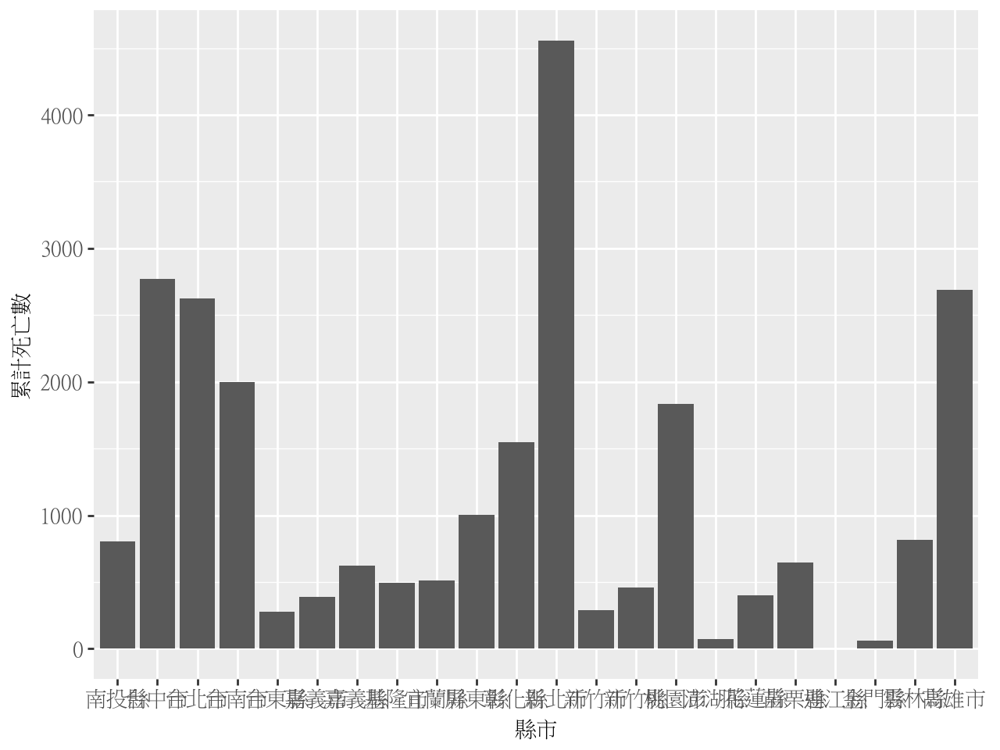

In [ ]:
ggplot(data=covid_df_county, mapping=aes(x='縣市', y='累計死亡數'))+\
  geom_bar (stat='identity')+\
  theme (text=element_text(fontproperties=aaa))

計算各縣市累計確診人數

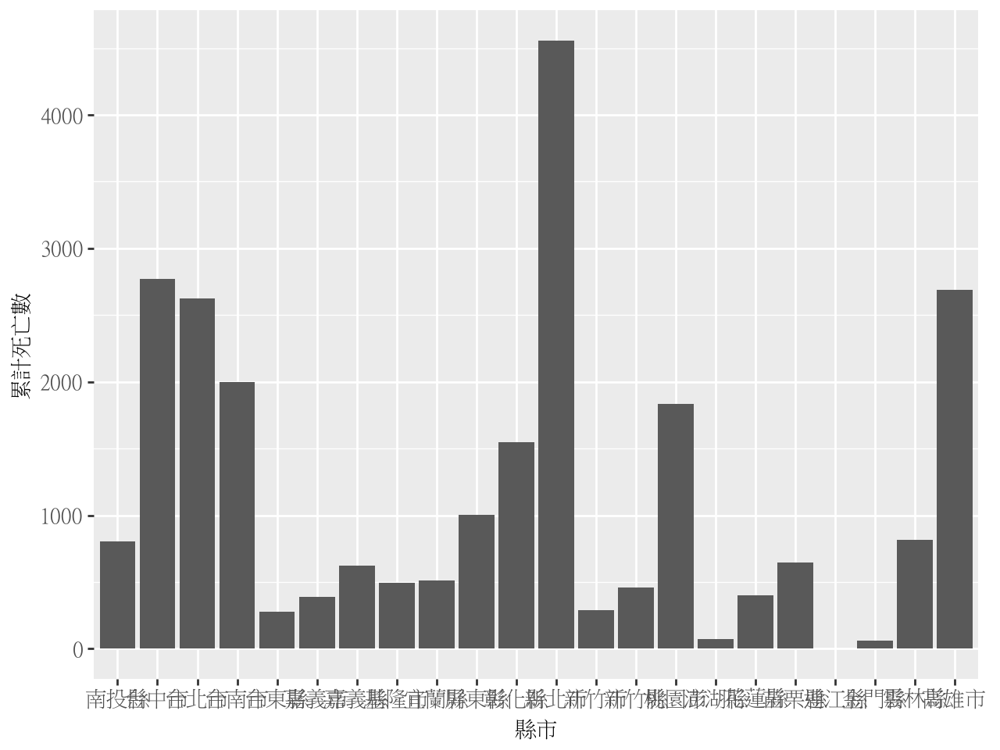

In [ ]:
(ggplot(data=covid_df_county, mapping=aes(x='縣市', y='累計死亡數'))+
  geom_bar (stat='identity')+
  theme (text=element_text(fontproperties=aaa)))

**依據累計確診人數排序: x='reorder(變數名,要排序的變數)”,要排序的變數即為y軸的變數**

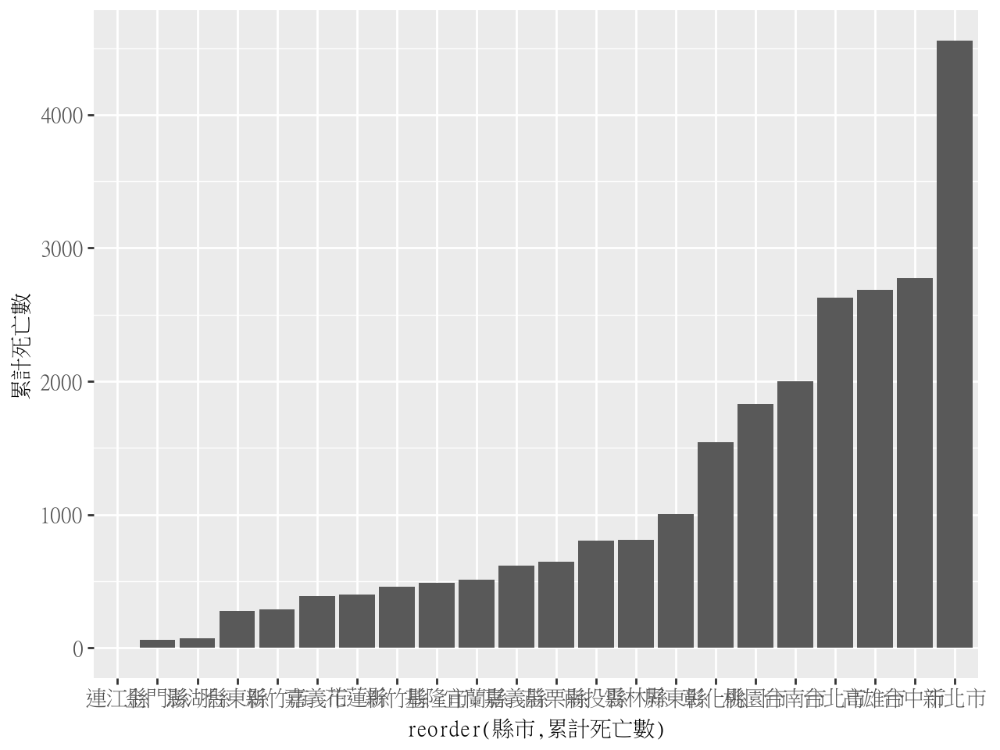

In [ ]:
ggplot(data=covid_df_county, mapping=aes (x='reorder(縣市,累計死亡數)', y='累計死亡數')) +\
  geom_bar(stat='identity')+\
  theme(text=element_text(fontproperties=aaa))

**遞減排序(由高至低)**

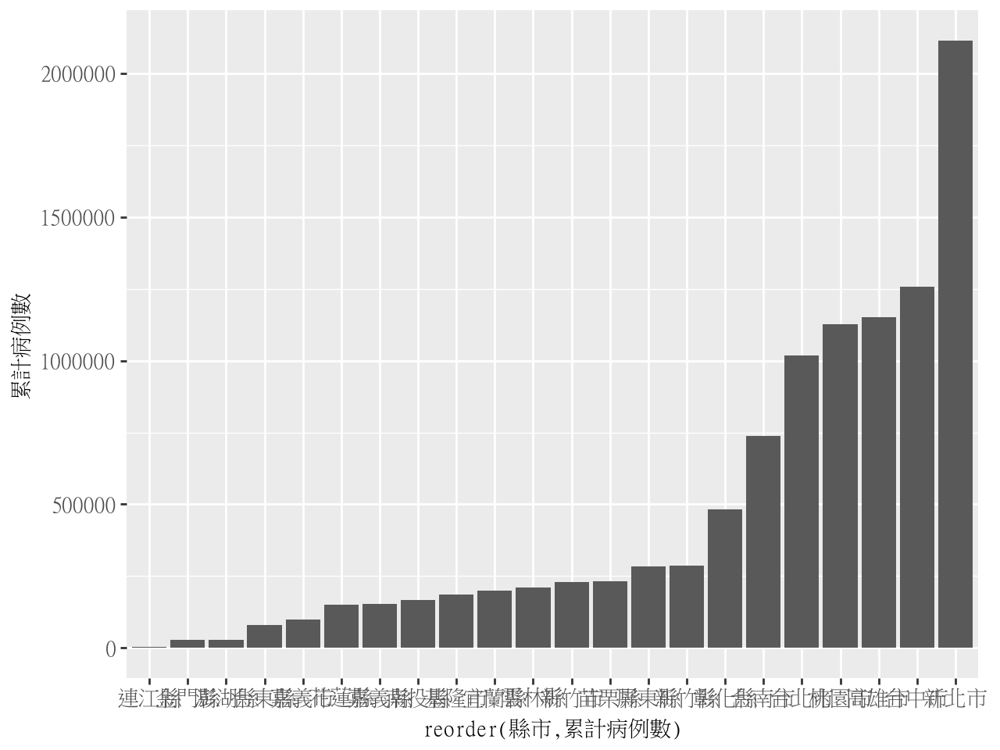

In [ ]:
ggplot(data=covid_df_county, mapping=aes (x='reorder(縣市,累計死亡數)', y='累計死亡數')) +\
  geom_bar(stat='identity')+\
  theme(text=element_text(fontproperties=aaa))

**加入標題**

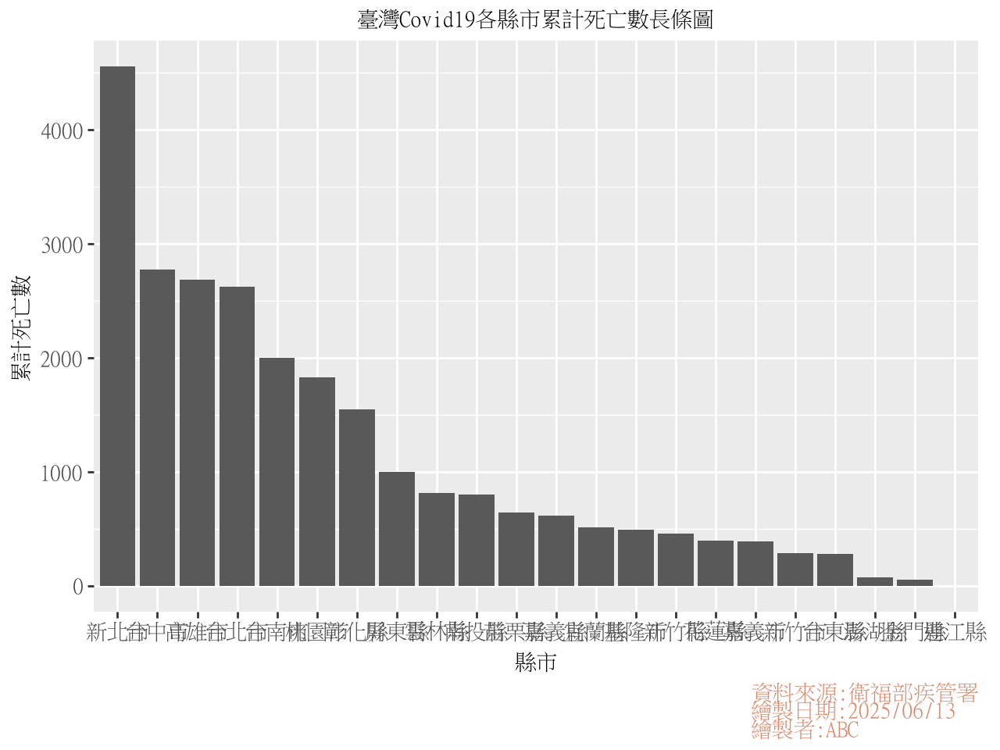

In [ ]:
ggplot(data=covid_df_county, mapping=aes(x='reorder(縣市, -累計死亡數)', y='累計死亡數')) + \
    geom_bar(stat='identity') + \
    labs(title='臺灣Covid19各縣市累計死亡數長條圖',
        x='縣市',
        y='累計死亡數',
        caption='資料來源:衛福部疾管署\n繪製日期:' + pd.Timestamp("today").strftime("%Y/%m/%d") + '\n繪製者:ABC'
    ) +\
    theme(
        text=element_text(fontproperties=aaa),
        plot_caption=element_text(fontproperties=aaa, color='#DB886C', size=12)
    )


In [ ]:
from mizani. formatters import comma_format

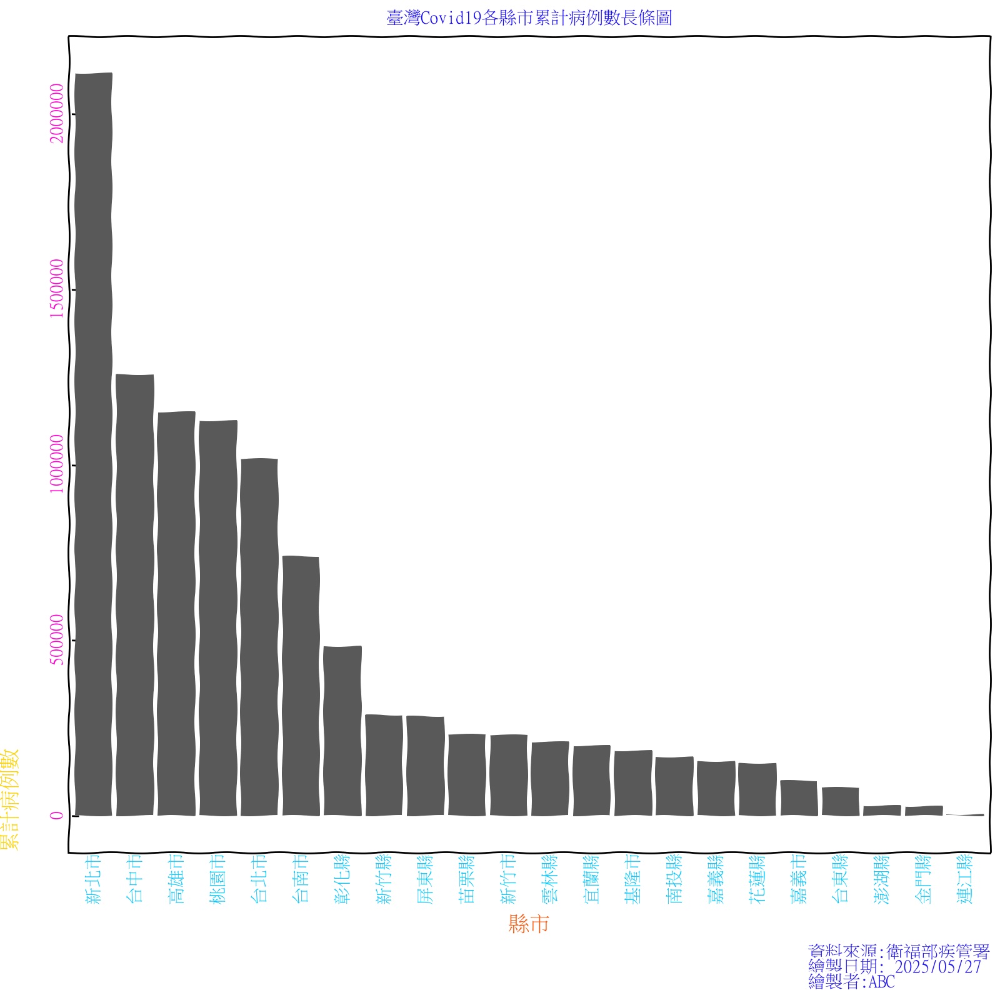

In [ ]:
ggplot(data=covid_df_county, mapping=aes(x='reorder(縣市, -累計死亡數)', y='累計死亡數')) + \
    geom_bar(stat='identity') + \
    labs(
        title='臺灣Covid19各縣市累計死亡數長條圖',
        x='縣市',
        y='累計死亡數',
        caption='資料來源:衛福部疾管署\n繪製日期: ' + pd.Timestamp("today").strftime("%Y/%m/%d") + '\n繪製者:ABC'
    ) + \
    theme_xkcd() + \
    theme(
        text=element_text(fontproperties=aaa),
        plot_title=element_text(fontproperties=aaa, color="#1105fc", weight='bold', ha='center', size=14),
        axis_title_x=element_text(fontproperties=aaa, style='italic', color='#fc5305', ha='center', size=12),
        axis_title_y=element_text(fontproperties=aaa, color='#fcd305', va='bottom', ha='center', size=12),
        axis_text_x=element_text(fontproperties=aaa, color='#05c7fc', rotation=90, size=10, ha='center'),
        axis_text_y=element_text(fontproperties=aaa, color='#fc05cf', rotation=90, size=10, va='center'),
        axis_ticks_major_x=element_blank(),
        plot_caption=element_text(fontproperties=aaa, color='#2318f0', size=10),
        figure_size=(8, 8)
    )

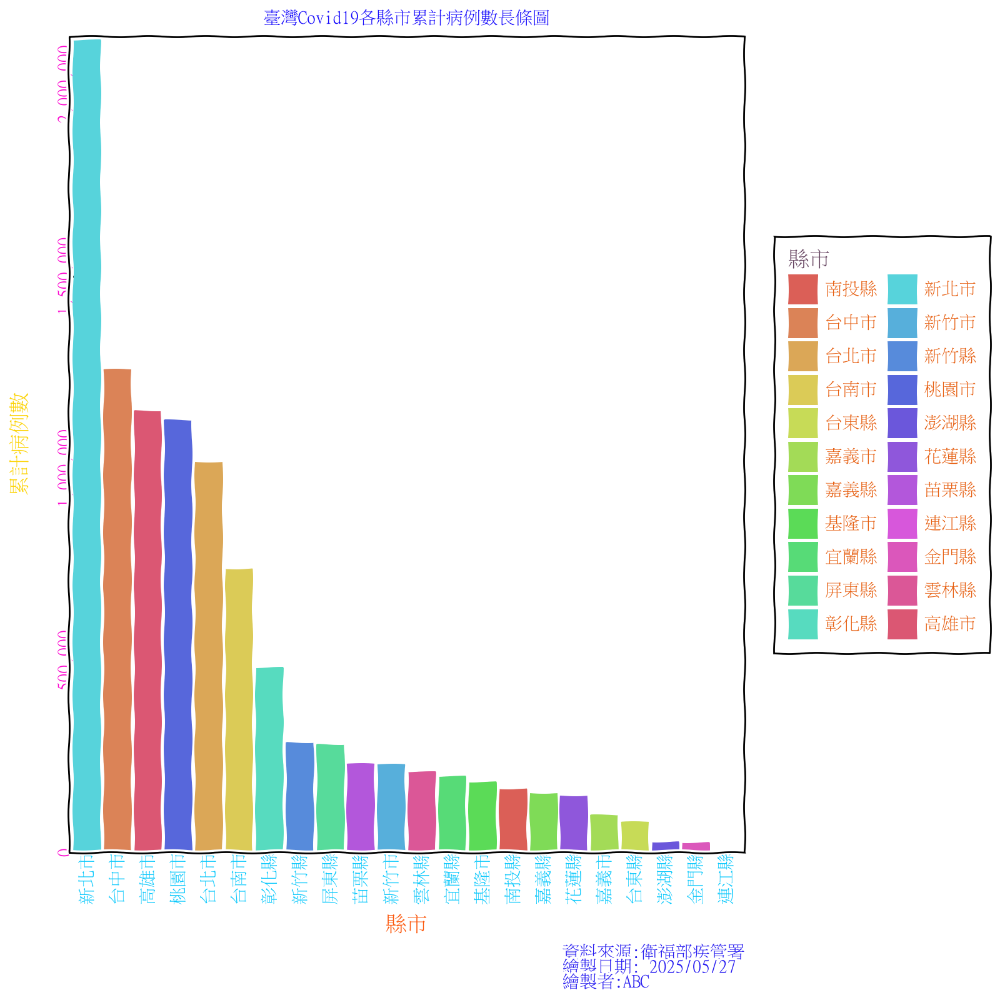

In [ ]:
ggplot(data=covid_df_county, mapping=aes(x='reorder(縣市, -累計死亡數)', y='累計死亡數', fill='縣市')) + \
    geom_bar(stat='identity') + \
    scale_y_continuous(
        expand=(0, 0),
        limits=[0, max(covid_df_county['累計死亡數']) + 1e4],
        labels=comma_format()
    ) + \
    labs(
        title='臺灣Covid19各縣市累計死亡數長條圖',
        x='縣市',
        y='累計死亡數',
        caption='資料來源:衛福部疾管署\n繪製日期: ' + pd.Timestamp("today").strftime("%Y/%m/%d") + '\n繪製者:ABC'
    ) + \
    theme_xkcd() + \
    theme(
        text=element_text(fontproperties=aaa),
        plot_title=element_text(fontproperties=aaa, color='#1105fc', weight='bold', ha='center', size=14),
        axis_title_x=element_text(fontproperties=aaa, style='italic', color='#fc5305', ha='center', size=12),
        axis_title_y=element_text(fontproperties=aaa, color='#fcd305', va='center', size=12),
        axis_text_x=element_text(fontproperties=aaa, color='#05c7fc', rotation=90, size=10, ha='center'),
        axis_text_y=element_text(fontproperties=aaa, color='#fc05cf', rotation=90, size=10, va='center', ha='center'),
        axis_ticks_major_x=element_blank(),
        plot_caption=element_text(fontproperties=aaa, color='#2318f0', size=10),
        legend_title=element_text(fontproperties=aaa, color='#664460', size=12),
        legend_text=element_text(fontproperties=aaa, color='#e65b0b', size=10),
        figure_size=(8, 8)
    )

In [ ]:
myplot1= ggplot(data=covid_df_county, mapping=aes(x='reorder(縣市, -累計死亡數)', y='累計死亡數', fill='縣市')) + \
    geom_bar(stat='identity') + \
    scale_y_continuous(
        expand=(0, 0),
        limits=[0, max(covid_df_county['累計死亡數']) + 1e4],
        labels=comma_format()
    ) + \
    labs(
        title='臺灣Covid19各縣市累計死亡數長條圖',
        x='縣市',
        y='累計死亡數',
        caption='資料來源:衛福部疾管署\n繪製日期: ' + pd.Timestamp("today").strftime("%Y/%m/%d") + '\n繪製者:ABC'
    ) + \
    theme_xkcd() + \
    theme(
        text=element_text(fontproperties=aaa),
        plot_title=element_text(fontproperties=aaa, color='#1105fc', weight='bold', ha='center', size=14),
        axis_title_x=element_text(fontproperties=aaa, style='italic', color='#fc5305', ha='center', size=12),
        axis_title_y=element_text(fontproperties=aaa, color='#fcd305', va='center', size=12),
        axis_text_x=element_text(fontproperties=aaa, color='#05c7fc', rotation=90, size=10, ha='center'),
        axis_text_y=element_text(fontproperties=aaa, color='#fc05cf', rotation=90, size=10, va='center', ha='center'),
        axis_ticks_major_x=element_blank(),
        plot_caption=element_text(fontproperties=aaa, color='#2318f0', size=10),
        legend_title=element_text(fontproperties=aaa, color='#664460', size=12),
        legend_text=element_text(fontproperties=aaa, color='#e65b0b', size=10),
        figure_size=(8, 8)
    )

In [ ]:
for width in [4, 6, 8, 10]:
  figure_save = "save-width-" + str(width) + ".png"
  print (figure_save)
  myplot1.save(figure_save, width=width, height=width*0.6, dpi=300, verbose=False)

save-width-4.png
save-width-6.png
save-width-8.png
save-width-10.png


In [ ]:
covid_df_county.sort_values('累計死亡數', ascending=False)

,縣市,累計病例數
11,新北市,2115096
1,台中市,1257776
21,高雄市,1150822
14,桃園市,1125829
2,台北市,1017095
3,台南市,738485
10,彰化縣,482788
13,新竹縣,286656
9,屏東縣,282831
17,苗栗縣,231587


In [ ]:
city_order=covid_df_county.sort_values('累計死亡數',ascending=False) ['縣市']

In [ ]:
city_order

,縣市
11,新北市
1,台中市
21,高雄市
14,桃園市
2,台北市
3,台南市
10,彰化縣
13,新竹縣
9,屏東縣
17,苗栗縣


In [ ]:
covid_df_county_1 = covid_df_county.assign(縣市 = pd. Categorical (covid_df_county['縣市'], categories=city_order, ordered=True))

In [ ]:
covid_df_county_1['縣市'].unique()

['南投縣', '台中市', '台北市', '台南市', '台東縣', ..., '苗栗縣', '連江縣', '金門縣', '雲林縣', '高雄市']
Length: 22
Categories (22, object): ['新北市' < '台中市' < '高雄市' < '桃園市' ... '台東縣' < '澎湖縣' < '金門縣' < '連江縣']

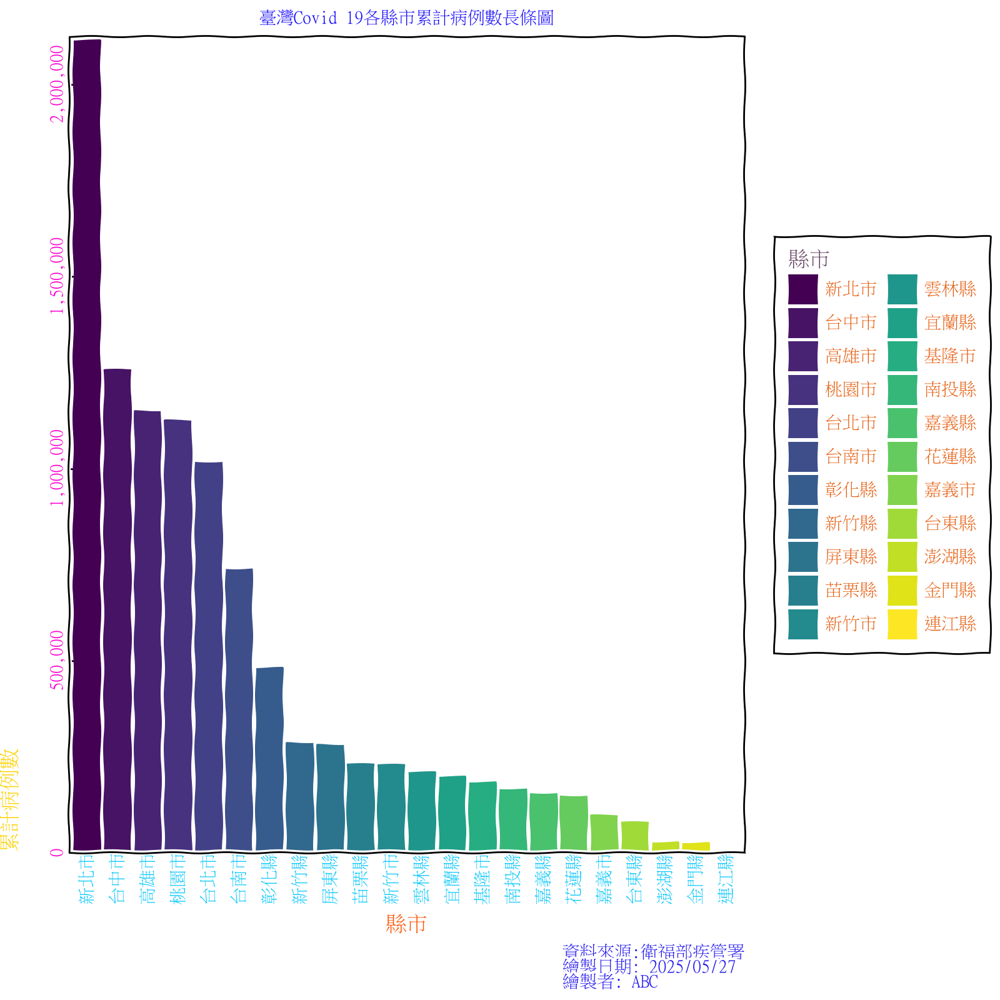

In [ ]:
ggplot(data=covid_df_county_1, mapping=aes(x='縣市', y='累計死亡數', fill='縣市')) + \
    geom_bar(stat='identity') + \
    scale_y_continuous(
        expand=(0, 0),
        limits=[0, max(covid_df_county_1['累計死亡數']) + 10000],
        labels=comma_format()
    ) + \
    labs(
        title='臺灣Covid 19各縣市累計死亡數長條圖',
        x='縣市',
        y='累計死亡數',
        caption="資料來源:衛福部疾管署\n繪製日期: " + pd.Timestamp("today").strftime("%Y/%m/%d") + "\n繪製者: ABC"
    ) + \
    theme_xkcd() + \
    theme(
        text=element_text(fontproperties=aaa),
        plot_title=element_text(fontproperties=aaa, color='#1105fc', weight='bold', ha='center', size=14),
        axis_title_x=element_text(fontproperties=aaa, style='italic', color='#fc5305', ha='center', size=12),
        axis_title_y=element_text(fontproperties=aaa, color='#fcd305', va='bottom', ha='center', size=12),
        axis_text_x=element_text(fontproperties=aaa, color='#05c7fc', rotation=90, size=10, ha='center'),
        axis_text_y=element_text(fontproperties=aaa, color='#fc05cf', rotation=90, size=10, va='center'),
        axis_ticks_major_x=element_blank(),
        plot_caption=element_text(fontproperties=aaa, color='#2318f0', size=10),
        legend_title=element_text(fontproperties=aaa, color='#664460', size=12),
        legend_text=element_text(fontproperties=aaa, color='#e65b0b', size=10),
        figure_size=(8, 8)
    )

改變顏色
scale_color_discrete，
scale_color_hue

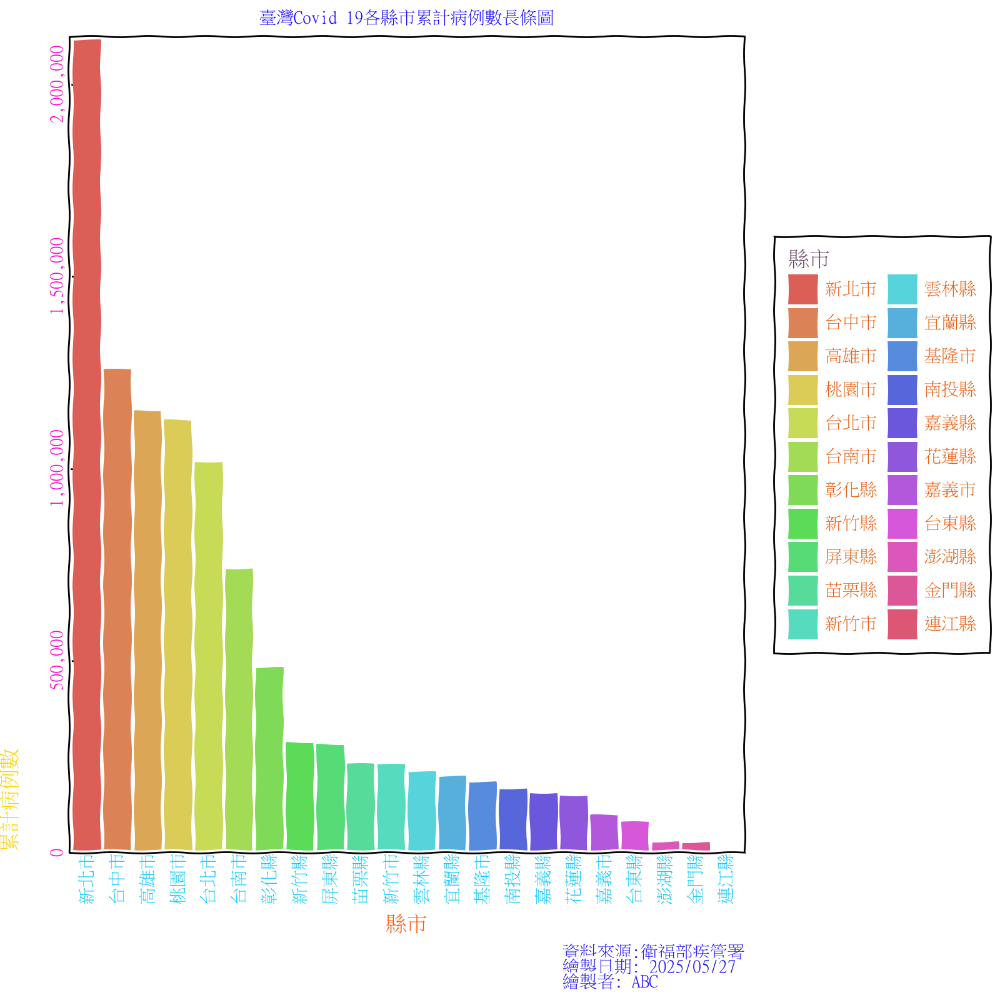

In [ ]:
ggplot(data=covid_df_county_1, mapping=aes(x='縣市', y='累計死亡數', fill='縣市')) + \
    geom_bar(stat='identity') + \
    scale_color_discrete(aesthetics=['fill'])+\
    scale_y_continuous(
        expand=(0, 0),
        limits=[0, max(covid_df_county_1['累計死亡數']) + 10000],
        labels=comma_format()
    ) + \
    labs(
        title='臺灣Covid 19各縣市累計死亡數長條圖',
        x='縣市',
        y='累計死亡數',
        caption="資料來源:衛福部疾管署\n繪製日期: " + pd.Timestamp("today").strftime("%Y/%m/%d") + "\n繪製者: ABC"
    ) + \
    theme_xkcd() + \
    theme(
        text=element_text(fontproperties=aaa),
        plot_title=element_text(fontproperties=aaa, color='#1105fc', weight='bold', ha='center', size=14),
        axis_title_x=element_text(fontproperties=aaa, style='italic', color='#fc5305', ha='center', size=12),
        axis_title_y=element_text(fontproperties=aaa, color='#fcd305', va='bottom', ha='center', size=12),
        axis_text_x=element_text(fontproperties=aaa, color='#05c7fc', rotation=90, size=10, ha='center'),
        axis_text_y=element_text(fontproperties=aaa, color='#fc05cf', rotation=90, size=10, va='center'),
        axis_ticks_major_x=element_blank(),
        plot_caption=element_text(fontproperties=aaa, color='#2318f0', size=10),
        legend_title=element_text(fontproperties=aaa, color='#664460', size=12),
        legend_text=element_text(fontproperties=aaa, color='#e65b0b', size=10),
        figure_size=(8, 8)
    )

scale_color_hue(h=0.01, I=0.6, s=0.65, color_space='hls')
h: float, first hue. Must be in the range [0, 1] Default is 0.01
I: float, lightness. Must be in the range [0, 1] Default is 0.6
s: float, saturation. Must be in the range [0, 1] Default is 0.65
colorspace: str in ['hls', 'husl'()]
色相(H)是色彩的基本屬性,就是平常所說的顏色名稱,如紅色、黃色等。
明度(V),亮度(L),取0-100%。
飽和度(S)是指色彩的純度,越高色彩越純,低則逐漸變灰,取0-100%的數值。

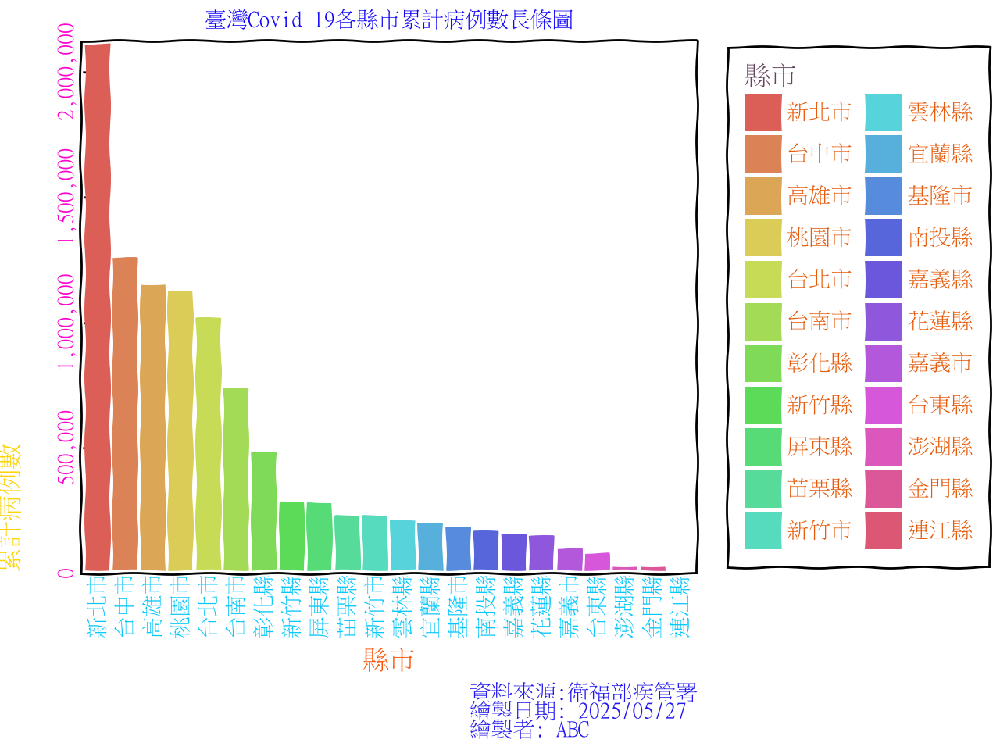

In [ ]:
ggplot(data=covid_df_county_1, mapping=aes(x='縣市', y='累計死亡數', fill='縣市')) + \
    geom_bar(stat='identity') + \
    scale_colour_hue(aesthetics=['fill']) + \
    scale_y_continuous(
        expand=(0, 0),
        limits=[0, max(covid_df_county_1['累計死亡數']) + 10000],
        labels=comma_format()
    ) + \
    labs(
        title='臺灣Covid 19各縣市累計死亡數長條圖',
        x='縣市',
        y='累計死亡數',
        caption='資料來源:衛福部疾管署\n繪製日期: ' + pd.Timestamp("today").strftime("%Y/%m/%d") + '\n繪製者: ABC'
    ) + \
    theme_xkcd() + \
    theme(
        text=element_text(fontproperties=aaa),
        plot_title=element_text(fontproperties=aaa, color='#1105fc', weight='bold', ha='center', size=14),
        axis_title_x=element_text(fontproperties=aaa, style='italic', color='#fc5305', ha='center', size=12),
        axis_title_y=element_text(fontproperties=aaa, color='#fcd305', va='bottom', ha='center', size=12),
        axis_text_x=element_text(fontproperties=aaa, color='#05c7fc', rotation=90, size=10, ha='center'),
        axis_text_y=element_text(fontproperties=aaa, color='#fc05cf', rotation=90, size=10, va='center'),
        axis_ticks_major_x=element_blank(),
        plot_caption=element_text(fontproperties=aaa, color='#2318f0', size=10),
        legend_title=element_text(fontproperties=aaa, color='#664460', size=12),
        legend_text=element_text(fontproperties=aaa, color='#e65b0b', size=10)
    )

In [ ]:
covid_df_county_1['累計死亡數分類'] = pd.qcut(covid_df_county_1['累計死亡數'], 2, labels=['低','高'])
covid_df_county_1

,縣市,累計病例數,累計病例數分類
0,南投縣,167073,低
1,台中市,1257776,高
2,台北市,1017095,高
3,台南市,738485,高
4,台東縣,80890,低
5,嘉義市,98944,低
6,嘉義縣,154427,低
7,基隆市,184433,低
8,宜蘭縣,199529,低
9,屏東縣,282831,高


**以累計死亡數中位數為依據區分為低與高,分別繪製長條圖**

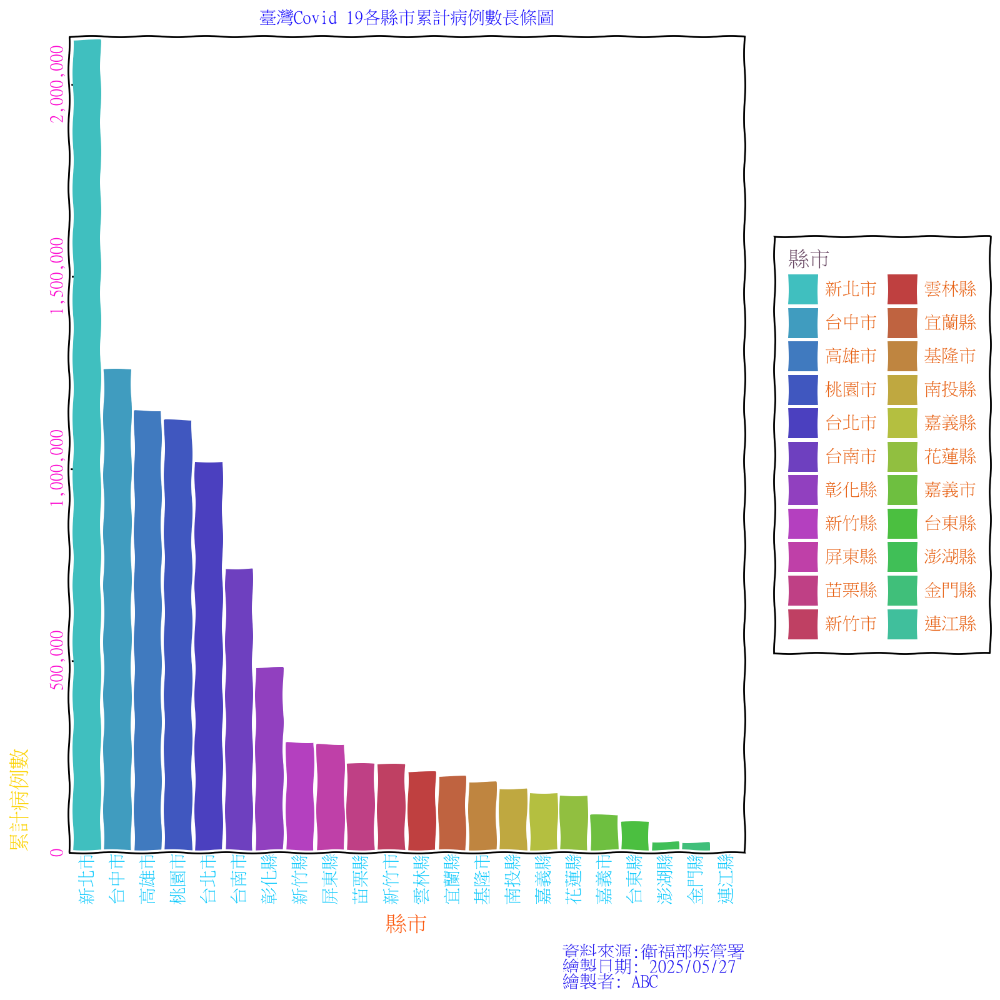

In [ ]:
ggplot(data=covid_df_county_1, mapping=aes(x='縣市', y='累計死亡數', fill='縣市')) + \
    geom_bar(stat='identity') + \
    scale_colour_hue(h=0.5, l=0.5, s=0.5, aesthetics=['fill']) + \
    scale_y_continuous(
        expand=(0, 0),
        limits=[0, max(covid_df_county_1['累計死亡數']) + 1e4],
        labels=comma_format()
    ) + \
    labs(
        title='臺灣Covid 19各縣市累計死亡數長條圖',
        x='縣市',
        y='累計死亡數',
        caption="資料來源:衛福部疾管署\n繪製日期: " + pd.Timestamp("today").strftime("%Y/%m/%d") + "\n繪製者: ABC"
    ) + \
    theme_xkcd() + \
    theme(
        text=element_text(fontproperties=aaa),
        plot_title=element_text(fontproperties=aaa, color='#1105fc', weight='bold', ha='center', size=14),
        axis_title_x=element_text(fontproperties=aaa, style='italic', color='#fc5305', ha='center', size=12),
        axis_title_y=element_text(fontproperties=aaa, color='#fcd305', va='bottom', size=12),
        axis_text_x=element_text(fontproperties=aaa, color='#05c7fc', rotation=90, size=10, ha='center'),
        axis_text_y=element_text(fontproperties=aaa, color='#fc05cf', rotation=90, size=10, va='center'),
        axis_ticks_major_x=element_blank(),
        plot_caption=element_text(fontproperties=aaa, color='#2318f0', size=10),
        legend_title=element_text(fontproperties=aaa, color='#664460', size=12),
        legend_text=element_text(fontproperties=aaa, color='#e65b0b', size=10),
        figure_size=(8, 8)
    )

以累計死亡數為依據區分為低、中與高,分別繪製長條圖

In [ ]:
covid_df_county_1['累計死亡數分類'] = pd. qcut (covid_df_county_1['累計死亡數'], 3, labels=['低','中','高'])
covid_df_county_1

,縣市,累計病例數,累計病例數分類
0,南投縣,167073,中
1,台中市,1257776,高
2,台北市,1017095,高
3,台南市,738485,高
4,台東縣,80890,低
5,嘉義市,98944,低
6,嘉義縣,154427,低
7,基隆市,184433,中
8,宜蘭縣,199529,中
9,屏東縣,282831,中


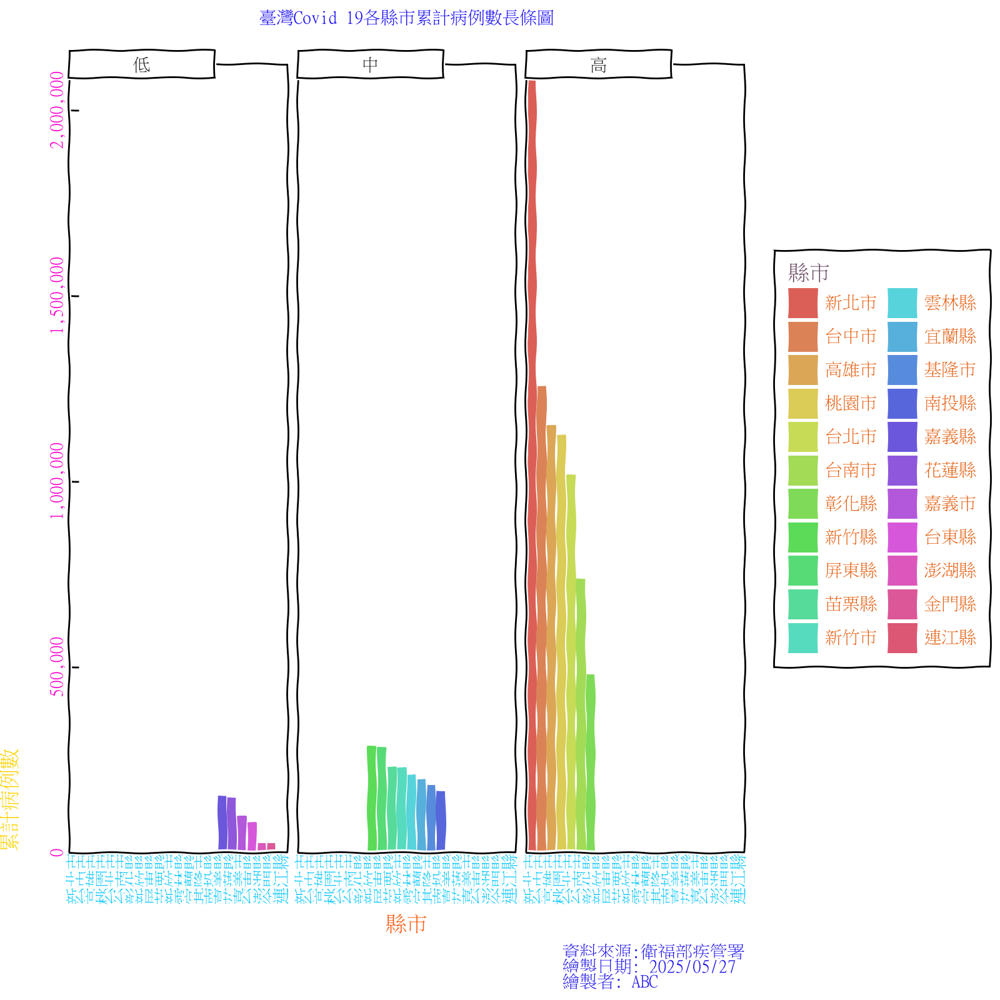

In [ ]:
ggplot(data=covid_df_county_1, mapping=aes(x='縣市', y='累計死亡數', fill='縣市')) + \
    geom_bar(stat='identity') +\
    scale_colour_discrete(aesthetics=['fill']) +\
    scale_y_continuous(
        expand=(0, 0),
        limits=[0, max(covid_df_county_1['累計死亡數']) + 1e4],
        labels=comma_format()
    ) +\
    labs(
        title='臺灣Covid 19各縣市累計死亡數長條圖',
        x='縣市',
        y='累計死亡數',
        caption="資料來源:衛福部疾管署\n繪製日期: " + pd.Timestamp("today").strftime("%Y/%m/%d") + "\n繪製者: ABC"
    ) +\
    theme_xkcd() +\
    theme(
        text=element_text(fontproperties=aaa),
        plot_title=element_text(fontproperties=aaa, color='#1105fc', weight='bold', ha='center', size=14),
        axis_title_x=element_text(fontproperties=aaa, style='italic', color='#fc5305', ha='center', size=12),
        axis_title_y=element_text(fontproperties=aaa, color='#fcd305', va='bottom', ha='center', size=12),
        axis_text_x=element_text(fontproperties=aaa, color='#05c7fc', rotation=90, size=10, ha='center'),
        axis_text_y=element_text(fontproperties=aaa, color='#fc05cf', rotation=90, size=10, va='center'),
        axis_ticks_major_x=element_blank(),
        plot_caption=element_text(fontproperties=aaa, color='#2318f0', size=10),
        legend_title=element_text(fontproperties=aaa, color='#664460', size=12),
        legend_text=element_text(fontproperties=aaa, color='#e65b0b', size=10),
        figure_size=(8,8)
    ) +\
    facet_grid('.~累計死亡數分類')  # 若有這欄位，否則請移除

# **各縣市累計死亡數直線圖(開始區)**

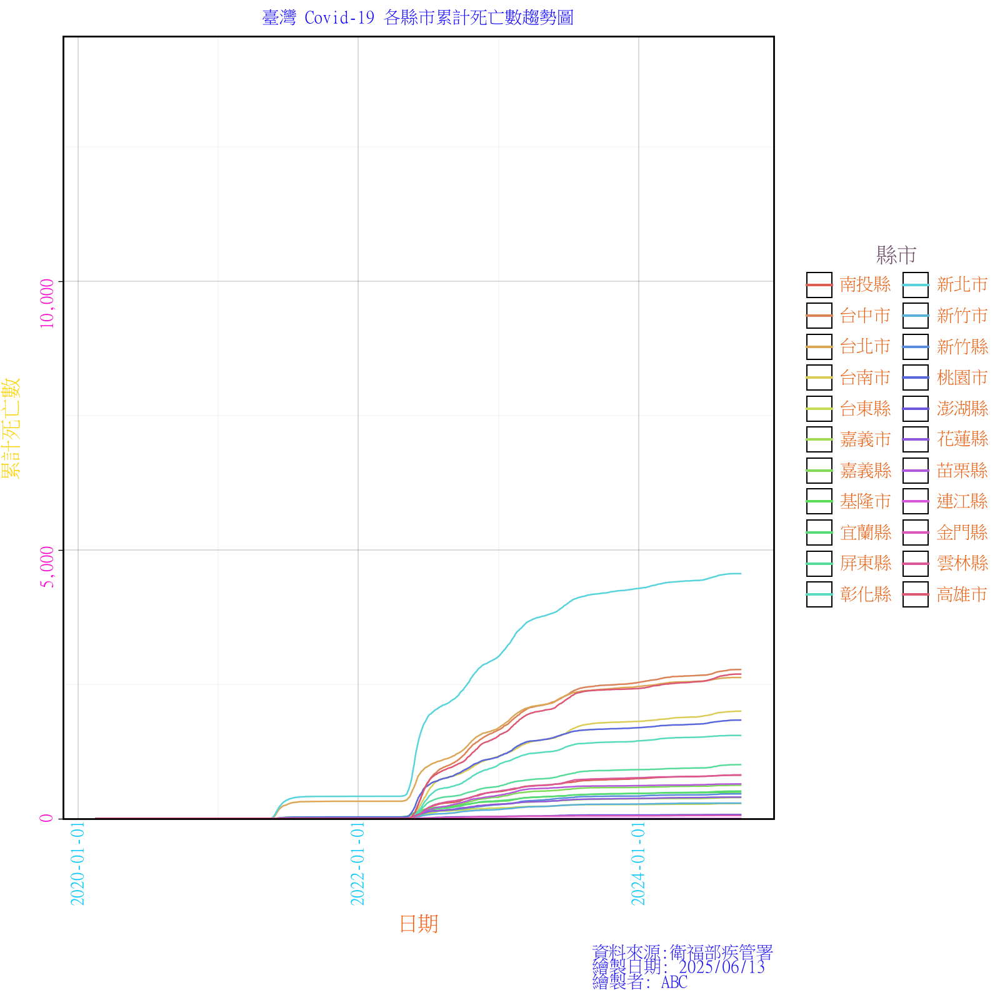

In [ ]:
from plotnine import *
from mizani.formatters import comma_format
import pandas as pd

(
    ggplot(covid_county_daily, aes(x='死亡日', y='累計死亡數', color='縣市')) +
    geom_line() +
    scale_y_continuous(
        expand=(0, 0),
        limits=(0, covid_county_daily['累計死亡數'].max() + 10000),
        labels=comma_format()
) +
    labs(
        title='臺灣 Covid-19 各縣市累計死亡數趨勢圖',
        x='日期',
        y='累計死亡數',
        caption='資料來源:衛福部疾管署\n繪製日期: ' +
                pd.Timestamp("today").strftime("%Y/%m/%d") +
                '\n繪製者: ABC'
    ) +
    theme_linedraw() +
    theme(
        text=element_text(fontproperties=aaa),
        plot_title=element_text(color='#1105fc', weight='bold', ha='center', size=14),
        axis_title_x=element_text(family='Noto Sans TC', style='italic', color='#fc5305', ha='center', size=12),
        axis_title_y=element_text(family='Noto Sans TC', color='#fcd305', ha='center', size=12),
        axis_text_x=element_text(family='Lobster', color='#05c7fc', rotation=90, size=10, ha='center'),
        axis_text_y=element_text(family='Bungee Shade', color='#fc05cf', rotation=90, size=10),
        axis_ticks_major_x=element_blank(),
        plot_caption=element_text(family='Noto Sans TC', color='#2318f0', size=10),
        legend_title=element_text(family='Kai', color='#664460', size=12, ha='center'),
        legend_text=element_text(family='Noto Sans TC', color='#e65b0b', size=10),
        figure_size=(8, 8)
    )
)


In [ ]:
_.save("/content/my_plot_.png")

/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:615: PlotnineWarning: Saving 8 x 8 in image.
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:616: PlotnineWarning: Filename: /content/my_plot_.png


/usr/local/lib/python3.11/dist-packages/mizani/breaks.py:448: FutureWarning: Passing the width as the parameter has been deprecated and will not work in a future version. Use breaks_date(width="4 years")


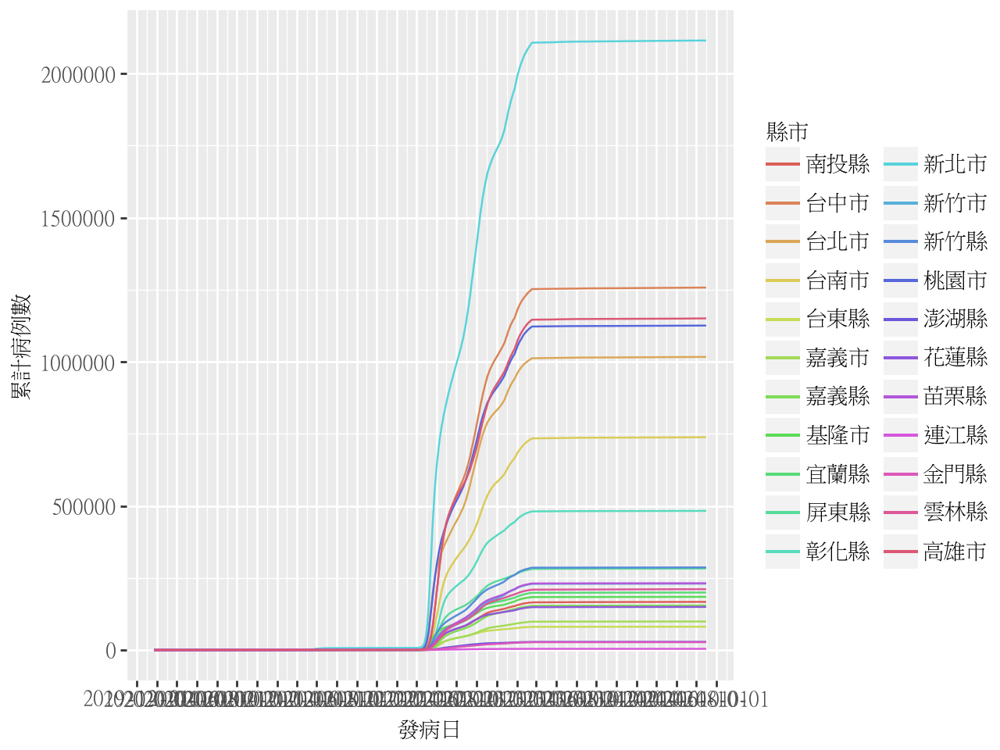

In [ ]:
ggplot(covid_county_daily, aes (x='死亡日',y='累計死亡數', color='縣市')) +\
  geom_line()+\
  scale_x_date(date_breaks='2 months') +\
  theme (text=element_text(fontproperties=aaa))

調整日期間格：scale x date , scale x datetime

/usr/local/lib/python3.11/dist-packages/mizani/breaks.py:448: FutureWarning: Passing the width as the parameter has been deprecated and will not work in a future version. Use breaks_date(width="4 years")


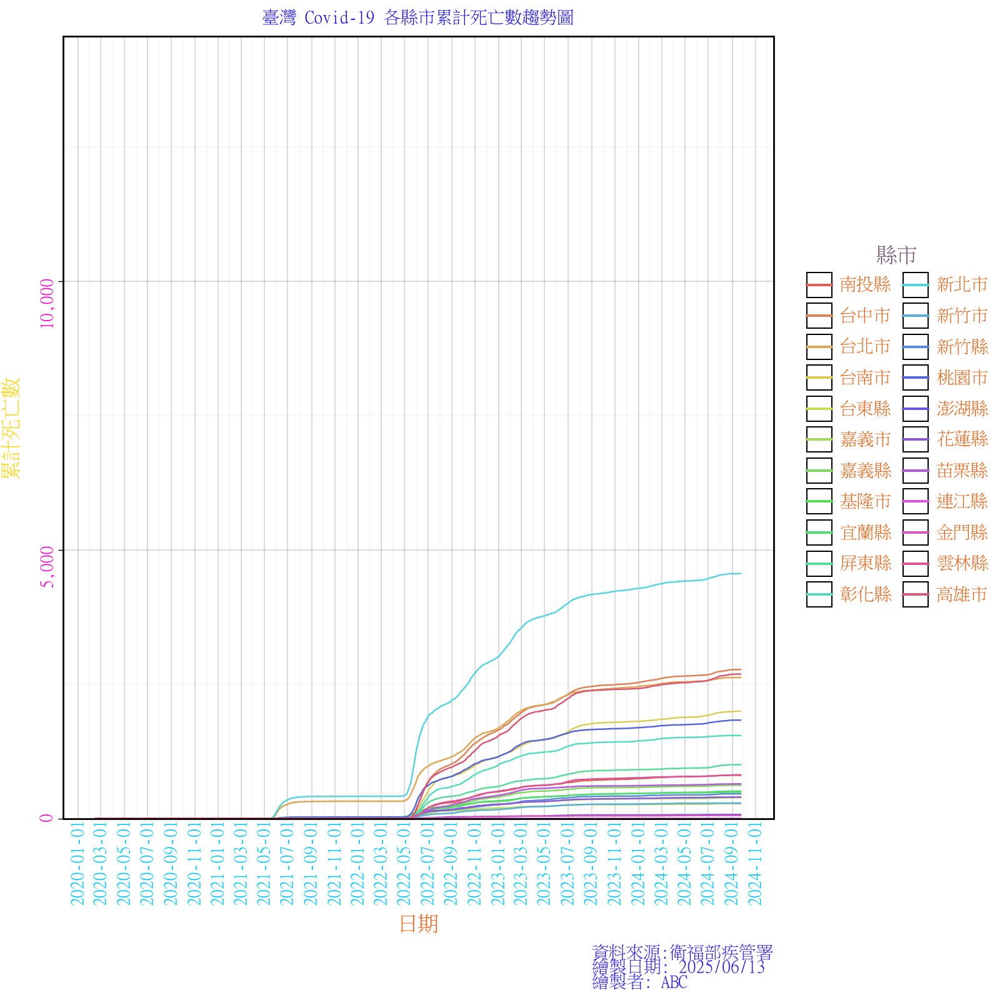

In [ ]:
from plotnine import *
from mizani.formatters import comma_format
import pandas as pd

(
    ggplot(covid_county_daily, aes(x='死亡日', y='累計死亡數', color='縣市')) +
    geom_line() +
    scale_y_continuous(
        expand=(0, 0),
        limits=(0, covid_county_daily['累計死亡數'].max() + 1e4),
        labels=comma_format()
) +
    scale_x_date(date_breaks='2 months') +\
    labs(
        title='臺灣 Covid-19 各縣市累計死亡數趨勢圖',
        x='日期',
        y='累計死亡數',
        caption='資料來源:衛福部疾管署\n繪製日期: ' +
                pd.Timestamp("today").strftime("%Y/%m/%d") +
                '\n繪製者: ABC'
    ) +
    theme_linedraw() +
    theme(
        text=element_text(fontproperties=aaa),
        plot_title=element_text(color='#1105fc', weight='bold', ha='center', size=14),
        axis_title_x=element_text(family='Noto Sans TC', style='italic', color='#fc5305', ha='center', size=12),
        axis_title_y=element_text(family='Noto Sans TC', color='#fcd305', ha='center', size=12),
        axis_text_x=element_text(family='Lobster', color='#05c7fc', rotation=90, size=10, ha='center'),
        axis_text_y=element_text(family='Bungee Shade', color='#fc05cf', rotation=90, size=10),
        axis_ticks_major_x=element_blank(),
        plot_caption=element_text(family='Noto Sans TC', color='#2318f0', size=10),
        legend_title=element_text(family='Kai', color='#664460', size=12, ha='center'),
        legend_text=element_text(family='Noto Sans TC', color='#e65b0b', size=10),
        figure_size=(8, 8)
    )
)


**最後一年累計確診人數趨勢圖**

In [ ]:
from pandas.tseries.offsets import DateOffset
n=12
covid_df['死亡日'].max() + DateOffset(months=n)

Timestamp('2025-09-25 00:00:00')

In [ ]:
covid_county_daily['死亡日'] = covid_df ['死亡日'].max()+ DateOffset (months=-n)

In [ ]:
covid_county_daily_1 = covid_county_daily[covid_county_daily['死亡日'] >= covid_df['死亡日'].max() + DateOffset (months=-n)]

In [ ]:
(covid_df['死亡日'].max() + DateOffset (months=-n)).strftime("%Y/%m/%d")

'2023/09/25'

/usr/local/lib/python3.11/dist-packages/mizani/breaks.py:448: FutureWarning: Passing the width as the parameter has been deprecated and will not work in a future version. Use breaks_date(width="4 years")


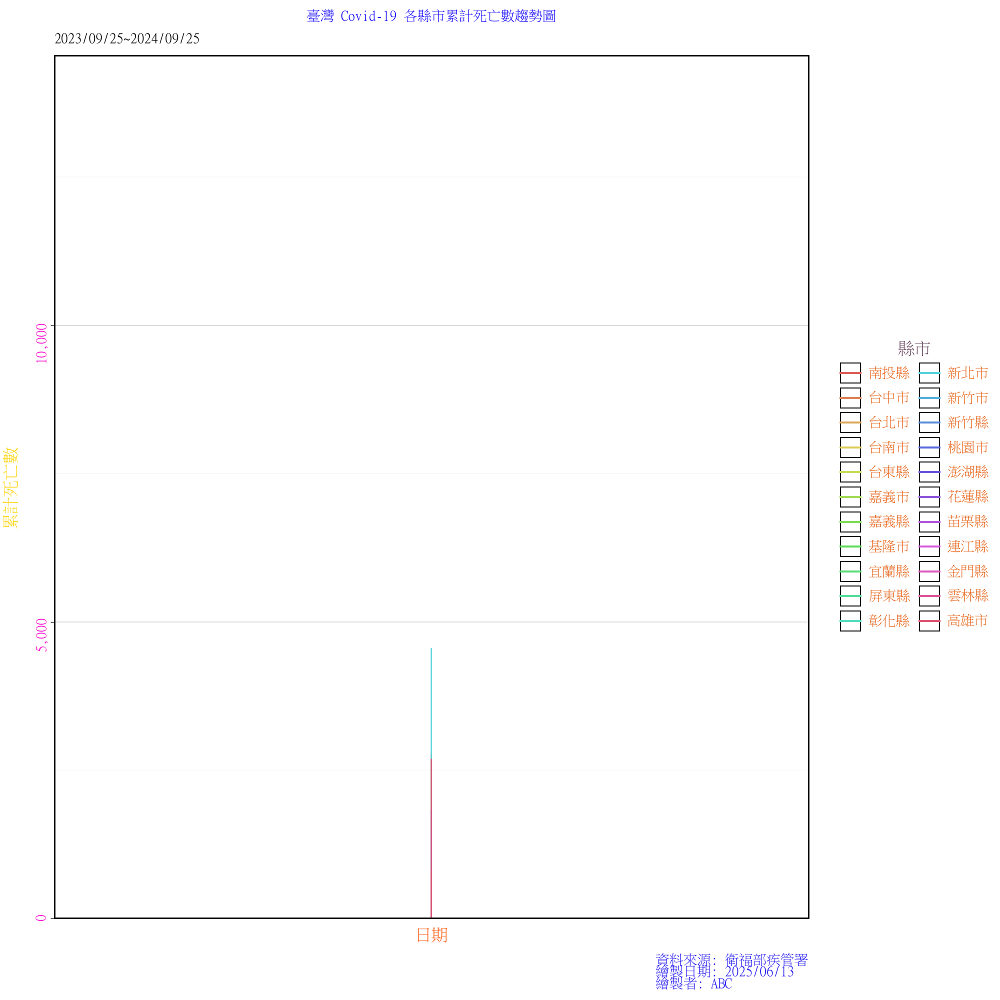

In [ ]:
ggplot(covid_county_daily_1, aes(x='死亡日', y='累計死亡數', color='縣市')) +\
  geom_line() +\
  scale_y_continuous(expand=(0, 0),limits=[0, covid_county_daily_1['累計死亡數'].max() + 1e4],
    labels=comma_format()) +\
  scale_x_date(date_breaks='2 weeks') +\
  labs(title='臺灣 Covid-19 各縣市累計死亡數趨勢圖',
      subtitle=(covid_df['死亡日'].max()
        +DateOffset(months=-n)).strftime("%Y/%m/%d")
        + '~'
        +covid_df['死亡日'].max().strftime("%Y/%m/%d"),
      x='日期',
      y='累計死亡數',
      caption='資料來源: 衛福部疾管署\n繪製日期: ' +
              pd.Timestamp("today").strftime("%Y/%m/%d") +
              '\n繪製者: ABC'
    ) +\
  theme_linedraw() +\
  theme(
        text=element_text(fontproperties=aaa),
        plot_title=element_text(color='#1105fc', weight='bold', ha='center', size=14),
        axis_title_x=element_text(family='Noto Sans TC', style='italic', color='#fc5305', ha='center', size=12),
        axis_title_y=element_text(family='Noto Sans TC', color='#fcd305', ha='center', size=12),
        axis_text_x=element_text(family='Lobster', color='#05c7fc', rotation=90, size=10, ha='center'),
        axis_text_y=element_text(family='Bungee Shade', color='#fc05cf', rotation=90, size=10),
        axis_ticks_major_x=element_blank(),
        plot_caption=element_text(family='Noto Sans TC', color='#2318f0', size=10),
        legend_title=element_text(family='Kai', color='#664460', size=12, ha='center'),
        legend_text=element_text(family='Noto Sans TC', color='#e65b0b', size=10),
        figure_size=(10, 10)
    )




##新增區段

In [ ]:
import numpy as np
import pandas as pd
from plotnine import *
from mizani. formatters import comma_format

In [ ]:
city=np.sort(covid_county_daily['縣市'].unique())
city

array(['南投縣', '台中市', '台北市', '台南市', '台東縣', '嘉義市', '嘉義縣', '基隆市', '宜蘭縣',
       '屏東縣', '彰化縣', '新北市', '新竹市', '新竹縣', '桃園市', '澎湖縣', '花蓮縣', '苗栗縣',
       '連江縣', '金門縣', '雲林縣', '高雄市'], dtype=object)

In [ ]:
import ipywidgets as widgests
from IPython.display import display
w = widgests.SelectMultiple(
    options=city,
    value=[city[0]],
    description='縣市',
    disabled=False
)
display(w)


SelectMultiple(description='縣市', index=(0,), options=('南投縣', '台中市', '台北市', '台南市', '台東縣', '嘉義市', '嘉義縣', '基隆市', …

In [ ]:
w.value

('南投縣',)

In [ ]:
type (w.value)



tuple

In [ ]:
covid_county_daily_1[covid_county_daily_1['縣市'].isin(w.value)]

NameError: name 'covid_county_daily_1' is not defined

In [ ]:
'、'.join(w.value)

In [ ]:
ggplot(covid_county_daily_1[covid_county_daily_1['縣市'].isin(w.value)],
       aes(x='死亡日', y='累計死亡數', color='縣市')) +\
  geom_line() +\
  scale_y_continuous(expand=(0, 0),limits=[0, covid_county_daily_1['累計死亡數'].max() + 1e4],
    labels=comma_format()) +\
  scale_x_date(date_breaks='2 weeks') +\
  labs(title='臺灣 Covid-19 各縣市累計死亡數趨勢圖',
      subtitle=(covid_df['死亡日'].max()
        +DateOffset(months=-n)).strftime("%Y/%m/%d")
        + '~'
        +covid_df['死亡日'].max().strftime("%Y/%m/%d"),
      x='日期',
      y='累計死亡數',
      caption='資料來源: 衛福部疾管署\n繪製日期: ' +
              pd.Timestamp("today").strftime("%Y/%m/%d") +
              '\n繪製者: ABC'
    ) +\
  theme_linedraw() +\
  theme(
        text=element_text(fontproperties=aaa),
        plot_title=element_text(color='#1105fc', weight='bold', ha='center', size=14),
        axis_title_x=element_text(family='Noto Sans TC', style='italic', color='#fc5305', ha='center', size=12),
        axis_title_y=element_text(family='Noto Sans TC', color='#fcd305', ha='center', size=12),
        axis_text_x=element_text(family='Lobster', color='#05c7fc', rotation=90, size=10, ha='center'),
        axis_text_y=element_text(family='Bungee Shade', color='#fc05cf', rotation=90, size=10),
        axis_ticks_major_x=element_blank(),
        plot_caption=element_text(family='Noto Sans TC', color='#2318f0', size=10),
        legend_title=element_text(family='Kai', color='#664460', size=12, ha='center'),
        legend_text=element_text(family='Noto Sans TC', color='#e65b0b', size=10),
        figure_size=(10, 10)
    )




**各縣市每日新增病例數直線圖**

In [ ]:
ggplot(covid_county_daily,
       aes(x='死亡日', y='累計死亡數', color='縣市')) +\
  geom_line() +\
  scale_y_continuous(expand=(0, 0),limits=[0, covid_county_daily_1['累計死亡數'].max() + 1e3],
    labels=comma_format()) +\
  scale_x_date(date_breaks='2 weeks') +\
  labs(title='臺灣 Covid-19 各縣市累計死亡數趨勢圖',
      subtitle=(covid_df['死亡日'].max()
        +DateOffset(months=-n)).strftime("%Y/%m/%d")
        + '~'
        +covid_df['死亡日'].max().strftime("%Y/%m/%d"),
      x='日期',
      y='累計死亡數',
      caption='資料來源: 衛福部疾管署\n繪製日期: ' +
              pd.Timestamp("today").strftime("%Y/%m/%d") +
              '\n繪製者: ABC'
    ) +\
  theme_linedraw() +\
  theme(
        text=element_text(fontproperties=aaa),
        plot_title=element_text(color='#1105fc', weight='bold', ha='center', size=14),
        axis_title_x=element_text(family='Noto Sans TC', style='italic', color='#fc5305', ha='center', size=12),
        axis_title_y=element_text(family='Noto Sans TC', color='#fcd305', ha='center', size=12),
        axis_text_x=element_text(family='Lobster', color='#05c7fc', rotation=90, size=10, ha='center'),
        axis_text_y=element_text(family='Bungee Shade', color='#fc05cf', rotation=90, size=10),
        axis_ticks_major_x=element_blank(),
        plot_caption=element_text(family='Noto Sans TC', color='#2318f0', size=10),
        legend_title=element_text(family='Kai', color='#664460', size=12, ha='center'),
        legend_text=element_text(family='Noto Sans TC', color='#e65b0b', size=10),
        figure_size=(10, 10)
    )




In [ ]:
import ipywidgets as widgests
from IPython.display import display
wl=widgests.SelectMultiple(
  options=city,
  value=[city[0]],
  #rows=10,
  description='縣市',
  disabled=False
)
display (wl)

各縣市每日新增病例數直線圖

In [ ]:
ggplot(covid_county_daily,
       aes(x='死亡日', y='累計死亡數', color='縣市')) +\
  geom_line() +\
  scale_y_continuous(expand=(0, 0),limits=[0, covid_county_daily_1['累計死亡數'].max() + 1e3],
    labels=comma_format()) +\
  scale_x_date(date_breaks='2 weeks') +\
  labs(title='臺灣 Covid-19 各縣市累計死亡數趨勢圖',
      subtitle=(covid_df['死亡日'].max()
        +DateOffset(months=-n)).strftime("%Y/%m/%d")
        + '~'
        +covid_df['死亡日'].max().strftime("%Y/%m/%d"),
      x='日期',
      y='累計死亡數',
      caption='資料來源: 衛福部疾管署\n繪製日期: ' +
              pd.Timestamp("today").strftime("%Y/%m/%d") +
              '\n繪製者: ABC'
    ) +\
  theme_linedraw() +\
  theme(
        text=element_text(fontproperties=aaa),
        plot_title=element_text(color='#1105fc', weight='bold', ha='center', size=14),
        axis_title_x=element_text(family='Noto Sans TC', style='italic', color='#fc5305', ha='center', size=12),
        axis_title_y=element_text(family='Noto Sans TC', color='#fcd305', ha='center', size=12),
        axis_text_x=element_text(family='Lobster', color='#05c7fc', rotation=90, size=10, ha='center'),
        axis_text_y=element_text(family='Bungee Shade', color='#fc05cf', rotation=90, size=10),
        axis_ticks_major_x=element_blank(),
        plot_caption=element_text(family='Noto Sans TC', color='#2318f0', size=10),
        legend_title=element_text(family='Kai', color='#664460', size=12, ha='center'),
        legend_text=element_text(family='Noto Sans TC', color='#e65b0b', size=10),
        figure_size=(10, 10)
    )




In [ ]:
w1 = widgests.SelectMultiple(
  options=city,
  value=[city[0]],
  #rows=10,
  description='縣市',
  disabled=False
)
display (w1)

In [ ]:
ggplot(covid_county_daily['縣市'].isin(w1.value),aes(x='死亡日', y='累計死亡數', color='縣市')) +\
  geom_line() +\
  scale_y_continuous(expand=(0,0),limits=[0,max(covid_county_daily['確診病例數'])+ 1e3],
    labels=comma_format()) +\
  scale_x_date(date_breaks='2 month') +\
  labs(title='、'.join(w1.value)+ '臺灣 Covid-19 各縣市每日病例數趨勢圖',
      x='日期',
      y='每日病例數',
      caption='資料來源: 衛福部疾管署\n繪製日期: ' +
              pd.Timestamp("today").strftime("%Y/%m/%d") +
              '\n繪製者: ABC'
    ) +\
  theme_linedraw() +\
  theme(
        text=element_text(fontproperties=aaa),
        plot_title=element_text(color='#1105fc', weight='bold', ha='center', size=14),
        axis_title_x=element_text(family='Noto Sans TC', style='italic', color='#fc5305', ha='center', size=12),
        axis_title_y=element_text(family='Noto Sans TC', color='#fcd305', ha='center', size=12),
        axis_text_x=element_text(family='Lobster', color='#05c7fc', rotation=90, size=10, ha='center'),
        axis_text_y=element_text(family='Bungee Shade', color='#fc05cf', rotation=90, size=10),
        axis_ticks_major_x=element_blank(),
        plot_caption=element_text(family='Noto Sans TC', color='#2318f0', size=10),
        legend_title=element_text(family='Kai', color='#664460', size=12, ha='center'),
        legend_text=element_text(family='Noto Sans TC', color='#e65b0b', size=10),
        figure_size=(10, 10)
    )

各縣市每日新增確診數敘述統計

In [ ]:
(covid_county_daily [['縣市','死亡病例數']].groupby('縣市')
    .describe()
    .round(1)
    .sort_values(by=('死亡病例數','max'), axis='index', ascending=False)
    .T)

In [ ]:
date1=pd.todatetime('2022-5-1',format='%Y-%m-%d')
date2=pd.todatetime('2022-3-1',format='%Y-%m-%d')

In [ ]:
covid_country_daily_between=covid_county_daily['死亡日'].between(date1,date2)

In [ ]:
ggplot(covid_country_daily_between,aes(x='死亡日', y='累計死亡數', color='縣市')) +\
  geom_line() +\
  scale_y_continuous(expand=(0,0),limits=[0,max(covid_country_daily_between['確診病例數'])+ 1e3],
    labels=comma_format()) +\
  scale_x_date(date_breaks='10 day') +\
  labs(title='臺灣 Covid-19 各縣市每日病例數趨勢圖',
      subtitle=str(date1.date())+'~'+str(date2.date()),
      x='日期',
      y='每日死亡病例數',
      caption='資料來源: 衛福部疾管署\n繪製日期: ' +
              pd.Timestamp("today").strftime("%Y/%m/%d") +
              '\n繪製者: ABC'
    ) +\
  theme_linedraw() +\
  theme(
        text=element_text(fontproperties=aaa),
        plot_title=element_text(color='#1105fc', weight='bold', ha='center', size=14),
        axis_title_x=element_text(family='Noto Sans TC', style='italic', color='#fc5305', ha='center', size=12),
        axis_title_y=element_text(family='Noto Sans TC', color='#fcd305', ha='center', size=12),
        axis_text_x=element_text(family='Lobster', color='#05c7fc', rotation=90, size=10, ha='center'),
        axis_text_y=element_text(family='Bungee Shade', color='#fc05cf', rotation=90, size=10),
        axis_ticks_major_x=element_blank(),
        plot_caption=element_text(family='Noto Sans TC', color='#2318f0', size=10),
        legend_title=element_text(family='Kai', color='#664460', size=12, ha='center'),
        legend_text=element_text(family='Noto Sans TC', color='#e65b0b', size=10),
        figure_size=(10, 10)
    )

以選單方式

In [ ]:
dates=pd.date_range(date1,date2,freq='D')
options = [date.strftime('%Y-%m-%d') for date in dates]
index=(0,len(options)-1,1)
selection_range_slider = widgets.SelectionRangeSlider(
    options=options,
    index=index,
    description='日期',
    orientation='horizontal',
    layout={'width': '500px'}
)
selection_range_slider

In [ ]:
date1 = selection_range_slider.value[0]
date2 = selection_range_slider.value[1]

In [ ]:
covid_country_daily_between=covid_county_daily['死亡日'].between(date1,date2)

In [ ]:
ggplot(covid_country_daily_between,aes(x='死亡日', y='累計死亡數', color='縣市')) +\
  geom_line() +\
  scale_y_continuous(expand=(0,0),limits=[0,max(covid_country_daily_between['確診病例數'])+ 1e3],
    labels=comma_format()) +\
  scale_x_date(date_breaks='10 day') +\
  labs(title='臺灣 Covid-19 各縣市每日病例數趨勢圖',
      subtitle=str(date1.date())+'~'+str(date2.date()),
      x='日期',
      y='每日死亡病例數',
      caption='資料來源: 衛福部疾管署\n繪製日期: ' +
              pd.Timestamp("today").strftime("%Y/%m/%d") +
              '\n繪製者: ABC'
    ) +\
  theme_linedraw() +\
  theme(
        text=element_text(fontproperties=aaa),
        plot_title=element_text(color='#1105fc', weight='bold', ha='center', size=14),
        axis_title_x=element_text(family='Noto Sans TC', style='italic', color='#fc5305', ha='center', size=12),
        axis_title_y=element_text(family='Noto Sans TC', color='#fcd305', ha='center', size=12),
        axis_text_x=element_text(family='Lobster', color='#05c7fc', rotation=90, size=10, ha='center'),
        axis_text_y=element_text(family='Bungee Shade', color='#fc05cf', rotation=90, size=10),
        axis_ticks_major_x=element_blank(),
        plot_caption=element_text(family='Noto Sans TC', color='#2318f0', size=10),
        legend_title=element_text(family='Kai', color='#664460', size=12, ha='center'),
        legend_text=element_text(family='Noto Sans TC', color='#e65b0b', size=10),
        figure_size=(10, 10)
    )

# **W14**(熱圖)


In [ ]:
covid_county_daily.head()

,死亡日,縣市,死亡病例數,累計死亡數,year,month
0,2023-09-25,彰化縣,1.0,1.0,2023,2023
1,2023-09-25,新北市,0.0,0.0,2023,2023
2,2023-09-25,桃園市,0.0,0.0,2023,2023
3,2023-09-25,台北市,0.0,0.0,2023,2023
4,2023-09-25,宜蘭縣,0.0,0.0,2023,2023


In [ ]:
covid_county_daily['year']=covid_county_daily['死亡日']. dt. year

In [ ]:
covid_county_daily['month']=covid_county_daily['死亡日']. dt. year

**以年齡製熱圖**

In [ ]:
county_year= (covid_county_daily[['縣市','死亡病例數','year']]
    .groupby(['縣市','year'])
    .sum()
    .reset_index())
county_year

,縣市,year,死亡病例數
0,南投縣,2023,805.0
1,台中市,2023,2773.0
2,台北市,2023,2626.0
3,台南市,2023,1998.0
4,台東縣,2023,279.0
5,嘉義市,2023,390.0
6,嘉義縣,2023,620.0
7,基隆市,2023,491.0
8,宜蘭縣,2023,511.0
9,屏東縣,2023,1003.0


In [ ]:
county_order = ['基隆市','新北市','台北市','桃園市','新竹縣',
'新竹市','苗栗縣','台中市','彰化縣','南投縣','雲林縣','嘉義縣','嘉義市','台南市','高雄市','屏東縣','宜蘭縣','花蓮縣',
'台東縣','澎湖縣','金門縣','連江縣']

In [ ]:
from pandas. api. types import CategoricalDtype
cat_type_county = CategoricalDtype (categories=county_order,ordered=True)
county_year['縣市']=county_year['縣市'].astype (cat_type_county)

In [ ]:
county_year['縣市'].unique()

['南投縣', '台中市', '台北市', '台南市', '台東縣', ..., '苗栗縣', '連江縣', '金門縣', '雲林縣', '高雄市']
Length: 22
Categories (22, object): ['基隆市' < '新北市' < '台北市' < '桃園市' ... '台東縣' < '澎湖縣' < '金門縣' < '連江縣']

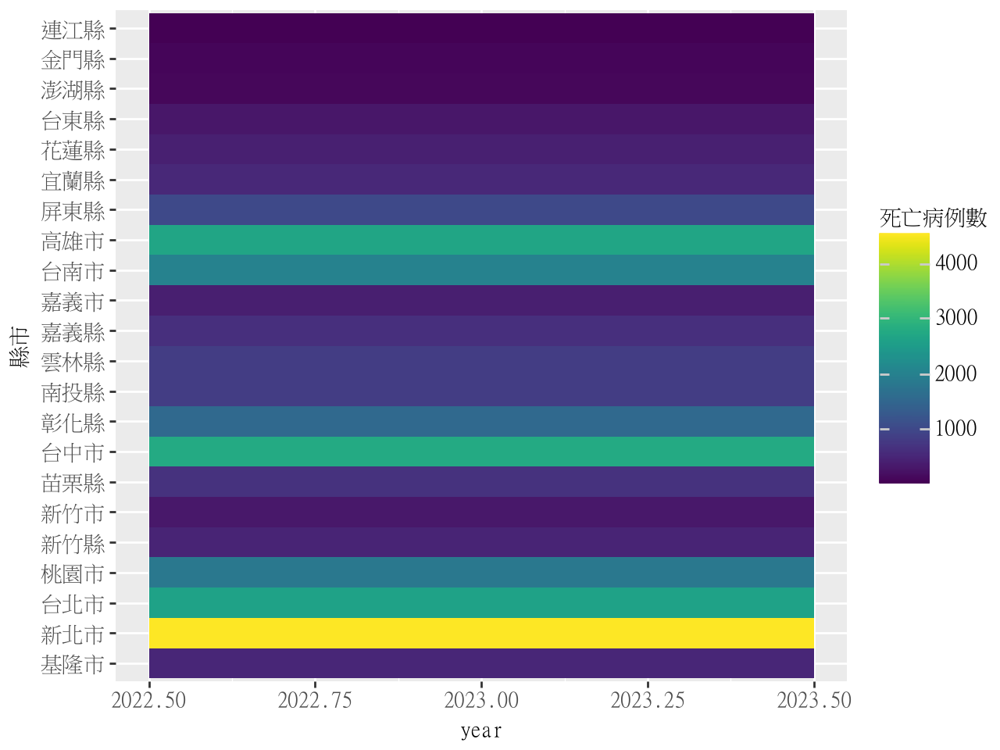

In [ ]:
from mizani. formatters import comma_format
ggplot (county_year, aes (x='year', y='縣市',fill='死亡病例數'))+\
  geom_tile() +\
  theme(text=element_text(fontproperties=aaa))

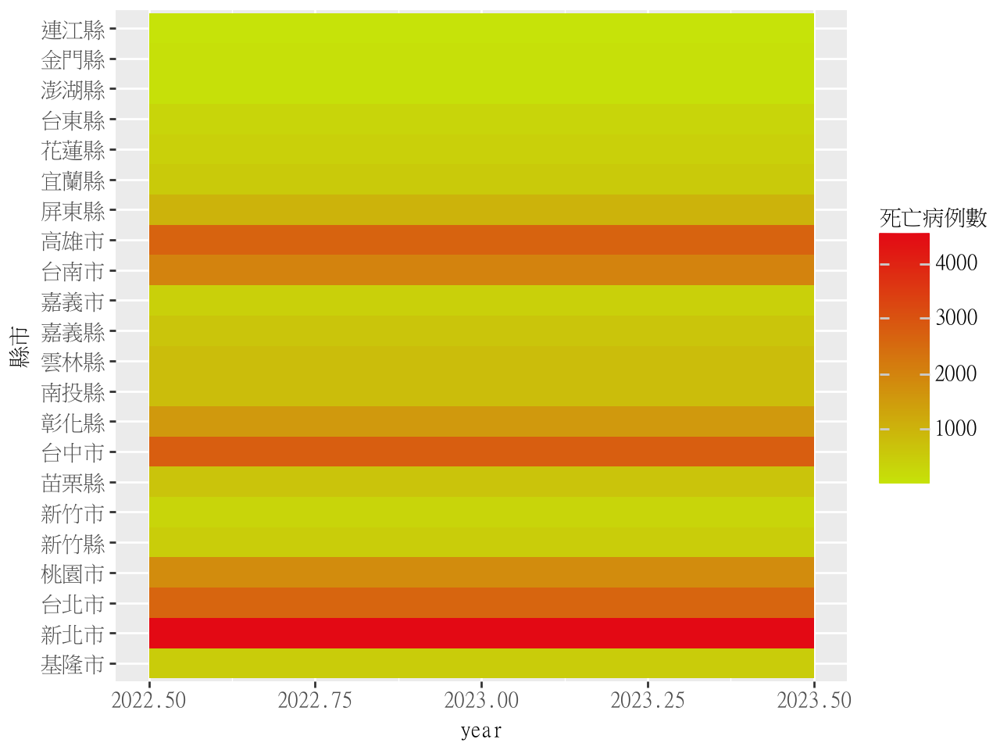

In [ ]:
ggplot (county_year, aes (x='year', y='縣市',fill='死亡病例數'))+\
  geom_tile ()+\
  scale_fill_gradient (low='#c6e309', high='#e30914') +\
  theme (text=element_text(fontproperties=aaa))

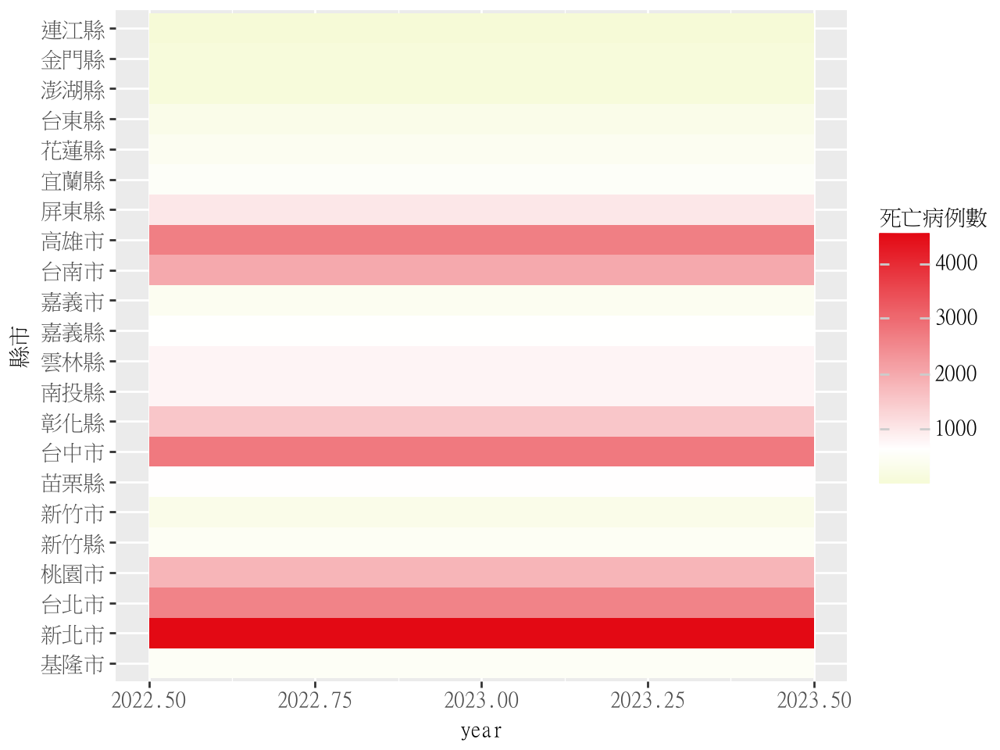

In [ ]:
ggplot (county_year, aes (x='year', y='縣市',fill='死亡病例數'))+\
  geom_tile ()+\
  scale_fill_gradient2 (low='#c6e309', high='#e30914',midpoint=county_year['死亡病例數'].median()) +\
  theme (text=element_text(fontproperties=aaa))

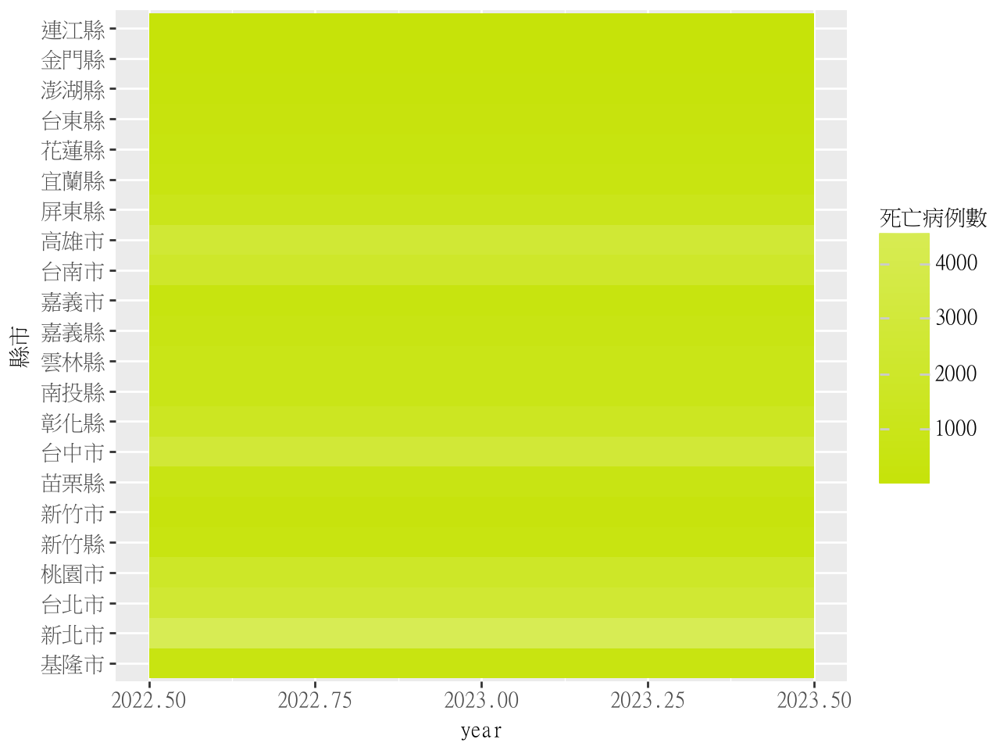

In [ ]:
ggplot (county_year, aes (x='year', y='縣市',fill='死亡病例數'))+\
  geom_tile ()+\
  scale_fill_gradient2 (low='#c6e309', high='#e30914',midpoint=15000) +\
  theme (text=element_text(fontproperties=aaa))

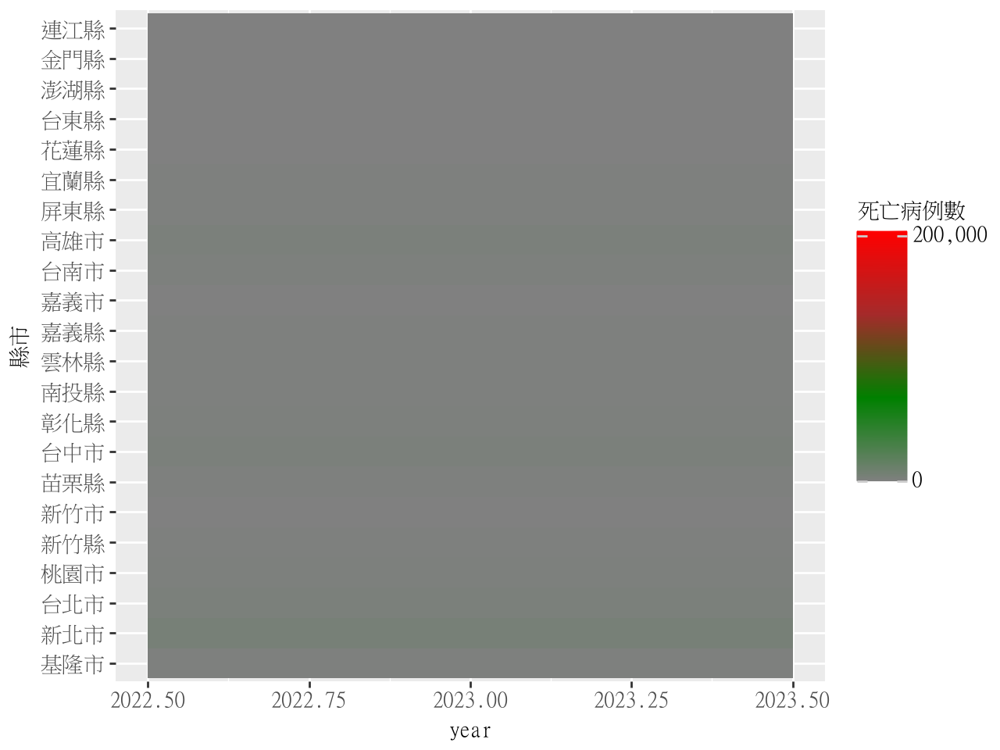

In [ ]:
ggplot (county_year, aes (x='year', y='縣市', fill='死亡病例數'))+\
  geom_tile() +\
  scale_fill_gradientn(colors=['gray','green', 'brown', 'red'],
      breaks=np. arange (0, np.max(county_year['死亡病例數'])+2e5, 2e5),
      limits = [0, np. max (county_year['死亡病例數']+2e5)],
      labels = comma_format()) +\
  theme(text= element_text(fontproperties=aaa))

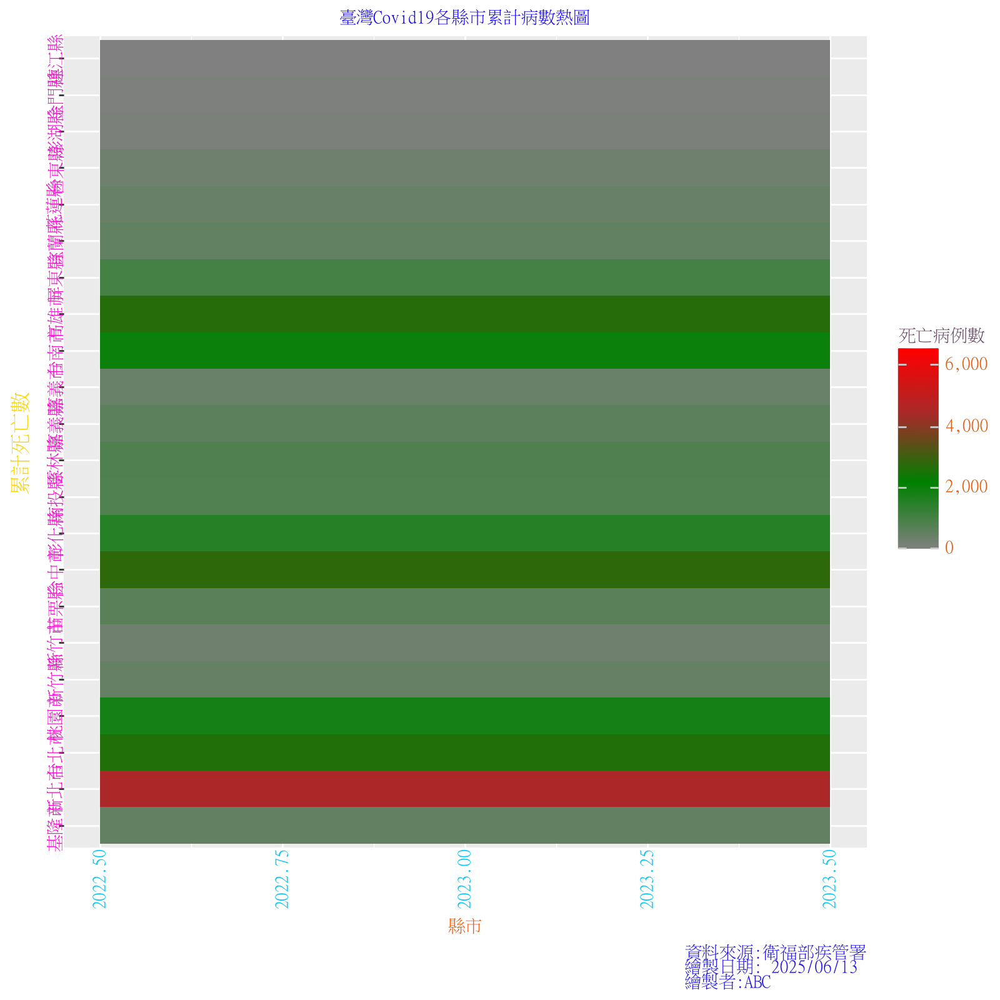

In [ ]:
ggplot (county_year, aes (x='year', y='縣市', fill='死亡病例數'))+\
  geom_tile() +\
  scale_fill_gradientn(colors=['gray','green', 'brown', 'red'],
      breaks=np. arange (0, np.max(county_year['死亡病例數'])+2000, 2000),
      limits = [0, np. max (county_year['死亡病例數']+2000)],
      labels = comma_format()) +\
  labs(
        title='臺灣Covid19各縣市累計病數熱圖',
        x='縣市',
        y='累計死亡數',
        caption='資料來源:衛福部疾管署\n繪製日期: ' + pd.Timestamp("today").strftime("%Y/%m/%d") + '\n繪製者:ABC'
    ) + \
    theme(
        text=element_text(fontproperties=aaa),
        plot_title=element_text(fontproperties=aaa, color='#1105fc', weight='bold', ha='center'),
        axis_title_x=element_text(fontproperties=aaa, style='italic', color='#fc5305', ha='center'),
        axis_title_y=element_text(fontproperties=aaa, color='#fcd305', va='center', size=12),
        axis_text_x=element_text(fontproperties=aaa, color='#05c7fc', rotation=90,  ha='center'),
        axis_text_y=element_text(fontproperties=aaa, color='#fc05cf', rotation=90,  va='center', ha='center'),
        axis_ticks_major_x=element_blank(),
        plot_caption=element_text(fontproperties=aaa, color='#2318f0', size=10),
        legend_title=element_text(fontproperties=aaa, color='#664460',va='baseline'),
        legend_text=element_text(fontproperties=aaa, color='#e65b0b'),
        figure_size=(8, 8)
    )

另一種方式

In [ ]:
(pd.crosstab (covid_county_daily['縣市'], covid_county_daily['year'], covid_county_daily['死亡病例數'],aggfunc='sum')
  .reset_index())

year,縣市,2023
0,南投縣,805.0
1,台中市,2773.0
2,台北市,2626.0
3,台南市,1998.0
4,台東縣,279.0
5,嘉義市,390.0
6,嘉義縣,620.0
7,基隆市,491.0
8,宜蘭縣,511.0
9,屏東縣,1003.0


In [ ]:
county_year_crosstab = (pd.crosstab(covid_county_daily['縣市'], covid_county_daily['year'],
           covid_county_daily['死亡病例數'], aggfunc='sum')
        .reset_index()
        .melt(id_vars='縣市', var_name='年', value_name='人數'))
county_year_crosstab

,縣市,年,人數
0,南投縣,2023,805.0
1,台中市,2023,2773.0
2,台北市,2023,2626.0
3,台南市,2023,1998.0
4,台東縣,2023,279.0
5,嘉義市,2023,390.0
6,嘉義縣,2023,620.0
7,基隆市,2023,491.0
8,宜蘭縣,2023,511.0
9,屏東縣,2023,1003.0


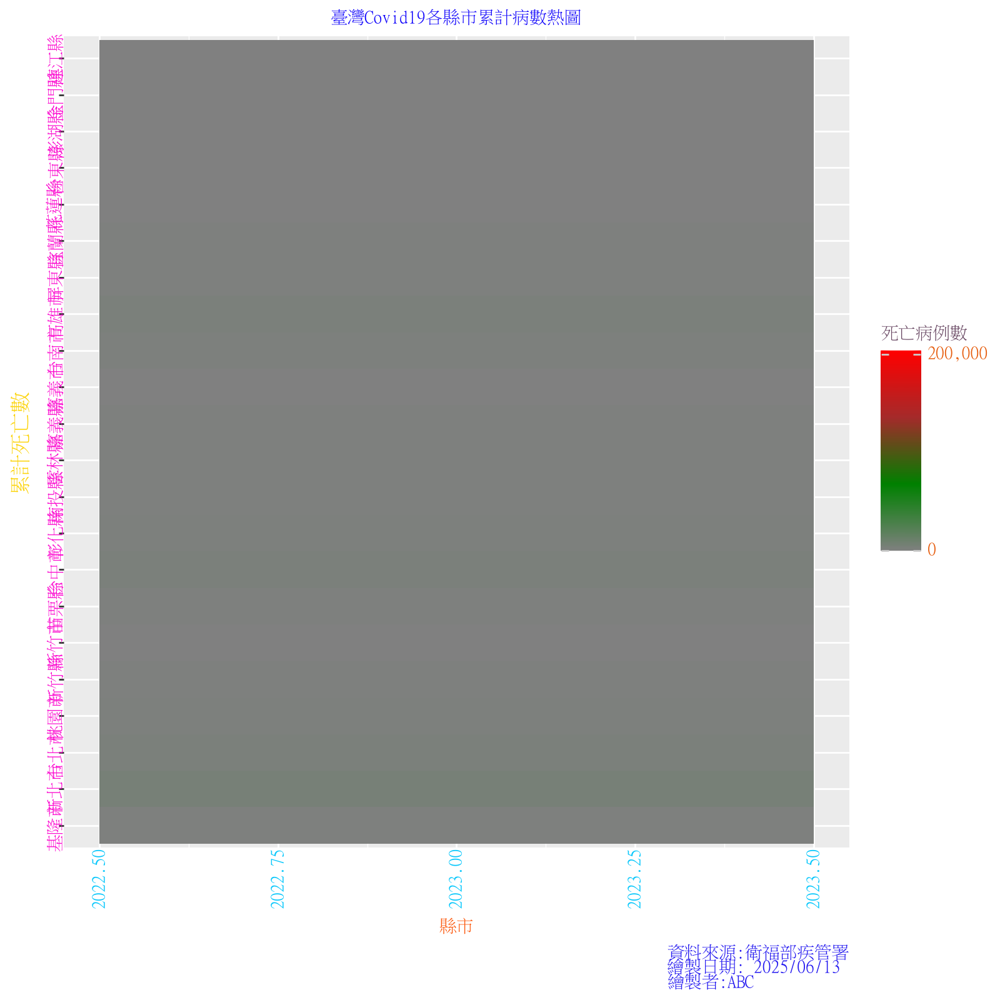

In [ ]:
from mizani. formatters import comma_format
ggplot (county_year, aes (x='year', y='縣市', fill='死亡病例數'))+\
  geom_tile() +\
  scale_fill_gradientn(colors=['gray','green', 'brown', 'red'],
      breaks=np. arange (0, np.max(county_year['死亡病例數'])+2e5, 2e5),
      limits = [0, np. max (county_year['死亡病例數']+2e5)],
      labels = comma_format()) +\
  labs(
        title='臺灣Covid19各縣市累計病數熱圖',
        x='縣市',
        y='累計死亡數',
        caption='資料來源:衛福部疾管署\n繪製日期: ' + pd.Timestamp("today").strftime("%Y/%m/%d") + '\n繪製者:ABC'
    ) + \
    theme(
        text=element_text(fontproperties=aaa),
        plot_title=element_text(fontproperties=aaa, color='#1105fc', weight='bold', ha='center'),
        axis_title_x=element_text(fontproperties=aaa, style='italic', color='#fc5305', ha='center'),
        axis_title_y=element_text(fontproperties=aaa, color='#fcd305', va='center', size=12),
        axis_text_x=element_text(fontproperties=aaa, color='#05c7fc', rotation=90,  ha='center'),
        axis_text_y=element_text(fontproperties=aaa, color='#fc05cf', rotation=90,  va='center', ha='center'),
        axis_ticks_major_x=element_blank(),
        plot_caption=element_text(fontproperties=aaa, color='#2318f0', size=10),
        legend_title=element_text(fontproperties=aaa, color='#664460',va='baseline'),
        legend_text=element_text(fontproperties=aaa, color='#e65b0b'),
        figure_size=(8, 8)
    )

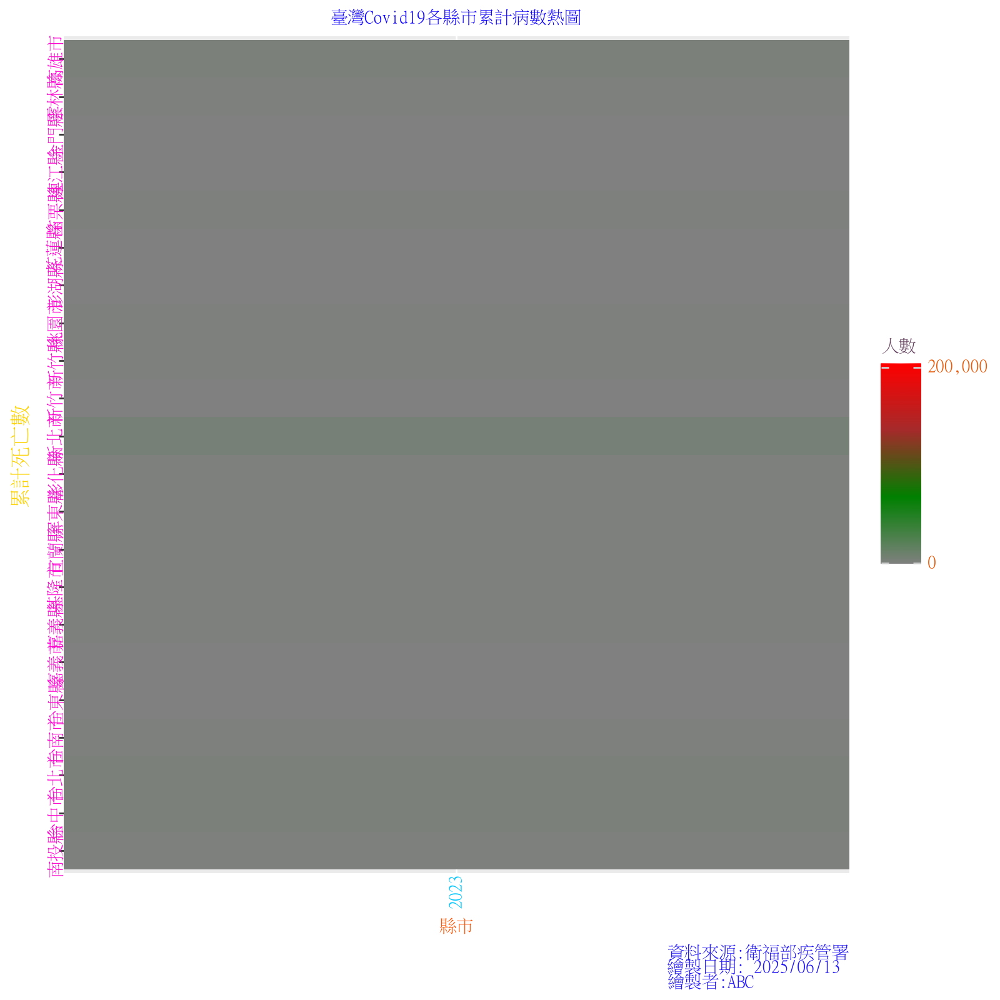

In [ ]:
from mizani. formatters import comma_format
import numpy as np
import pandas as pd
from plotnine import *

ggplot (county_year_crosstab, aes (x='年', y='縣市', fill='人數'))+\
  geom_tile() +\
  scale_fill_gradientn(colors=['gray','green', 'brown', 'red'],
      breaks=np. arange (0, np.max(county_year_crosstab['人數'])+2e5, 2e5), # Use county_year_crosstab and '人數'
      limits = [0, np. max (county_year_crosstab['人數']+2e5)], # Use county_year_crosstab and '人數'
      labels = comma_format()) +\
  labs(
        title='臺灣Covid19各縣市累計病數熱圖',
        x='縣市',
        y='累計死亡數',
        caption='資料來源:衛福部疾管署\n繪製日期: ' + pd.Timestamp("today").strftime("%Y/%m/%d") + '\n繪製者:ABC'
    ) + \
    theme(
        text=element_text(fontproperties=aaa),
        plot_title=element_text(fontproperties=aaa, color='#1105fc', weight='bold', ha='center'),
        axis_title_x=element_text(fontproperties=aaa, style='italic', color='#fc5305', ha='center'),
        axis_title_y=element_text(fontproperties=aaa, color='#fcd305', va='center', size=12),
        axis_text_x=element_text(fontproperties=aaa, color='#05c7fc', rotation=90,  ha='center'),
        axis_text_y=element_text(fontproperties=aaa, color='#fc05cf', rotation=90,  va='center', ha='center'),
        axis_ticks_major_x=element_blank(),
        plot_caption=element_text(fontproperties=aaa, color='#2318f0', size=10),
        legend_title=element_text(fontproperties=aaa, color='#664460',va='baseline'),
        legend_text=element_text(fontproperties=aaa, color='#e65b0b'),
        figure_size=(8, 8)
    )

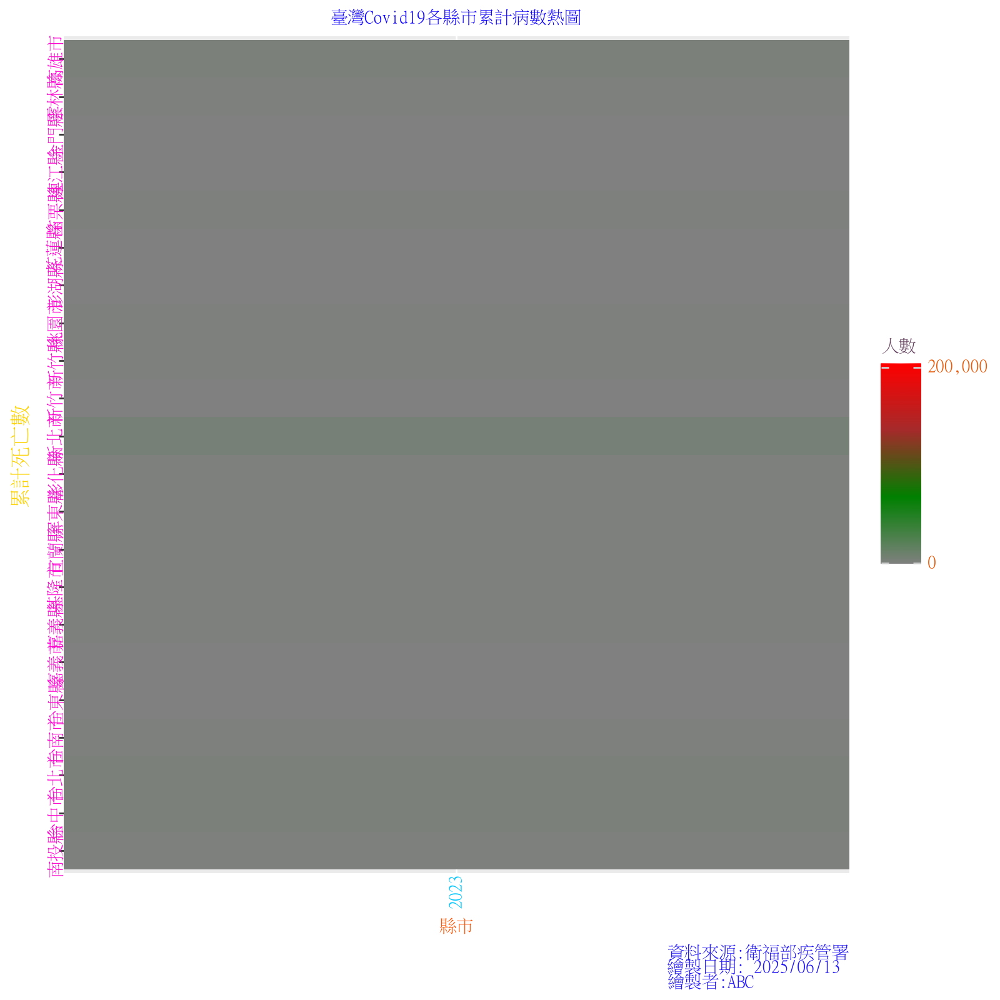

In [ ]:
from mizani. formatters import comma_format
ggplot (county_year_crosstab, aes (x='年', y='縣市', fill='人數'))+\
  geom_tile() +\
  scale_fill_gradientn(colors=['gray','green', 'brown', 'red'],
      breaks=np. arange (0, np.max(county_year_crosstab['人數'])+2e5, 2e5), # Use county_year_crosstab and '人數'
      limits = [0, np. max (county_year_crosstab['人數']+2e5)], # Use county_year_crosstab and '人數'
      labels = comma_format()) +\
  labs(
        title='臺灣Covid19各縣市累計病數熱圖',
        x='縣市', # Change x-axis label to 年
        y='累計死亡數', # Keep y-axis label as 縣市, the plot shows per year
        caption='資料來源:衛福部疾管署\n繪製日期: ' + pd.Timestamp("today").strftime("%Y/%m/%d") + '\n繪製者:ABC'
    ) + \
    theme(
        text=element_text(fontproperties=aaa),
        plot_title=element_text(fontproperties=aaa, color='#1105fc', weight='bold', ha='center'),
        axis_title_x=element_text(fontproperties=aaa, style='italic', color='#fc5305', ha='center'),
        axis_title_y=element_text(fontproperties=aaa, color='#fcd305', va='center', size=12),
        axis_text_x=element_text(fontproperties=aaa, color='#05c7fc', rotation=90,  ha='center'),
        axis_text_y=element_text(fontproperties=aaa, color='#fc05cf', rotation=90,  va='center', ha='center'),
        axis_ticks_major_x=element_blank(),
        plot_caption=element_text(fontproperties=aaa, color='#2318f0', size=10),
        legend_title=element_text(fontproperties=aaa, color='#664460',va='baseline'),
        legend_text=element_text(fontproperties=aaa, color='#e65b0b'),
        figure_size=(8, 8)
    )

**繪製六度熱圖**

In [ ]:
county_year_six = county_year_crosstab[county_year_crosstab['縣市'].isin(['台北市','新北市','桃園市','台中市','台南市','高雄市'])]
county_year_six

,縣市,年,人數
1,台中市,2023,2773.0
2,台北市,2023,2626.0
3,台南市,2023,1998.0
11,新北市,2023,4558.0
14,桃園市,2023,1832.0
21,高雄市,2023,2688.0


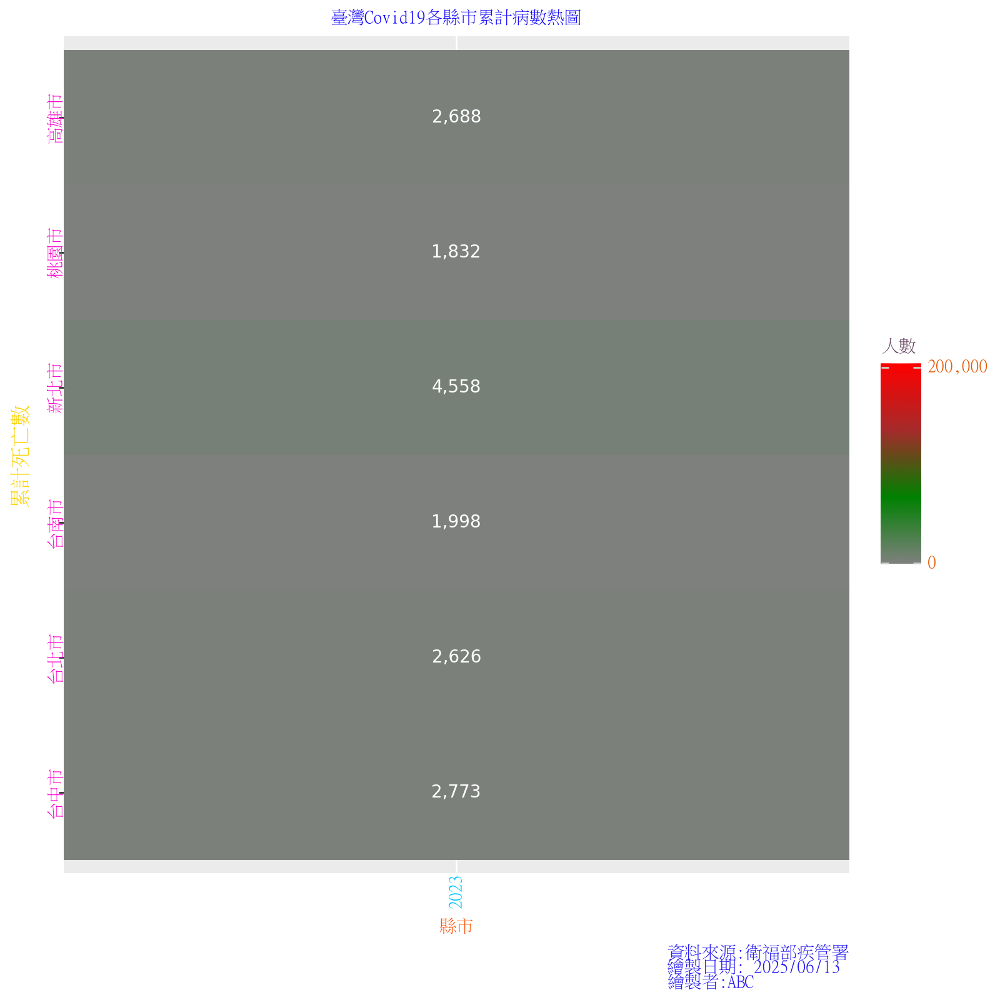

In [ ]:
ggplot (county_year_six, aes (x='年', y='縣市', fill='人數'))+\
  geom_tile() +\
  scale_fill_gradientn(colors=['gray','green', 'brown', 'red'],
      breaks=np. arange (0, np.max(county_year_six['人數'])+2e5, 2e5), # Use county_year_crosstab and '人數'
      limits = [0, np. max (county_year_six['人數']+2e5)], # Use county_year_crosstab and '人數'
      labels = comma_format()) +\
      geom_text (aes(label='人數'), size=10, color='white', format_string='{:,.0f}') +\
  labs(
        title='臺灣Covid19各縣市累計病數熱圖',
        x='縣市', # Change x-axis label to 年
        y='累計死亡數', # Keep y-axis label as 縣市, the plot shows per year
        caption='資料來源:衛福部疾管署\n繪製日期: ' + pd.Timestamp("today").strftime("%Y/%m/%d") + '\n繪製者:ABC'
    ) + \
    theme(
        text=element_text(fontproperties=aaa),
        plot_title=element_text(fontproperties=aaa, color='#1105fc', weight='bold', ha='center'),
        axis_title_x=element_text(fontproperties=aaa, style='italic', color='#fc5305', ha='center'),
        axis_title_y=element_text(fontproperties=aaa, color='#fcd305', va='center', size=12),
        axis_text_x=element_text(fontproperties=aaa, color='#05c7fc', rotation=90,  ha='center'),
        axis_text_y=element_text(fontproperties=aaa, color='#fc05cf', rotation=90,  va='center', ha='center'),
        axis_ticks_major_x=element_blank(),
        plot_caption=element_text(fontproperties=aaa, color='#2318f0', size=10),
        legend_title=element_text(fontproperties=aaa, color='#664460',va='baseline'),
        legend_text=element_text(fontproperties=aaa, color='#e65b0b'),
        figure_size=(8, 8)
    )

各年以不同色顯示

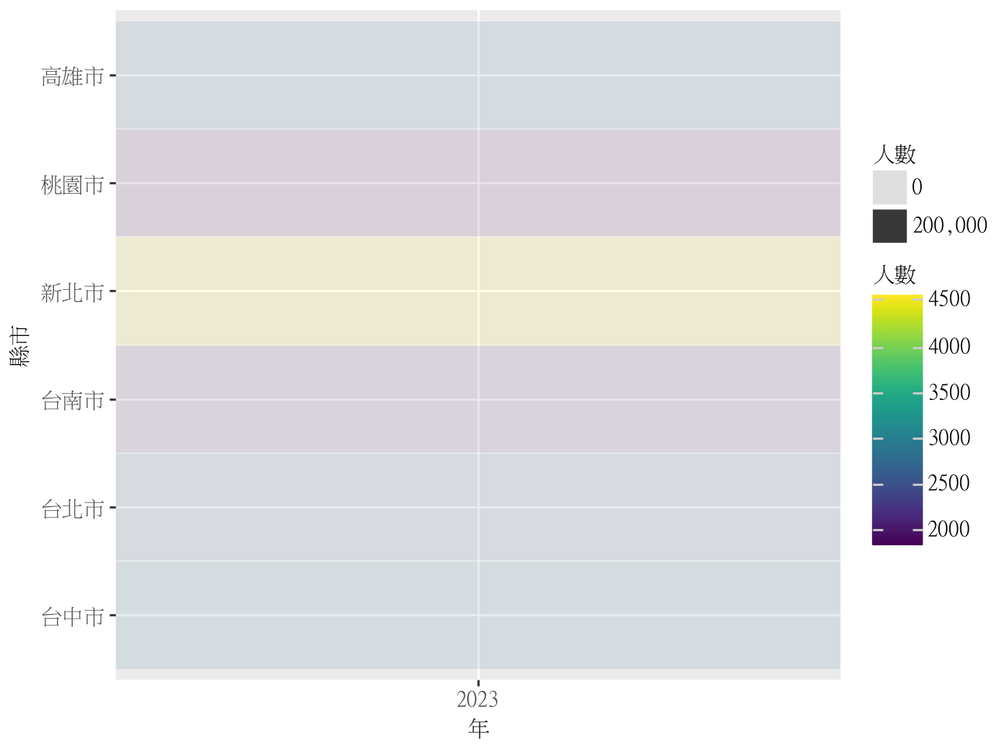

In [ ]:
ggplot (county_year_six, aes (x='年', y='縣市', fill='人數'))+\
  geom_tile(aes (alpha='人數'), color='white') +\
  scale_alpha(breaks=np. arange (0, np.max(county_year_six['人數'])+2e5, 2e5), # Use county_year_crosstab and '人數'
      limits = [0, np. max (county_year_six['人數']+2e5)], # Use county_year_crosstab and '人數'
      labels = comma_format()) +\
    theme(text=element_text(fontproperties=aaa))

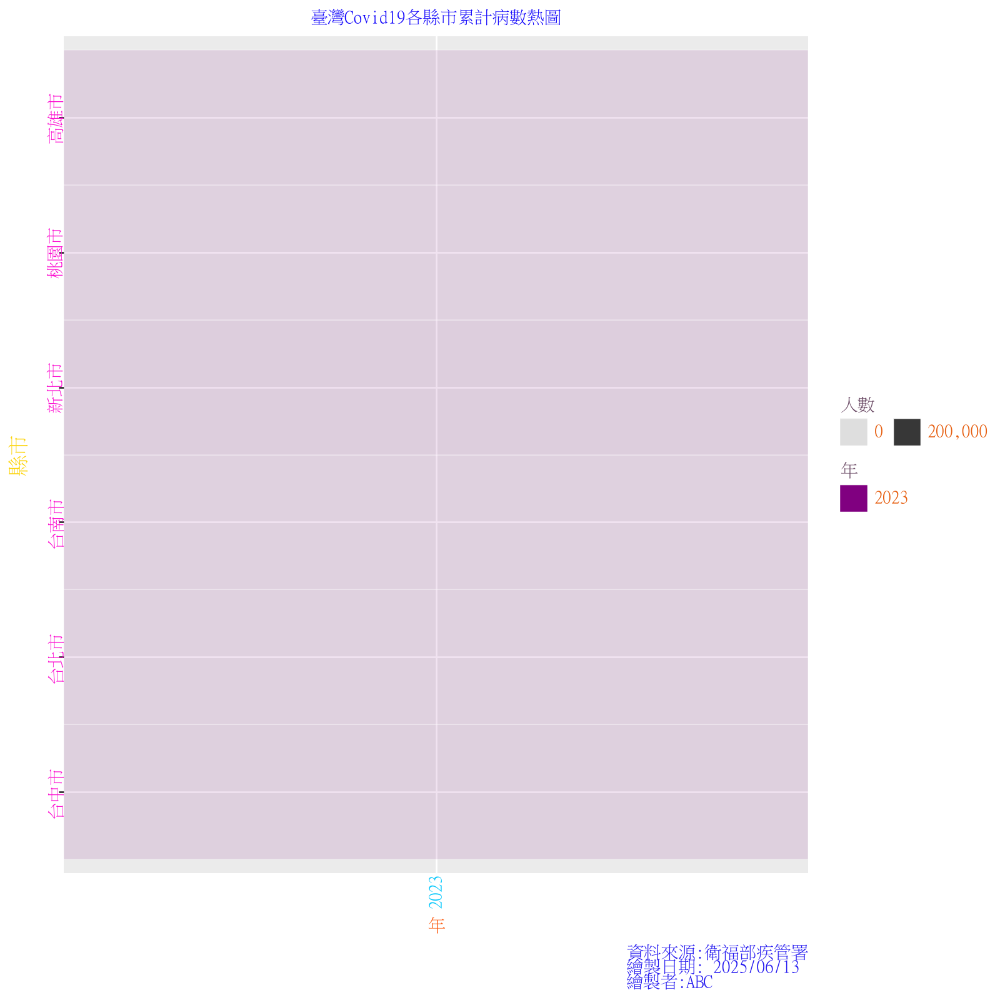

In [ ]:
ggplot (county_year_six, aes (x='年', y='縣市', fill='年'))+\
  geom_tile(aes(alpha='人數'),color='white') +\
  scale_alpha(breaks=np.arange (0, np.max(county_year_six['人數'])+2e5, 2e5), # Use county_year_crosstab and '人數'
      limits = [0, np.max (county_year_six['人數']+2e5)], # Use county_year_crosstab and '人數'
      labels = comma_format()) +\
  scale_fill_manual (values=['purple', 'blue', 'red', 'yellow', 'green']) +\
  guides(alpha=guide_legend(ncol=3))+\
  guides (fill=guide_legend (nrow=1)) +\
  labs(title='臺灣Covid19各縣市累計病數熱圖',
    x='年',
    y='縣市',
    fill='年',
    caption='資料來源:衛福部疾管署\n繪製日期: ' + pd.Timestamp("today").strftime("%Y/%m/%d") + '\n繪製者:ABC'
    ) +\
    theme(
        text=element_text(fontproperties=aaa),
        plot_title=element_text(fontproperties=aaa, color='#1105fc', weight='bold', ha='center'),
        axis_title_x=element_text(fontproperties=aaa, style='italic', color='#fc5305', ha='center'),
        axis_title_y=element_text(fontproperties=aaa, color='#fcd305', va='center', size=12),
        axis_text_x=element_text(fontproperties=aaa, color='#05c7fc', rotation=90,  ha='center'),
        axis_text_y=element_text(fontproperties=aaa, color='#fc05cf', rotation=90,  va='center', ha='center'),
        axis_ticks_major_x=element_blank(),
        plot_caption=element_text(fontproperties=aaa, color='#2318f0', size=10),
        legend_title=element_text(fontproperties=aaa, color='#664460',va='baseline'),
        legend_text=element_text(fontproperties=aaa, color='#e65b0b'),
        figure_size=(8, 8)
    )

加入文字

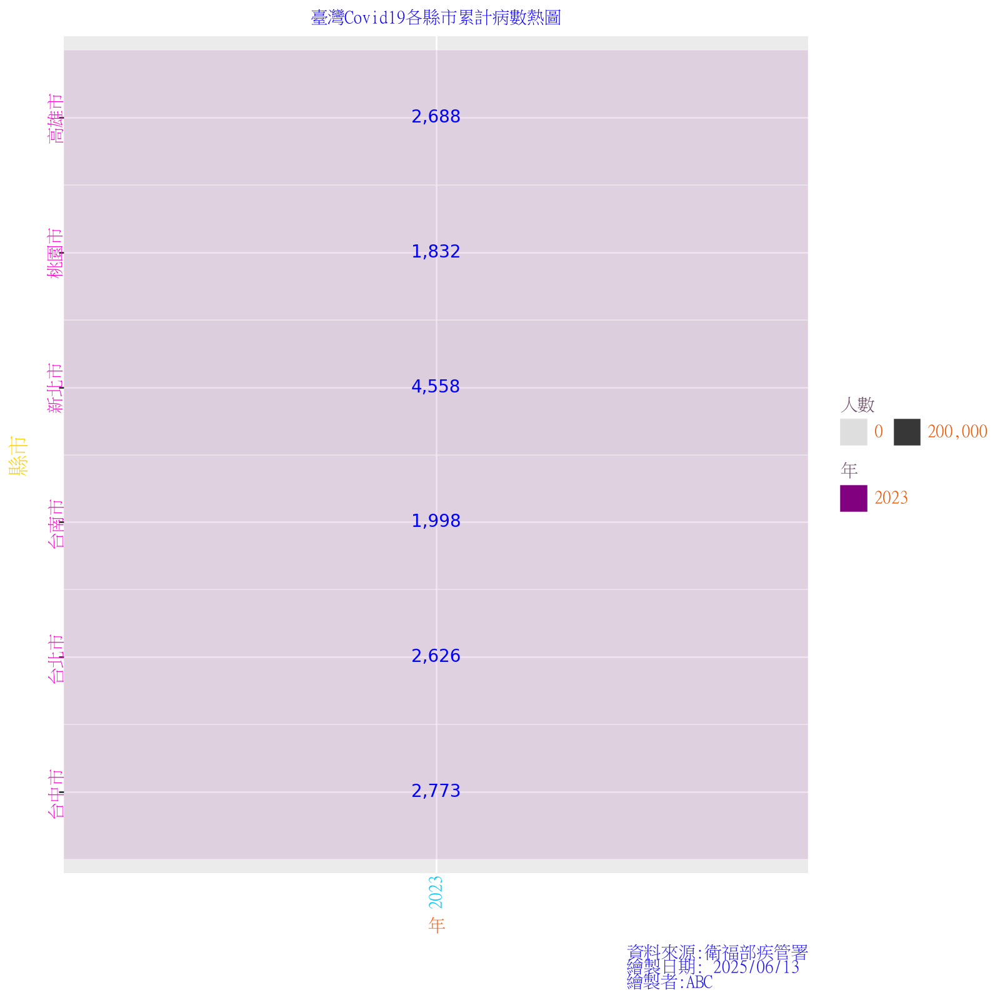

In [ ]:
ggplot (county_year_six, aes (x='年', y='縣市', fill='年'))+\
  geom_tile(aes(alpha='人數'),color='white') +\
  scale_alpha(breaks=np.arange (0, np.max(county_year_six['人數'])+2e5, 2e5), # Use county_year_crosstab and '人數'
      limits = [0, np.max (county_year_six['人數']+2e5)], # Use county_year_crosstab and '人數'
      labels = comma_format()) +\
  scale_fill_manual (values=['purple', 'blue', 'red', 'yellow', 'green']) +\
  geom_text(aes(label='comma_format()(人數)'),color='blue', size=10)+\
  guides(alpha=guide_legend(ncol=3))+\
  guides (fill=guide_legend (nrow=1)) +\
  labs(title='臺灣Covid19各縣市累計病數熱圖',
    x='年',
    y='縣市',
    fill='年',
    caption='資料來源:衛福部疾管署\n繪製日期: ' + pd.Timestamp("today").strftime("%Y/%m/%d") + '\n繪製者:ABC'
    ) +\
    theme(
        text=element_text(fontproperties=aaa),
        plot_title=element_text(fontproperties=aaa, color='#1105fc', weight='bold', ha='center'),
        axis_title_x=element_text(fontproperties=aaa, style='italic', color='#fc5305', ha='center'),
        axis_title_y=element_text(fontproperties=aaa, color='#fcd305', va='center', size=12),
        axis_text_x=element_text(fontproperties=aaa, color='#05c7fc', rotation=90,  ha='center'),
        axis_text_y=element_text(fontproperties=aaa, color='#fc05cf', rotation=90,  va='center', ha='center'),
        axis_ticks_major_x=element_blank(),
        plot_caption=element_text(fontproperties=aaa, color='#2318f0', size=10),
        legend_title=element_text(fontproperties=aaa, color='#664460',va='baseline'),
        legend_text=element_text(fontproperties=aaa, color='#e65b0b'),
        figure_size=(8, 8)
    )

# W15

# 地圖


In [ ]:
import geopandas as gpd

In [ ]:
df_county= gpd.read_file('/content/drive/MyDrive/colab/mapdata/COUNTY_MOI_1140318.shp',encoding='utf-8')

In [ ]:
df_county

,COUNTYID,COUNTYCODE,COUNTYNAME,COUNTYENG,geometry
0,Z,09007,連江縣,Lienchiang County,"MULTIPOLYGON (((119.96446 25.94552, 119.96428 ..."
1,G,10002,宜蘭縣,Yilan County,"MULTIPOLYGON (((121.95972 24.84493, 121.96065 ..."
2,N,10007,彰化縣,Changhua County,"POLYGON ((120.45656 24.20718, 120.48589 24.197..."
3,M,10008,南投縣,Nantou County,"POLYGON ((121.27087 24.23661, 121.27108 24.236..."
4,P,10009,雲林縣,Yunlin County,"MULTIPOLYGON (((120.08108 23.52412, 120.08161 ..."
5,T,10013,屏東縣,Pingtung County,"MULTIPOLYGON (((120.82649 21.75615, 120.82646 ..."
6,C,10017,基隆市,Keelung City,"MULTIPOLYGON (((121.71016 25.17604, 121.71016 ..."
7,A,63000,臺北市,Taipei City,"POLYGON ((121.57099 25.19717, 121.57098 25.197..."
8,F,65000,新北市,New Taipei City,"POLYGON ((121.53753 25.30003, 121.53769 25.300..."
9,D,67000,臺南市,Tainan City,"POLYGON ((120.44025 23.41308, 120.4404 23.4130..."


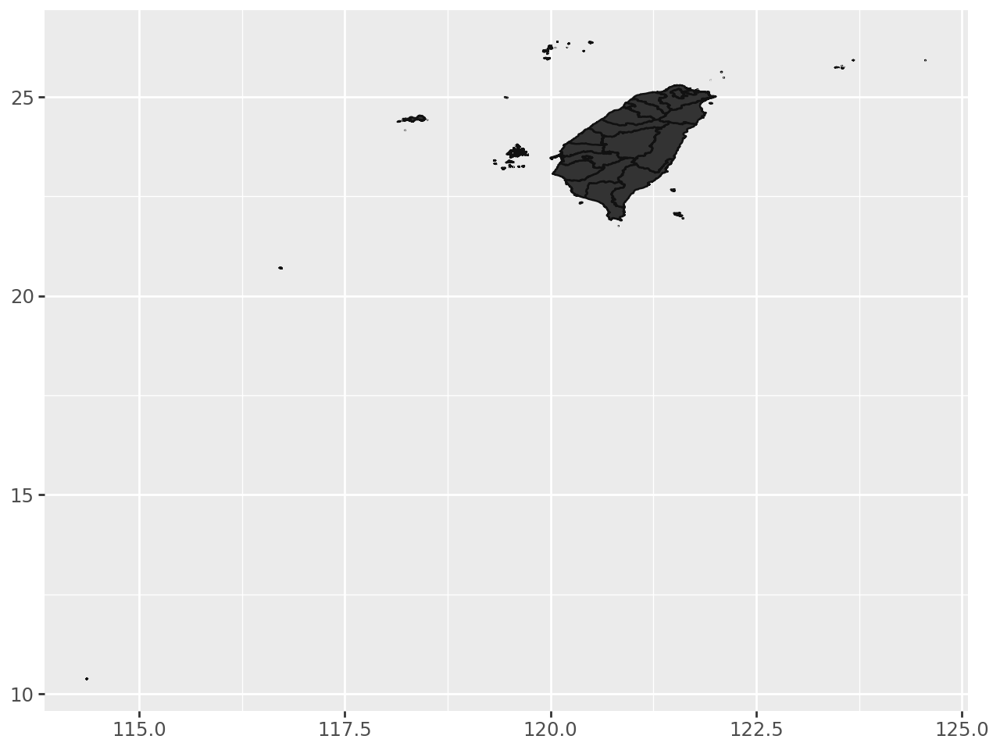

In [ ]:
ggplot()+\
  geom_map(df_county)

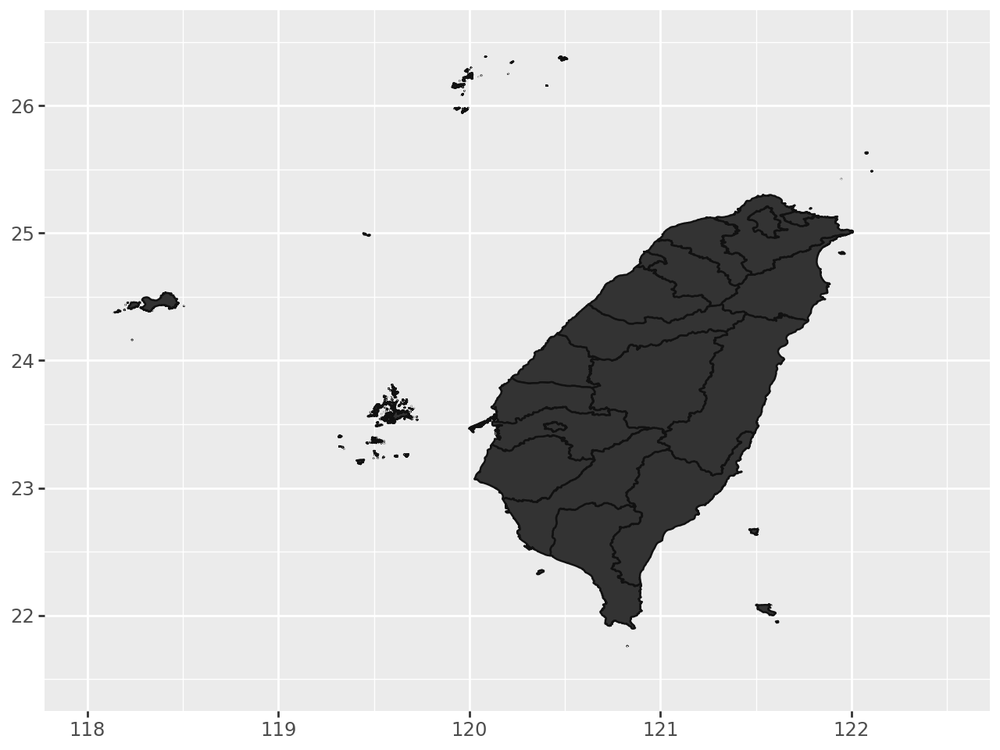

In [ ]:
ggplot()+\
  geom_map(df_county)+\
  scale_x_continuous(limits=(118,122.5))+\
  scale_y_continuous(limits=(21.5,26.5))

**計算各縣市累計確診人數**

In [ ]:
covid_df_county = (covid_df[['縣市','死亡病例數']]
            .groupby(['縣市'])
            .agg('sum')
            .reset_index()
            .rename(columns={'死亡病例數':'累計死亡數'}))
covid_df_county

,縣市,累計死亡數
0,南投縣,805
1,台中市,2773
2,台北市,2626
3,台南市,1998
4,台東縣,279
5,嘉義市,390
6,嘉義縣,620
7,基隆市,491
8,宜蘭縣,511
9,屏東縣,1003


合併資料

In [ ]:
covid_df_county.columns

Index(['縣市', '累計死亡數'], dtype='object')

In [ ]:
covid_county_df=pd.merge (df_county [['COUNTYNAME', 'geometry']], covid_df_county[['縣市','累計死亡數']],
              left_on='COUNTYNAME', right_on='縣市')
covid_county_df

,COUNTYNAME,geometry,縣市,累計死亡數
0,連江縣,"MULTIPOLYGON (((119.96446 25.94552, 119.96428 ...",連江縣,1
1,宜蘭縣,"MULTIPOLYGON (((121.95972 24.84493, 121.96065 ...",宜蘭縣,511
2,彰化縣,"POLYGON ((120.45656 24.20718, 120.48589 24.197...",彰化縣,1546
3,南投縣,"POLYGON ((121.27087 24.23661, 121.27108 24.236...",南投縣,805
4,雲林縣,"MULTIPOLYGON (((120.08108 23.52412, 120.08161 ...",雲林縣,813
5,屏東縣,"MULTIPOLYGON (((120.82649 21.75615, 120.82646 ...",屏東縣,1003
6,基隆市,"MULTIPOLYGON (((121.71016 25.17604, 121.71016 ...",基隆市,491
7,新北市,"POLYGON ((121.53753 25.30003, 121.53769 25.300...",新北市,4558
8,桃園市,"POLYGON ((121.26382 25.12197, 121.26668 25.120...",桃園市,1832
9,嘉義市,"POLYGON ((120.44759 23.51819, 120.44767 23.518...",嘉義市,390


In [ ]:
df1=covid_df_county.copy()
df1 ['縣市'] = df1 ['縣市']. str.replace('台','臺')
df1

,縣市,累計死亡數
0,南投縣,805
1,臺中市,2773
2,臺北市,2626
3,臺南市,1998
4,臺東縣,279
5,嘉義市,390
6,嘉義縣,620
7,基隆市,491
8,宜蘭縣,511
9,屏東縣,1003


In [ ]:
covid_county_df=pd.merge (df_county [['COUNTYNAME', 'geometry']], covid_df_county[['縣市','累計死亡數']],
              left_on='COUNTYNAME', right_on='縣市')
covid_county_df

,COUNTYNAME,geometry,縣市,累計死亡數
0,連江縣,"MULTIPOLYGON (((119.96446 25.94552, 119.96428 ...",連江縣,1
1,宜蘭縣,"MULTIPOLYGON (((121.95972 24.84493, 121.96065 ...",宜蘭縣,511
2,彰化縣,"POLYGON ((120.45656 24.20718, 120.48589 24.197...",彰化縣,1546
3,南投縣,"POLYGON ((121.27087 24.23661, 121.27108 24.236...",南投縣,805
4,雲林縣,"MULTIPOLYGON (((120.08108 23.52412, 120.08161 ...",雲林縣,813
5,屏東縣,"MULTIPOLYGON (((120.82649 21.75615, 120.82646 ...",屏東縣,1003
6,基隆市,"MULTIPOLYGON (((121.71016 25.17604, 121.71016 ...",基隆市,491
7,新北市,"POLYGON ((121.53753 25.30003, 121.53769 25.300...",新北市,4558
8,桃園市,"POLYGON ((121.26382 25.12197, 121.26668 25.120...",桃園市,1832
9,嘉義市,"POLYGON ((120.44759 23.51819, 120.44767 23.518...",嘉義市,390


求各縣市中心點


In [ ]:
df_county_centroid= pd.DataFrame({'dist':df_county['COUNTYNAME'],
                'long':df_county.centroid.x,
                'lat':df_county.centroid.y})
df_county_centroid



<ipython-input-189-2062975268>:2: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

<ipython-input-189-2062975268>:3: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.



,dist,long,lat
0,連江縣,120.044644,26.183485
1,宜蘭縣,121.645867,24.573775
2,彰化縣,120.468792,23.964586
3,南投縣,120.982080,23.842738
4,雲林縣,120.373199,23.686496
5,屏東縣,120.676710,22.482705
6,基隆市,121.721956,25.121693
7,臺北市,121.553304,25.082942
8,新北市,121.595374,24.987103
9,臺南市,120.324761,23.150776


繪製累計確診人數分布圖

In [ ]:
def no_labels(values):
  return['']*len(values)

In [ ]:
fm.fontManager.addfont('/content/drive/MyDrive/mingliu.ttc')

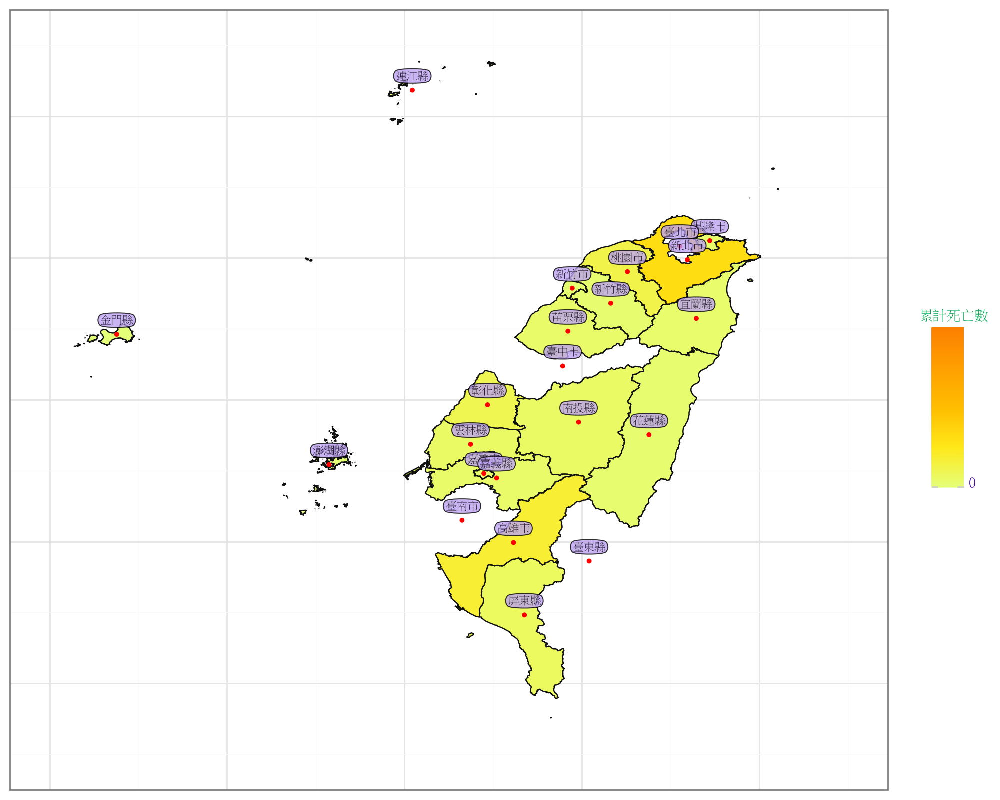

In [ ]:
ggplot() +\
  geom_map(covid_county_df,aes(fill='累計死亡數'))+\
  scale_x_continuous (limits=(118,122.5), labels=no_labels) +\
  scale_y_continuous (limits=(21.5,26.5), labels=no_labels) +\
  scale_color_cmap(cmap_name='Wistia', aesthetics=['fill'],
          breaks=np.arange (0,np.max (covid_county_df['累計死亡數'])+10000, 200000),
                    limits = [0, np.max (covid_county_df['累計死亡數']+10000)],
                    labels = comma_format()) +\
  labs (x='', y='') +\
  theme_bw() +\
  geom_point(data=df_county_centroid, mapping=aes (x='long', y='lat'), size=1, color='red') +\
  geom_label(data=df_county_centroid, mapping=aes (x='long', y='lat', label='dist'),
              nudge_y=0.1, family='mingliu', boxstyle='round4', colour='black',
              fill='#bda2f2', alpha=0.8, size=8) +\
    theme (text=element_text(fontproperties=aaa),
      axis_ticks=element_blank(),
      legend_title=element_text (fontproperties=aaa, colour = '#08a654', ha = 'center'),
      legend_text=element_text(fontproperties=aaa, colour = '#4708a6', va='baseline'),
      legend_position='right',
      legend_direction='vertical',
      plot_caption=element_text (fontproperties=aaa, color='#2318f0', size=10),
      figure_size=(10,8))

In [ ]:
covid_df.head()

,死亡日,縣市,鄉鎮,性別,年齡層,死亡病例數,性别
0,2020-02-15,彰化縣,彰化市,M,60~64,1,NaN
1,2020-03-20,新北市,新店區,M,70+,1,NaN
2,2020-03-29,桃園市,蘆竹區,F,55~59,1,NaN
3,2021-01-29,桃園市,桃園區,F,70+,1,NaN
4,2021-04-09,桃園市,八德區,M,65~69,1,NaN


In [ ]:
covid_df['縣市'] = covid_df ['縣市'].str.replace('台','臺')

In [ ]:
covid_df_dist = (covid_df[['縣市','鄉鎮','死亡病例數']]
            .groupby(['縣市','鄉鎮'])
            .agg('sum')
            .reset_index()
            .rename(columns={'死亡病例數':'累計死亡數'}))
covid_df_dist

,縣市,鄉鎮,累計死亡數
0,南投縣,中寮鄉,19
1,南投縣,仁愛鄉,14
2,南投縣,信義鄉,13
3,南投縣,南投市,203
4,南投縣,名間鄉,55
...,...,...,...
359,高雄市,阿蓮區,26
360,高雄市,鳥松區,50
361,高雄市,鳳山區,332
362,高雄市,鹽埕區,27


In [ ]:
len(covid_df_dist)

364

In [ ]:
covid_df_dist.columns

Index(['縣市', '鄉鎮', '累計死亡數'], dtype='object')

In [ ]:
covid_df_dist.head()

,縣市,鄉鎮,累計死亡數
0,南投縣,中寮鄉,19
1,南投縣,仁愛鄉,14
2,南投縣,信義鄉,13
3,南投縣,南投市,203
4,南投縣,名間鄉,55


結合地圖

In [ ]:
df_county= gpd.read_file('/content/drive/MyDrive/colab/mapdata/COUNTY_MOI_1140318.shp',encoding='utf-8')

In [ ]:
dist=gpd.read_file('/content/drive/MyDrive/colab/mapdata/TOWN_MOI_1140318.shp',encoding='utf-8')

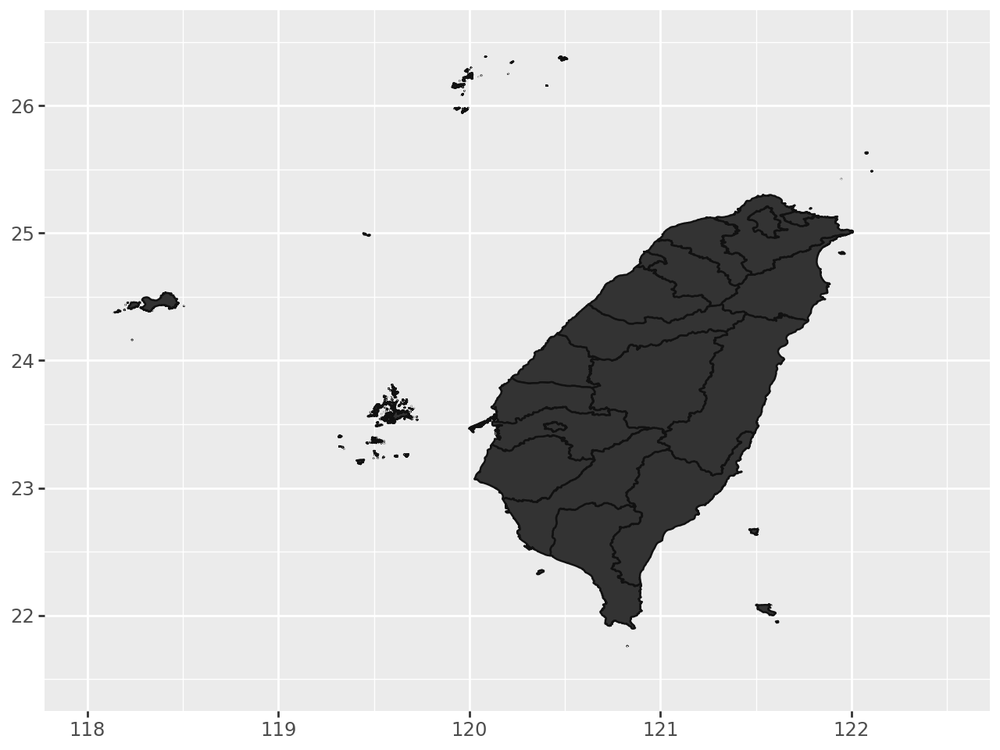

In [ ]:
from plotnine import *

ggplot()+\
  geom_map  (df_county)+\
  scale_x_continuous(limits=(118,122.5))+\
  scale_y_continuous(limits=(21.5,26.5))

In [ ]:
city = '臺南市'
df_city=covid_df_dist[covid_df_dist['縣市']==city]

In [ ]:
df_city

,縣市,鄉鎮,累計死亡數
216,臺南市,七股區,43
217,臺南市,下營區,40
218,臺南市,中西區,81
219,臺南市,仁德區,59
220,臺南市,佳里區,78
221,臺南市,六甲區,22
222,臺南市,北區,120
223,臺南市,北門區,8
224,臺南市,南化區,9
225,臺南市,南區,157


In [ ]:
  dist_city = dist[dist['COUNTYNAME']==city]
  dist_city

,TOWNID,TOWNCODE,COUNTYNAME,TOWNNAME,TOWNENG,COUNTYID,COUNTYCODE,geometry
222,D09,67000010,臺南市,新營區,Xinying District,D,67000,"POLYGON ((120.30618 23.34482, 120.30629 23.344..."
223,D10,67000020,臺南市,鹽水區,Yanshui District,D,67000,"POLYGON ((120.29585 23.35699, 120.29588 23.356..."
224,D12,67000030,臺南市,白河區,Baihe District,D,67000,"POLYGON ((120.44025 23.41308, 120.4404 23.4130..."
225,D13,67000050,臺南市,後壁區,Houbi District,D,67000,"POLYGON ((120.38698 23.40343, 120.38698 23.403..."
226,D15,67000070,臺南市,麻豆區,Madou District,D,67000,"POLYGON ((120.22292 23.23053, 120.22306 23.230..."
227,D16,67000080,臺南市,下營區,Xiaying District,D,67000,"POLYGON ((120.30001 23.26176, 120.3 23.2616, 1..."
228,D17,67000090,臺南市,六甲區,Liujia District,D,67000,"POLYGON ((120.30788 23.26352, 120.30811 23.263..."
229,D18,67000100,臺南市,官田區,Guantian District,D,67000,"POLYGON ((120.32014 23.22889, 120.32023 23.228..."
230,D19,67000110,臺南市,大內區,Danei District,D,67000,"POLYGON ((120.43573 23.20031, 120.43607 23.200..."
231,D20,67000120,臺南市,佳里區,Jiali District,D,67000,"POLYGON ((120.18458 23.20967, 120.18447 23.209..."


In [ ]:
df_county_centroid= pd.DataFrame({'dist':df_county['COUNTYNAME'],
                'long':df_county.centroid.x,
                'lat':df_county.centroid.y})
df_county_centroid

<ipython-input-211-1445675432>:2: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

<ipython-input-211-1445675432>:3: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.



,dist,long,lat
0,連江縣,120.044644,26.183485
1,宜蘭縣,121.645867,24.573775
2,彰化縣,120.468792,23.964586
3,南投縣,120.982080,23.842738
4,雲林縣,120.373199,23.686496
5,屏東縣,120.676710,22.482705
6,基隆市,121.721956,25.121693
7,臺北市,121.553304,25.082942
8,新北市,121.595374,24.987103
9,臺南市,120.324761,23.150776


In [ ]:
city_covid_df = (pd.merge(df_city[['鄉鎮','累計死亡數']],
          dist_city[['TOWNNAME', 'geometry']],
          left_on='鄉鎮', right_on='TOWNNAME')
        .drop (columns = ['TOWNNAME']))
city_covid_df

,鄉鎮,累計死亡數,geometry
0,七股區,43,"POLYGON ((120.14044 23.19436, 120.14047 23.194..."
1,下營區,40,"POLYGON ((120.30001 23.26176, 120.3 23.2616, 1..."
2,中西區,81,"POLYGON ((120.17477 23.00595, 120.17486 23.005..."
3,仁德區,59,"POLYGON ((120.26788 22.99467, 120.26791 22.994..."
4,佳里區,78,"POLYGON ((120.18458 23.20967, 120.18447 23.209..."
5,六甲區,22,"POLYGON ((120.30788 23.26352, 120.30811 23.263..."
6,北區,120,"POLYGON ((120.20943 23.02293, 120.20938 23.022..."
7,北門區,8,"POLYGON ((120.14419 23.32308, 120.14431 23.322..."
8,南化區,9,"POLYGON ((120.60971 23.22273, 120.60982 23.222..."
9,南區,157,"POLYGON ((120.19638 22.98749, 120.19668 22.987..."


In [ ]:
ggplot() +\
  geom_map(covid_county_df,aes(fill='累計死亡數'))+\
  scale_x_continuous (labels=no_labels) +\
  scale_y_continuous (labels=no_labels) +\
  scale_color_gradientn(colors=[' #8fe809', '#09e8d9', '#6609e8','#fa07fa','#fa0714'],
          breaks=np.arange (0,np.max( (covid_county_df.累計死亡數)//10000)+2)*10000,10000),
                    limits = (0, np.max (covid_county_df.累計死亡數//10000+1)*10000),
                    labels = comma_format(),
                    aesthetics=['fill']+\
  labs (title=city+'各行政區covid19累計病分布圖',
      x='', y=''),caption='資料來源'+ pd. Timestamp("today").strftime("%Y/%m/%d")+'\n繪製者:ABC')+\
  theme_classic() +\
  geom_point(data=df_county_centroid, mapping=aes (x='long', y='lat'), size=1, color='#1clala') +\
  geom_label(data=df_county_centroid, mapping=aes (x='long', y='lat', label='dist'),
        nudge_y=0.01, family='DFKai-SB', boxstyle='round4', colour='black',
        fill='#bda2f2', alpha=0.8, size=8) +\
      theme (text=element_text(fontproperties=aaa),
          plot_title element_text(fontproperties=aaa, colour #2de33d', ha='center'),
          plot_caption-element_text(fontproperties=aaa, color='purple'),
          legend_title=element_text(fontproperties=aaa, colour #08a654', ha='center'),
          legend_text=element_text (fontproperties=aaa, colour #4708a6', va='baseline'),
          legend_position='right',
          legend_direction='vertical',
          axis_line=element_blank),
          axis_ticks-element_blank,
          figure_size=(10,8))

IndentationError: unindent does not match any outer indentation level (<tokenize>, line 15)

/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:687: UserWarning: Glyph 36899 (\N{CJK UNIFIED IDEOGRAPH-9023}) missing from font(s) DejaVu Sans.
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:687: UserWarning: Glyph 27743 (\N{CJK UNIFIED IDEOGRAPH-6C5F}) missing from font(s) DejaVu Sans.
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:687: UserWarning: Glyph 32291 (\N{CJK UNIFIED IDEOGRAPH-7E23}) missing from font(s) DejaVu Sans.
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:687: UserWarning: Glyph 23452 (\N{CJK UNIFIED IDEOGRAPH-5B9C}) missing from font(s) DejaVu Sans.
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:687: UserWarning: Glyph 34349 (\N{CJK UNIFIED IDEOGRAPH-862D}) missing from font(s) DejaVu Sans.
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:687: UserWarning: Glyph 24432 (\N{CJK UNIFIED IDEOGRAPH-5F70}) missing from font(s) DejaVu Sans.
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:687: 

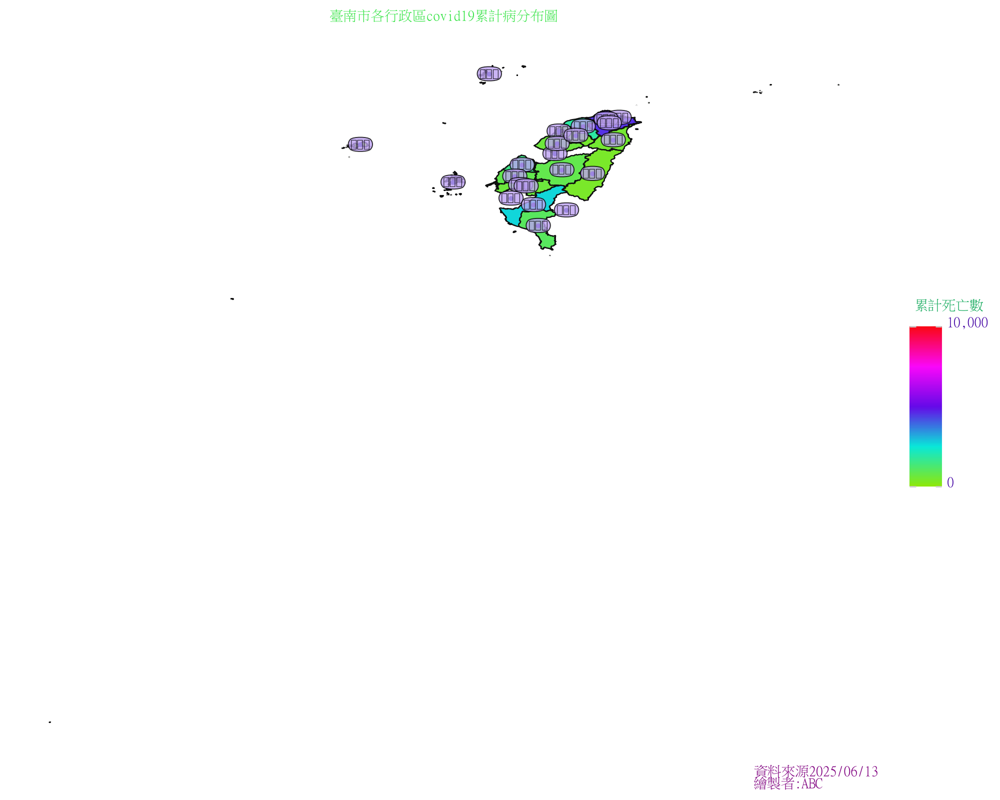

In [ ]:
ggplot() + \
  geom_map(covid_county_df, aes(fill='累計死亡數')) + \
  scale_x_continuous(labels=no_labels) + \
  scale_y_continuous(labels=no_labels) + \
  scale_fill_gradientn(colors=['#8fe809', '#09e8d9', '#6609e8', '#fa07fa', '#fa0714'],
                       breaks=np.arange(0, np.max((covid_county_df.累計死亡數) // 10000) + 2) * 10000,
                       limits=(0, np.max(covid_county_df.累計死亡數 // 10000 + 1) * 10000),
                       labels=comma_format(),
                       aesthetics=['fill']) + \
  labs(title=city + '各行政區covid19累計病分布圖',
       x='', y='', caption='資料來源' + pd.Timestamp("today").strftime("%Y/%m/%d") + '\n繪製者:ABC') + \
  theme_classic() + \
  geom_point(data=df_county_centroid, mapping=aes(x='long', y='lat'), size=1, color='#1c1ca1') + \
  geom_label(data=df_county_centroid, mapping=aes(x='long', y='lat', label='dist'),
             nudge_y=0.01, family='DFKai-SB', boxstyle='round4', colour='black',
             fill='#bda2f2', alpha=0.8, size=8) + \
  theme(text=element_text(fontproperties=aaa),
        plot_title=element_text(fontproperties=aaa, colour='#2de33d', ha='center'),
        plot_caption=element_text(fontproperties=aaa, color='purple'),
        legend_title=element_text(fontproperties=aaa, colour='#08a654', ha='center'),
        legend_text=element_text(fontproperties=aaa, colour='#4708a6', va='baseline'),
        legend_position='right',
        legend_direction='vertical',
        axis_line=element_blank(),
        axis_ticks=element_blank(),
        figure_size=(10, 8))

In [ ]:
dist_city_centroid_1 (pd.merge (dist_city_centroid, city_covid_df [['鄉鎮','累計死亡數']],
                                left_on="dist, right_on="鄉鎮”)
                                 .drop(columns = ['鄉鎮']))
dist_city_centroid_1

In [ ]:
ggplot() +\
  geom_map(covid_county_df,aes(fill='累計死亡數'))+\
  scale_x_continuous (labels=no_labels) +\
  scale_y_continuous (labels=no_labels) +\
  scale_color_gradientn(colors=['#8fe809', '#09e8d9', '#6609e8','#fa07fa','#fa0714'],
          breaks=np.arange (0,np.max((covid_county_df.累計死亡數)//10000)+2)*10000,10000),
                    limits = (0, np.max (covid_county_df.累計死亡數//10000+1)*10000),
                    labels = comma_format(),
                    aesthetics=['fill']+\
  labs (title=city+'各行政區covid19累計病分布圖',
      x='',
      y=''),
      caption='資料來源'+ pd. Timestamp("today").strftime("%Y/%m/%d")+'\n繪製者:ABC')+\
  theme_classic() +\
  geom_point(data=df_county_centroid, mapping=aes (x='long', y='lat'), size=1, color='#1clala') +\
  geom_label(data=df_county_centroid, mapping=aes (x='long', y='lat', label='dist'),
        nudge_y=0.01, family='DFKai-SB', boxstyle='round4', colour='black',
        fill='#bda2f2', alpha=0.8, size=8) +\
    theme (text=element_text(fontproperties=aaa),
        plot_title element_text(fontproperties=aaa, colour = '#2de33d', ha='center'),
        plot_caption-element_text(fontproperties=aaa, color='purple'),
        legend_title=element_text(fontproperties=aaa, colour= '#08a654', ha='center'),
        legend_text=element_text (fontproperties=aaa, colour='#4708a6', va='baseline'),
        legend_position='right',
        legend_direction='vertical',
        axis_line=element_blank),
        axis_ticks-element_blank,
        figure_size=(10,8))

IndentationError: unindent does not match any outer indentation level (<tokenize>, line 13)

/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:687: UserWarning: Glyph 36899 (\N{CJK UNIFIED IDEOGRAPH-9023}) missing from font(s) DejaVu Sans.
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:687: UserWarning: Glyph 27743 (\N{CJK UNIFIED IDEOGRAPH-6C5F}) missing from font(s) DejaVu Sans.
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:687: UserWarning: Glyph 32291 (\N{CJK UNIFIED IDEOGRAPH-7E23}) missing from font(s) DejaVu Sans.
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:687: UserWarning: Glyph 23452 (\N{CJK UNIFIED IDEOGRAPH-5B9C}) missing from font(s) DejaVu Sans.
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:687: UserWarning: Glyph 34349 (\N{CJK UNIFIED IDEOGRAPH-862D}) missing from font(s) DejaVu Sans.
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:687: UserWarning: Glyph 24432 (\N{CJK UNIFIED IDEOGRAPH-5F70}) missing from font(s) DejaVu Sans.
/usr/local/lib/python3.11/dist-packages/plotnine/ggplot.py:687: 

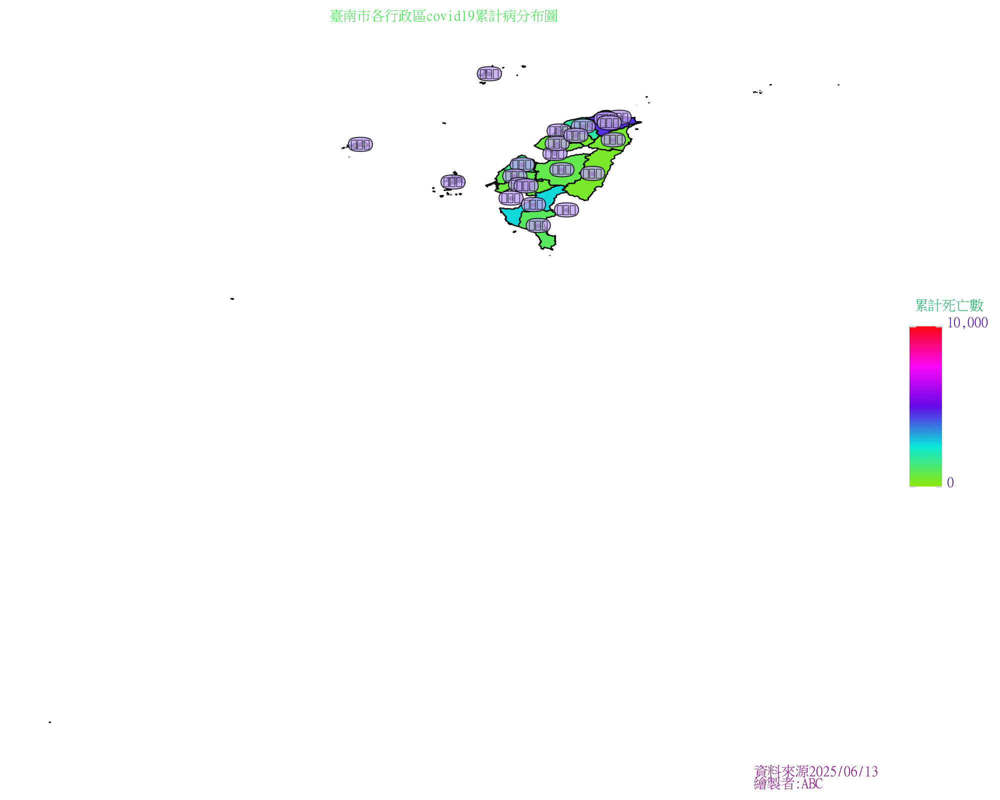

In [ ]:
ggplot() +\
  geom_map(covid_county_df,aes(fill='累計死亡數'))+\
  scale_x_continuous (labels=no_labels) +\
  scale_y_continuous (labels=no_labels) +\
  scale_color_gradientn(colors=['#8fe809', '#09e8d9', '#6609e8','#fa07fa','#fa0714'],
          breaks=np.arange (0,np.max( (covid_county_df.累計死亡數)//10000)+2)*10000,
                    limits = (0, np.max (covid_county_df.累計死亡數//10000+1)*10000),
                    labels = comma_format(),
                    aesthetics=['fill'])+\
  labs (title=city+'各行政區covid19累計病分布圖',
      x='', y='',
      caption='資料來源'+ pd. Timestamp("today").strftime("%Y/%m/%d")+'\n繪製者:ABC')+\
  theme_classic() +\
  geom_point(data=df_county_centroid, mapping=aes (x='long', y='lat'), size=1, color='#1c1a1a') +\
  geom_label(data=df_county_centroid, mapping=aes (x='long', y='lat', label='dist'),
        nudge_y=0.01, family='DFKai-SB', boxstyle='round4', colour='black',
        fill='#bda2f2', alpha=0.8, size=8) +\
      theme (text=element_text(fontproperties=aaa),
          plot_title=element_text(fontproperties=aaa, colour='#2de33d', ha='center'),
          plot_caption=element_text(fontproperties=aaa, color='purple'),
          legend_title=element_text(fontproperties=aaa, colour='#08a654', ha='center'),
          legend_text=element_text (fontproperties=aaa, colour='#4708a6', va='baseline'),
          legend_position='right',
          legend_direction='vertical',
          axis_line=element_blank(),
          axis_ticks=element_blank(),
          figure_size=(10,8))

In [ ]:
df_city=np.sort(covid_df_dist.['縣市'].unique())
df_city

SyntaxError: invalid syntax (<ipython-input-235-1325647921>, line 1)

In [ ]:
import ipywidgets as widgets
from IPython. display import display
W = widgets. Dropdown (
      options=df_city,
      value=df_city[0],
      description='縣市',
      disabled=False
)
display (w)

NameError: name 'df_city' is not defined

In [ ]:
w.value

In [ ]:
df_city=covid_df_dist[covid_df_dist['縣市']==w.value]
dist_city = dist[dist['COUNTYNAME']== w.value]
dist_city_centroid= pd.DataFrame({'dist':dist_city['TOWNNAME']
                  'long':dist_city.centroid.x,
                  'lat':dist_city.centroid.y})
city_covid_df = (pd.merge(df_city[['鄉鎮','累計死亡數']],
              dist_city[['TOWNNAME','geometry']],
              left_on='鄉鎮',right_on='TOWNNAME')
            .drop(columns=['TOWNNAME']))
dist_city_centroid_1 = (pd.merge (dist_city_centroid, city_covid_df[['鄉鎮,累計死亡數']],
            left_on='dist', right_on='鄉鎮')
          .drop (columns = ['鄉鎮']))

In [ ]:
ggplot() +\
  geom_map(covid_county_df,aes(fill='累計死亡數'))+\
  scale_x_continuous (labels=no_labels) +\
  scale_y_continuous (labels=no_labels) +\
  scale_color_gradientn(colors=['#8fe809', '#09e8d9', '#6609e8','#fa07fa','#fa0714'],
          breaks=np.arange (0,np.max((covid_county_df.累計死亡數)//10000)+2)*10000,10000),
                    limits = (0, np.max (covid_county_df.累計死亡數//10000+1)*10000),
                    labels = comma_format(),
                    aesthetics=['fill']+\
  labs (title=city+'各行政區covid19累計病分布圖',
      x='',
      y=''),
      caption='資料來源'+ pd. Timestamp("today").strftime("%Y/%m/%d")+'\n繪製者:ABC')+\
  theme_classic() +\
  geom_point(data=df_county_centroid, mapping=aes (x='long', y='lat'), size=1, color='#1clala') +\
  geom_label(data=df_county_centroid, mapping=aes (x='long', y='lat', label='dist'),
        nudge_y=0.01, family='DFKai-SB', boxstyle='round4', colour='black',
        fill='#bda2f2', alpha=0.8, size=8) +\
    theme (text=element_text(fontproperties=aaa),
        plot_title element_text(fontproperties=aaa, colour = '#2de33d', ha='center'),
        plot_caption-element_text(fontproperties=aaa, color='purple'),
        legend_title=element_text(fontproperties=aaa, colour= '#08a654', ha='center'),
        legend_text=element_text (fontproperties=aaa, colour='#4708a6', va='baseline'),
        legend_position='right',
        legend_direction='vertical',
        axis_line=element_blank),
        axis_ticks-element_blank,
        figure_size=(10,8))

IndentationError: unindent does not match any outer indentation level (<tokenize>, line 13)

#W16

# 性別比例

In [ ]:
covid_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23161 entries, 0 to 23160
Data columns (total 7 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   死亡日     23161 non-null  datetime64[ns]
 1   縣市      23161 non-null  object        
 2   鄉鎮      23161 non-null  object        
 3   性別      23161 non-null  object        
 4   年齡層     23161 non-null  object        
 5   死亡病例數   23161 non-null  int64         
 6   性别      5516 non-null   object        
dtypes: datetime64[ns](1), int64(1), object(5)
memory usage: 1.2+ MB


In [ ]:
age_level=pd. Series (covid_df ['年齡層'].unique()).sort_values ()
age_level=age_level [age_level. isin (['0~4','5~9'])].sort_values ()
age_level = pd.concat([pd. Series (['0~4','5~9']), age_level])
age_level

,0
0,0~4
1,5~9
9,0~4
13,5~9


In [ ]:
from pandas. api. types import CategoricalDtype
age_cat = CategoricalDtype(categories=age_level,ordered=True)
age_cat

ValueError: Categorical categories must be unique

In [ ]:
# Get unique age levels
age_level = pd.Series(covid_df['年齡層'].unique())

# Remove '0~4' and '5~9' from the unique levels and sort the rest
remaining_levels = age_level[~age_level.isin(['0~4', '5~9'])].sort_values()

# Concatenate the initial categories ('0~4', '5~9') with the sorted remaining levels
age_level = pd.concat([pd.Series(['0~4', '5~9']), remaining_levels]).reset_index(drop=True)

# Print the final age_level to verify
print(age_level)

# Now create the CategoricalDtype
from pandas.api.types import CategoricalDtype
age_cat = CategoricalDtype(categories=age_level, ordered=True)
age_cat

0       0~4
1       5~9
2     10~14
3     15~19
4     20~24
5     25~29
6     30~34
7     35~39
8     40~44
9     45~49
10    50~54
11    55~59
12    60~64
13    65~69
14      70+
dtype: object


CategoricalDtype(categories=['0~4', '5~9', '10~14', '15~19', '20~24', '25~29', '30~34',
                  '35~39', '40~44', '45~49', '50~54', '55~59', '60~64',
                  '65~69', '70+'],
, ordered=True, categories_dtype=object)

In [ ]:
covid_df['年齡層'] = covid_df['年齡層'].astype(age_cat)

In [ ]:
gender_df = (covid_df [['性別','死亡病例數']]
            .groupby(['性別'])
            .sum()
            .reset_index())
gender_df

,性別,死亡病例數
0,F,10409
1,M,14446


In [ ]:
gender_df ['比例'] = gender_df['死亡病例數'] / sum (gender_df['死亡病例數'])

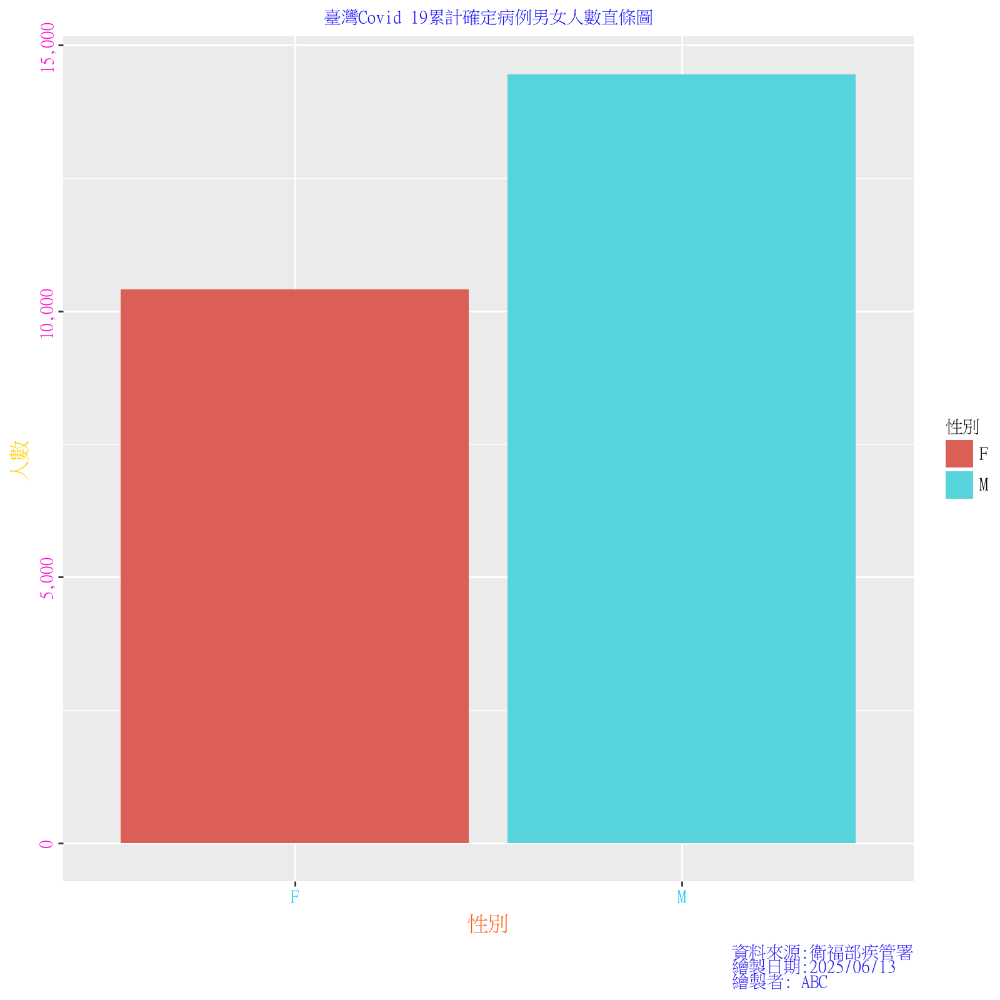

In [ ]:
ggplot(data=gender_df, mapping=aes(x='性別', y='死亡病例數', fill='性別')) +\
    geom_bar(stat='identity') +\
    scale_y_continuous(labels=comma_format()) +\
    labs(
        title='臺灣Covid 19累計確定病例男女人數直條圖',
        x='性別',
        y='人數',
        caption='資料來源:衛福部疾管署\n繪製日期:' + pd.Timestamp("today").strftime("%Y/%m/%d") + '\n繪製者: ABC'
    ) +\
    theme(
        text=element_text(fontproperties=aaa),
        plot_title=element_text(fontproperties=aaa, color='#1105fc', weight='bold', ha='center', size=14),
        axis_title_x=element_text(fontproperties=aaa, style='italic', color='#fc5305', ha='center', size=12),
        axis_title_y=element_text(fontproperties=aaa, color='#fcd305', size=12),
        axis_text_x=element_text(fontproperties=aaa, color='#05c7fc', size=10, ha='center'),
        axis_text_y=element_text(fontproperties=aaa, color='#fc05cf', rotation=90, size=10, va='center'),
        plot_caption=element_text(fontproperties=aaa, color='#2318f0', size=10),
        figure_size=(8, 8)
    )


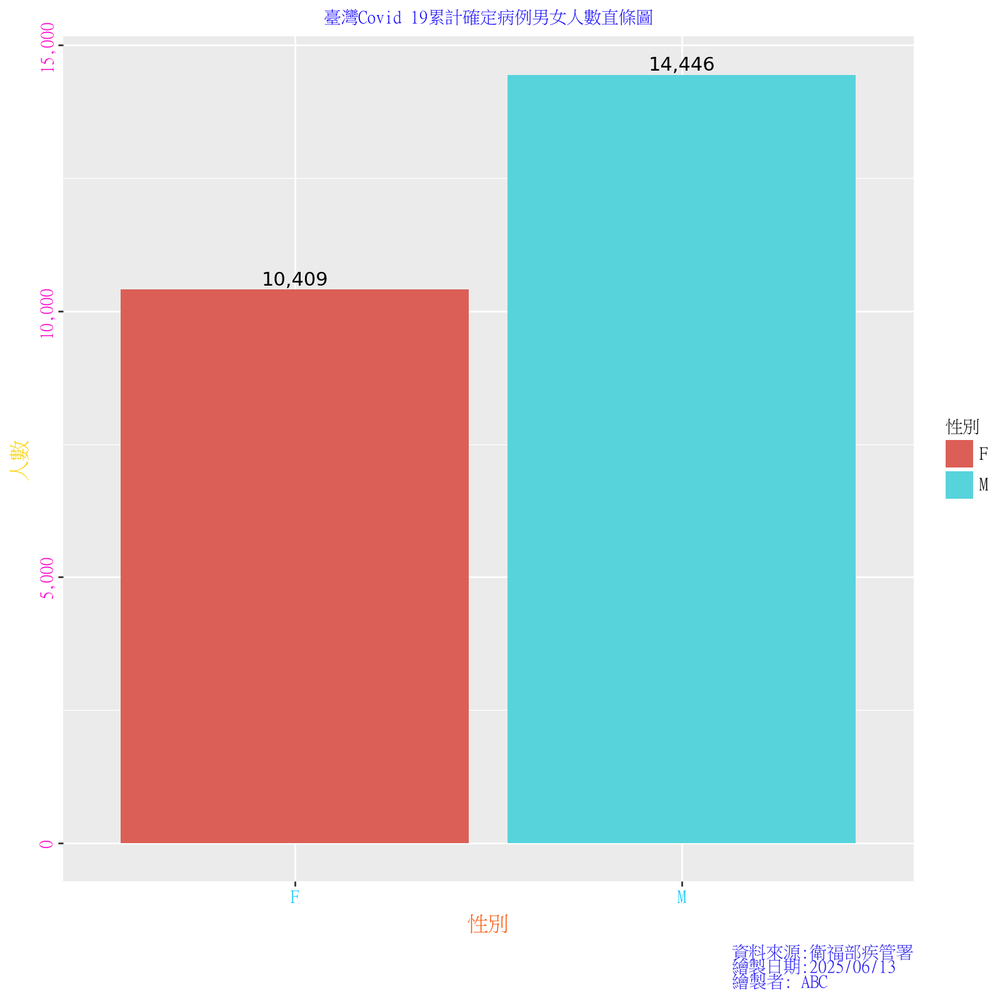

In [ ]:
ggplot(data=gender_df, mapping=aes(x='性別', y='死亡病例數', fill='性別')) +\
    geom_bar(stat='identity') +\
    geom_text(
        aes(label='死亡病例數'),
        nudge_y=0.125,
        va='bottom',
        format_string='{:,}')+\
    scale_y_continuous(labels=comma_format()) +\
    labs(
        title='臺灣Covid 19累計確定病例男女人數直條圖',
        x='性別',
        y='人數',
        caption='資料來源:衛福部疾管署\n繪製日期:' + pd.Timestamp("today").strftime("%Y/%m/%d") + '\n繪製者: ABC'
    ) +\
    theme(
        text=element_text(fontproperties=aaa),
        plot_title=element_text(fontproperties=aaa, color='#1105fc', weight='bold', ha='center', size=14),
        axis_title_x=element_text(fontproperties=aaa, style='italic', color='#fc5305', ha='center', size=12),
        axis_title_y=element_text(fontproperties=aaa, color='#fcd305', size=12),
        axis_text_x=element_text(fontproperties=aaa, color='#05c7fc', size=10, ha='center'),
        axis_text_y=element_text(fontproperties=aaa, color='#fc05cf', rotation=90, size=10, va='center'),
        plot_caption=element_text(fontproperties=aaa, color='#2318f0', size=10),
        figure_size=(8, 8))


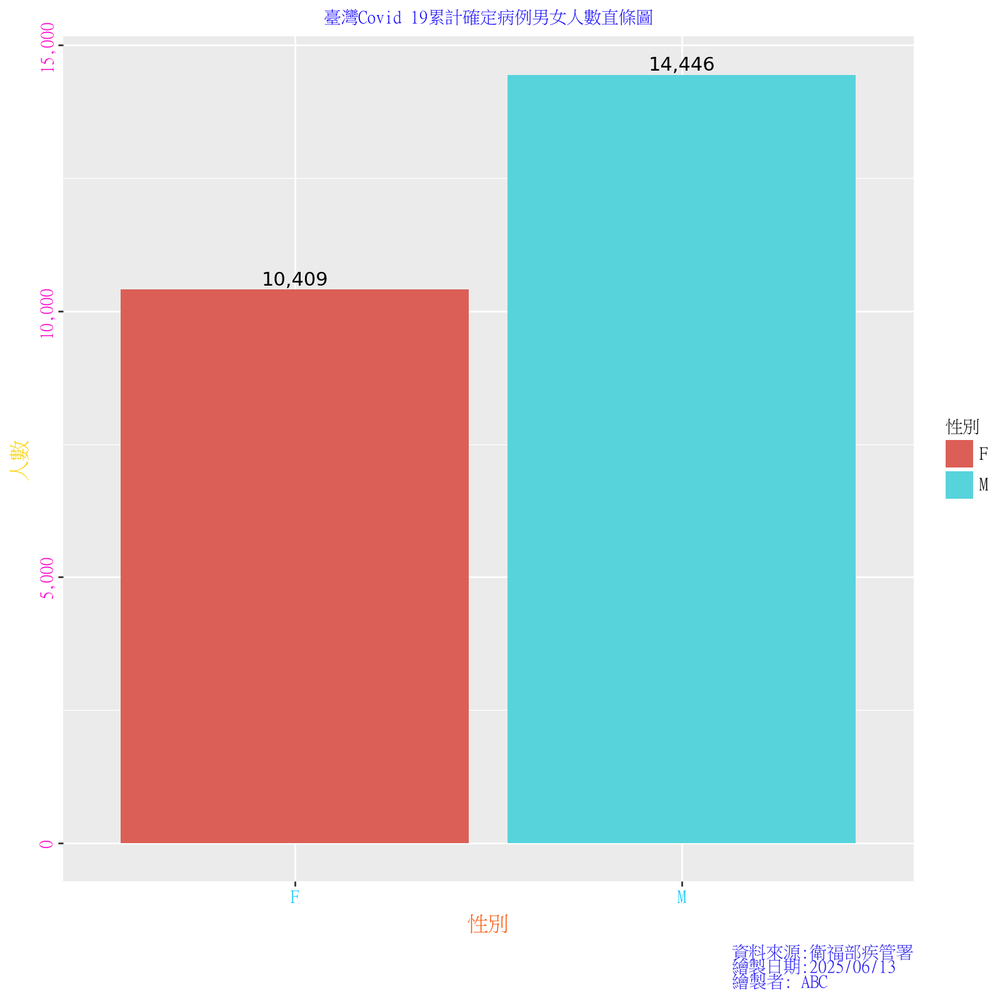

In [ ]:
ggplot(data=gender_df, mapping=aes(x='性別', y='死亡病例數', fill='性別')) +\
    geom_bar(stat='identity') +\
    geom_text(
        aes(label='comma_format()(死亡病例數)'),
        nudge_y=0.125,
        va='bottom')+\
    scale_y_continuous(labels=comma_format()) +\
    labs(
        title='臺灣Covid 19累計確定病例男女人數直條圖',
        x='性別',
        y='人數',
        caption='資料來源:衛福部疾管署\n繪製日期:' + pd.Timestamp("today").strftime("%Y/%m/%d") + '\n繪製者: ABC'
    ) +\
    theme(
        text=element_text(fontproperties=aaa),
        plot_title=element_text(fontproperties=aaa, color='#1105fc', weight='bold', ha='center', size=14),
        axis_title_x=element_text(fontproperties=aaa, style='italic', color='#fc5305', ha='center', size=12),
        axis_title_y=element_text(fontproperties=aaa, color='#fcd305', size=12),
        axis_text_x=element_text(fontproperties=aaa, color='#05c7fc', size=10, ha='center'),
        axis_text_y=element_text(fontproperties=aaa, color='#fc05cf', rotation=90, size=10, va='center'),
        plot_caption=element_text(fontproperties=aaa, color='#2318f0', size=10),
        figure_size=(8, 8))


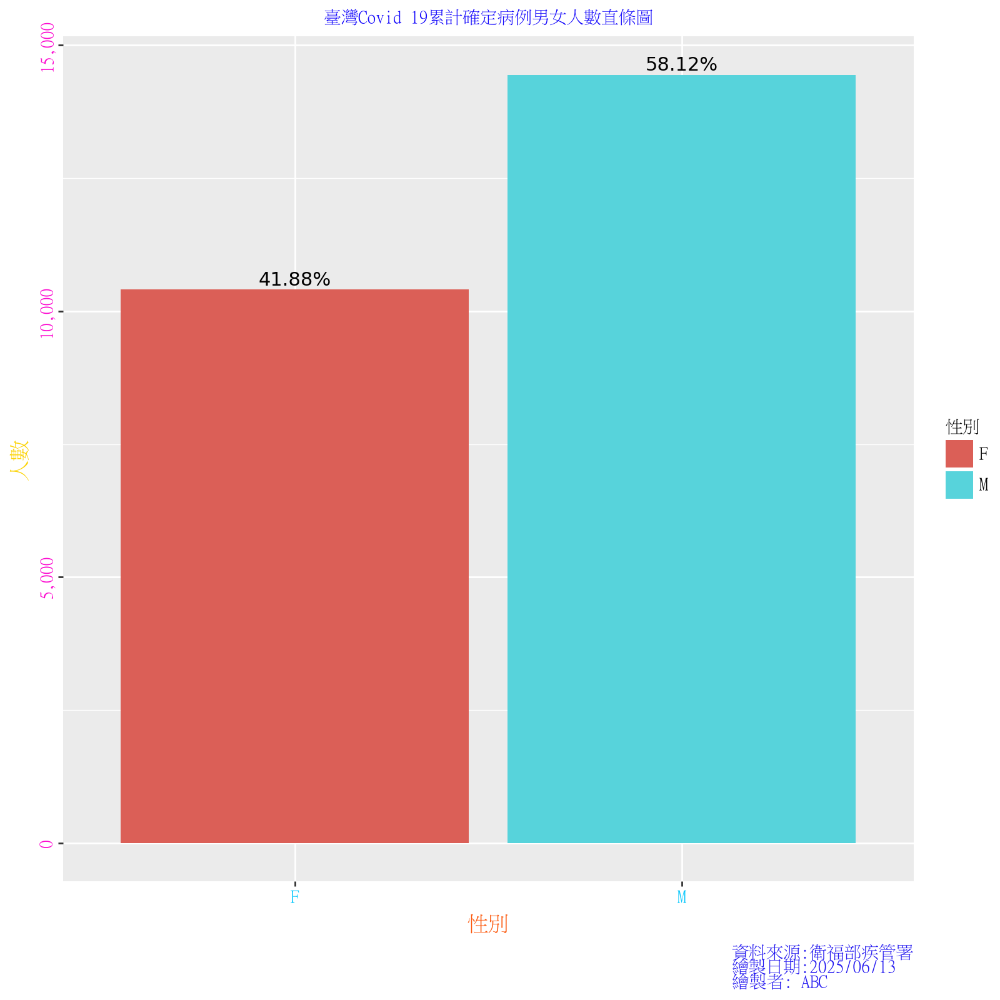

In [ ]:
ggplot(data=gender_df, mapping=aes(x='性別', y='死亡病例數', fill='性別')) +\
    geom_bar(stat='identity') +\
    scale_y_continuous(labels=comma_format()) +\
    labs(
        title='臺灣Covid 19累計確定病例男女人數直條圖',
        x='性別',
        y='人數',
        caption='資料來源:衛福部疾管署\n繪製日期:' + pd.Timestamp("today").strftime("%Y/%m/%d") + '\n繪製者: ABC'
    ) +\
    geom_text(aes(label='比例*100'),
         nudge_y=0.125,va='bottom',
         format_string='{:.2f}%')+\
    theme( text=element_text(fontproperties=aaa),
        plot_title=element_text(fontproperties=aaa, color='#1105fc', weight='bold', ha='center', size=14),
        axis_title_x=element_text(fontproperties=aaa, style='italic', color='#fc5305', ha='center', size=12),
        axis_title_y=element_text(fontproperties=aaa, color='#fcd305', size=12),
        axis_text_x=element_text(fontproperties=aaa, color='#05c7fc', size=10, ha='center'),
        axis_text_y=element_text(fontproperties=aaa, color='#fc05cf', rotation=90, size=10, va='center'),
        plot_caption=element_text(fontproperties=aaa, color='#2318f0', size=10),
        figure_size=(8,8))


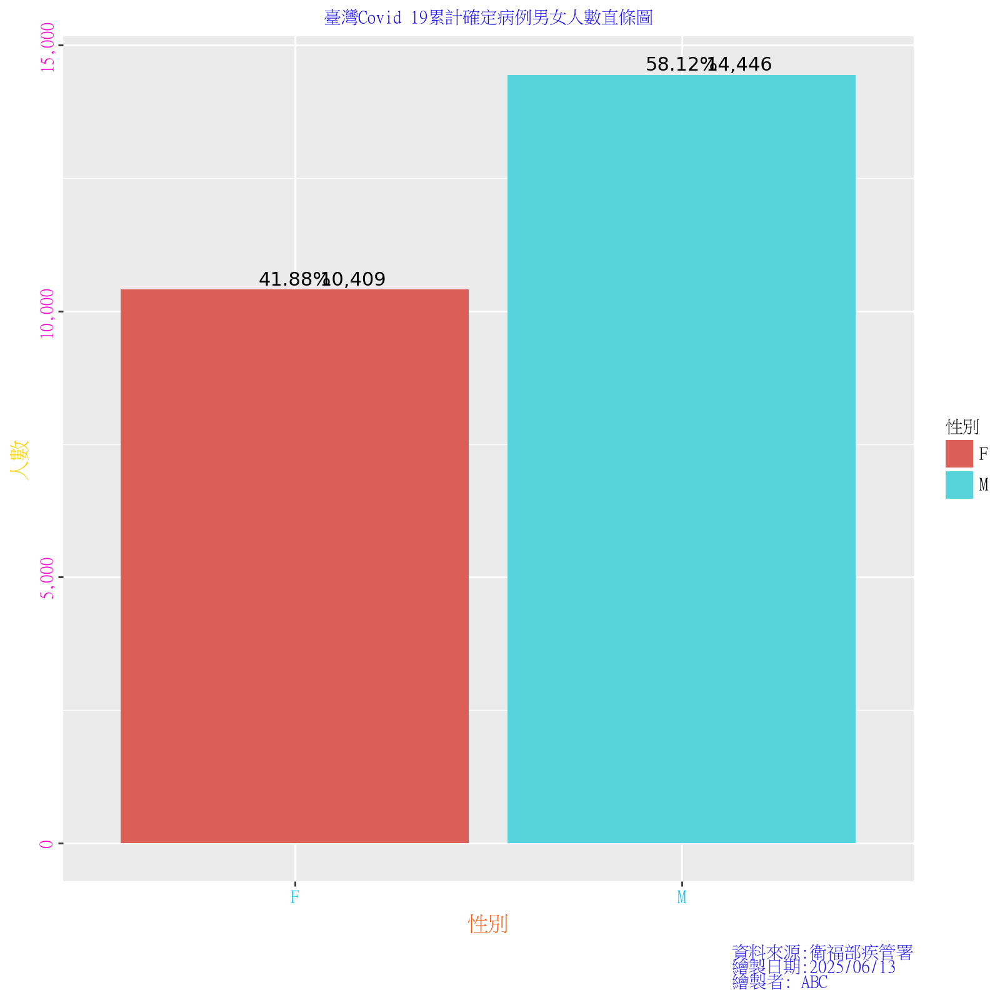

In [ ]:
ggplot(data=gender_df, mapping=aes(x='性別', y='死亡病例數', fill='性別')) +\
    geom_bar(stat='identity') +\
    scale_y_continuous(labels=comma_format()) +\
    labs(
        title='臺灣Covid 19累計確定病例男女人數直條圖',
        x='性別',
        y='人數',
        caption='資料來源:衛福部疾管署\n繪製日期:' + pd.Timestamp("today").strftime("%Y/%m/%d") + '\n繪製者: ABC'
    ) +\
    geom_text(aes(label='comma_format()(死亡病例數)'),
         nudge_x=0.15,
         nudge_y=0.125,
         va='bottom',)+\
    geom_text(aes(label='比例*100'),
         nudge_y=0.125,va='bottom',
         format_string='{:.2f}%')+\
    theme(text=element_text(fontproperties=aaa),
        plot_title=element_text(fontproperties=aaa, color='#1105fc', weight='bold', ha='center', size=14),
        axis_title_x=element_text(fontproperties=aaa, style='italic', color='#fc5305', ha='center', size=12),
        axis_title_y=element_text(fontproperties=aaa, color='#fcd305', size=12),
        axis_text_x=element_text(fontproperties=aaa, color='#05c7fc', size=10, ha='center'),
        axis_text_y=element_text(fontproperties=aaa, color='#fc05cf', rotation=90, size=10, va='center'),
        plot_caption=element_text(fontproperties=aaa, color='#2318f0', size=10),
        figure_size=(8,8))


In [ ]:
def combine (counts, percentages):
  fmt = '{:,} \({:.2f}%)'.format
  return [fmt(c, p) for c, p in zip (counts, percentages*100)]

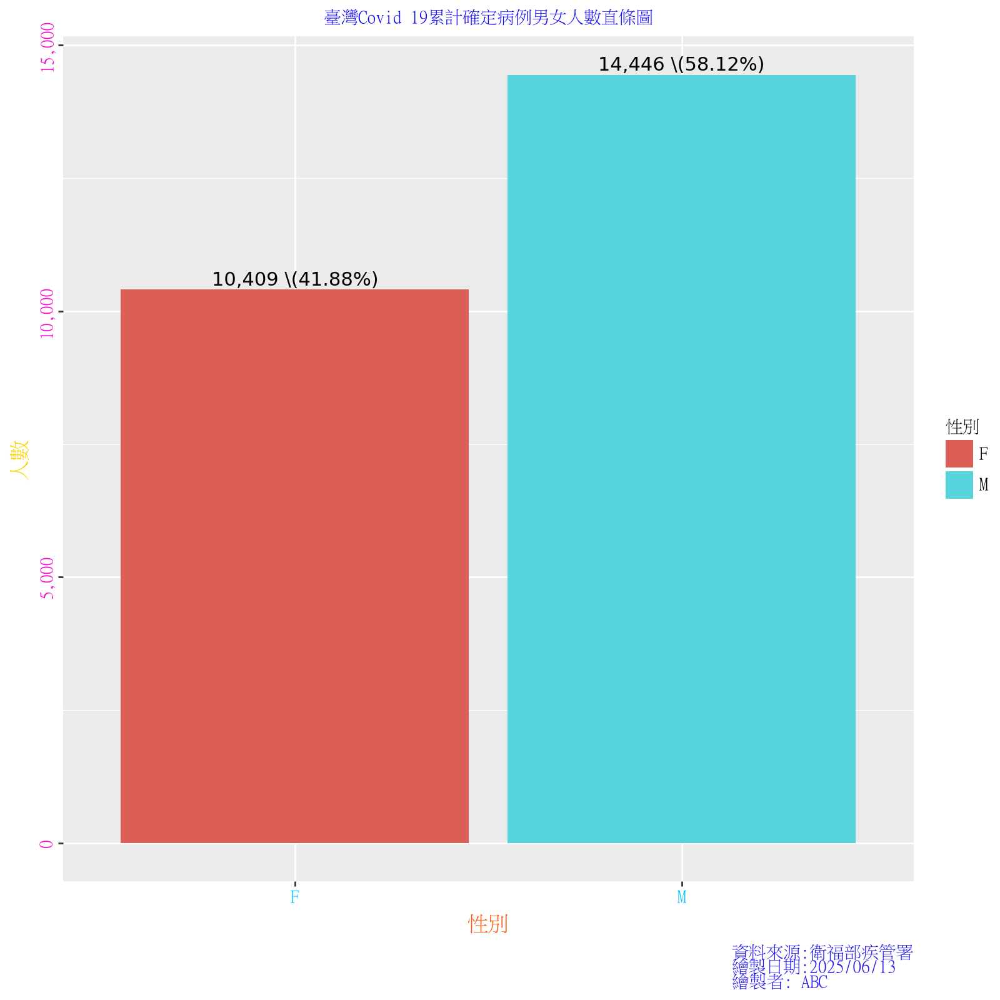

In [ ]:
ggplot(data=gender_df, mapping=aes(x='性別', y='死亡病例數', fill='性別')) +\
    geom_bar(stat='identity') +\
    scale_y_continuous(labels=comma_format()) +\
    labs(
        title='臺灣Covid 19累計確定病例男女人數直條圖',
        x='性別',
        y='人數',
        caption='資料來源:衛福部疾管署\n繪製日期:' + pd.Timestamp("today").strftime("%Y/%m/%d") + '\n繪製者: ABC'
    ) +\
    geom_text(aes(label='combine(死亡病例數,比例)'),
         nudge_y=0.125,
         va='bottom')+\
    theme(text=element_text(fontproperties=aaa),
        plot_title=element_text(fontproperties=aaa, color='#1105fc', weight='bold', ha='center', size=14),
        axis_title_x=element_text(fontproperties=aaa, style='italic', color='#fc5305', ha='center', size=12),
        axis_title_y=element_text(fontproperties=aaa, color='#fcd305', size=12),
        axis_text_x=element_text(fontproperties=aaa, color='#05c7fc', size=10, ha='center'),
        axis_text_y=element_text(fontproperties=aaa, color='#fc05cf', rotation=90, size=10, va='center'),
        plot_caption=element_text(fontproperties=aaa, color='#2318f0', size=10),
        figure_size=(8,8))


In [ ]:
gender_age_df = (covid_df[['性別','年齡層','死亡病例數']]
          .groupby(['性別','年齡層'])
          .sum()
          .reset_index())
gender_age_df.head()

<ipython-input-250-1444997807>:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.


,性別,年齡層,死亡病例數
0,F,0~4,14
1,F,5~9,2
2,F,10~14,1
3,F,15~19,3
4,F,20~24,7


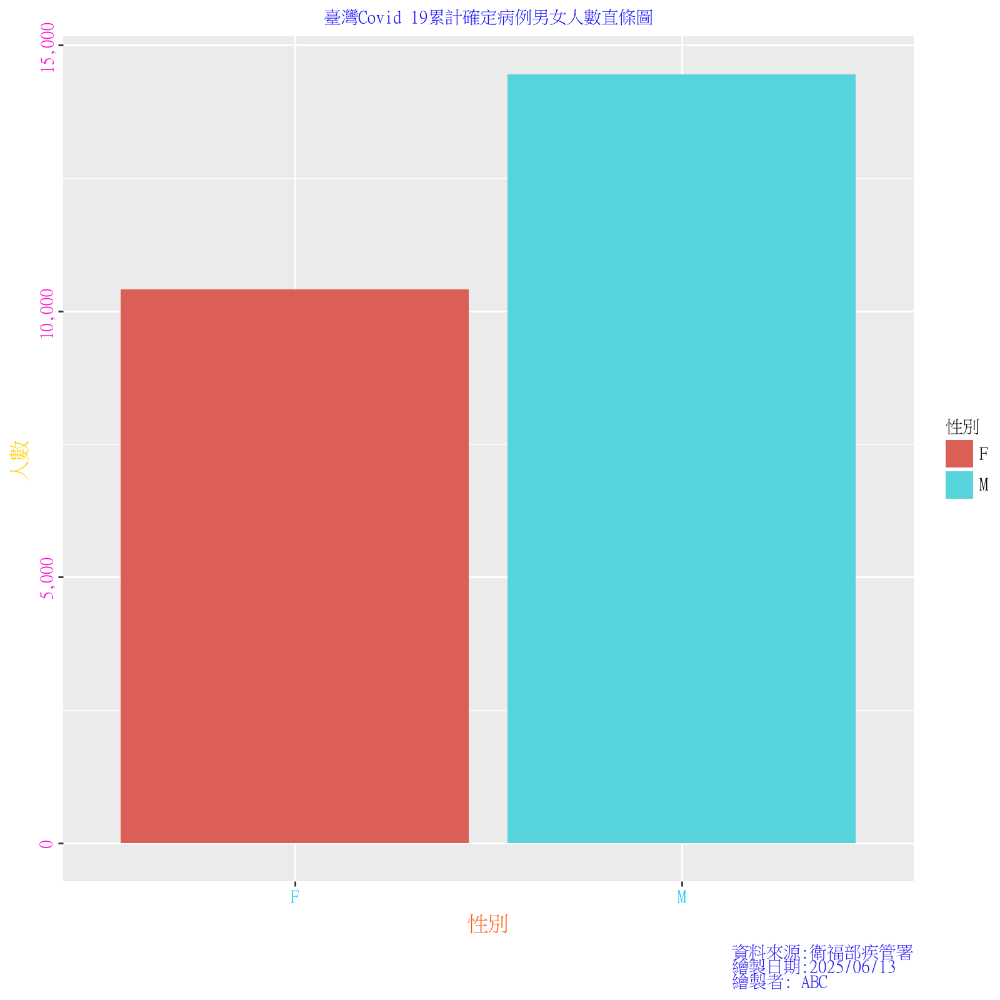

In [ ]:
ggplot(data=gender_df, mapping=aes(x='性別', y='死亡病例數', fill='性別')) +\
    geom_bar(stat='identity') +\
    scale_y_continuous(labels=comma_format()) +\
    labs(
        title='臺灣Covid 19累計確定病例男女人數直條圖',
        x='性別',
        y='人數',
        caption='資料來源:衛福部疾管署\n繪製日期:' + pd.Timestamp("today").strftime("%Y/%m/%d") + '\n繪製者: ABC'
    ) +\
    theme(text=element_text(fontproperties=aaa),
        plot_title=element_text(fontproperties=aaa, color='#1105fc', weight='bold', ha='center', size=14),
        axis_title_x=element_text(fontproperties=aaa, style='italic', color='#fc5305', ha='center', size=12),
        axis_title_y=element_text(fontproperties=aaa, color='#fcd305', size=12),
        axis_text_x=element_text(fontproperties=aaa, color='#05c7fc', size=10, ha='center'),
        axis_text_y=element_text(fontproperties=aaa, color='#fc05cf', rotation=90, size=10, va='center'),
        plot_caption=element_text(fontproperties=aaa, color='#2318f0', size=10),
        figure_size=(8,8))


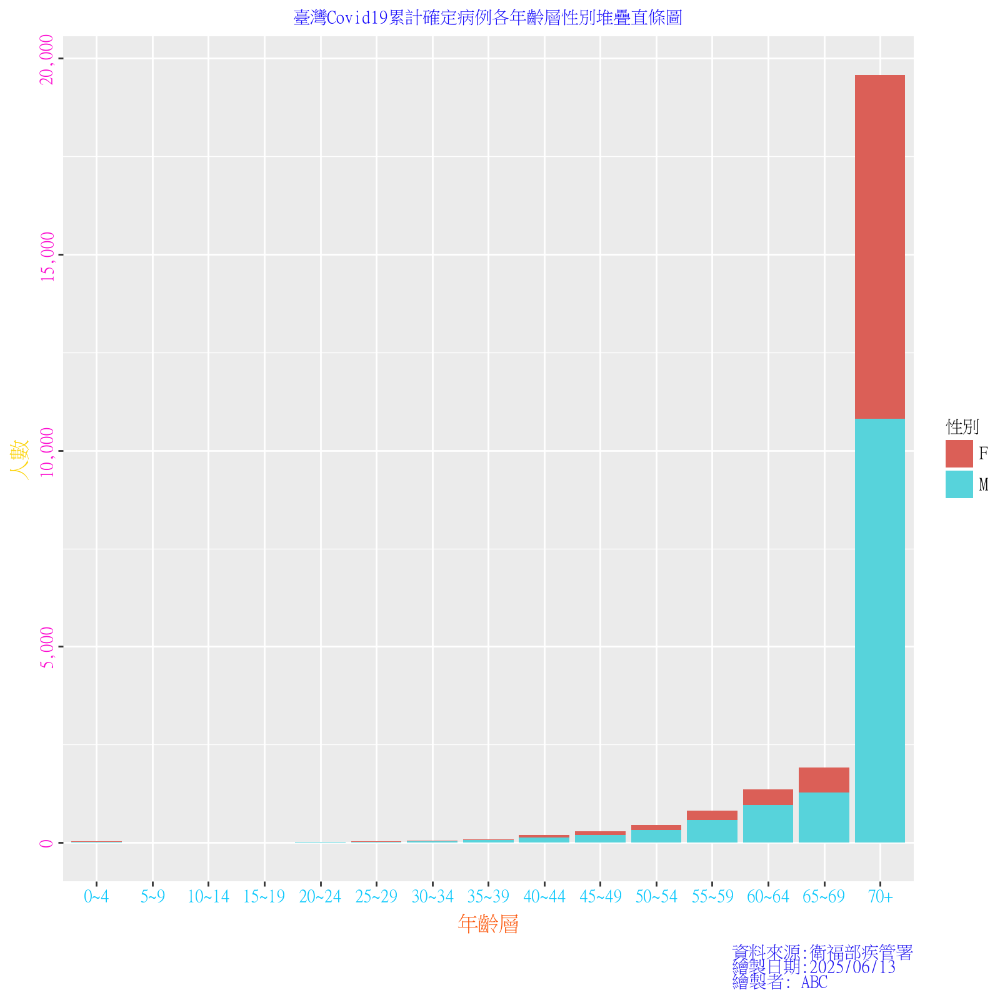

In [ ]:
# Use the correct dataframe gender_age_df which contains the '年齡層' column
ggplot(data=gender_age_df, mapping=aes(x='年齡層', y='死亡病例數', fill='性別')) +\
    geom_bar(stat='identity') +\
    scale_y_continuous(labels=comma_format()) +\
    labs(
        title='臺灣Covid19累計確定病例各年齡層性別堆疊直條圖',
        x='年齡層', # Correct the x-axis label to match the mapped column
        y='人數',
        caption='資料來源:衛福部疾管署\n繪製日期:' + pd.Timestamp("today").strftime("%Y/%m/%d") + '\n繪製者: ABC'
    ) +\
    theme(text=element_text(fontproperties=aaa),
        plot_title=element_text(fontproperties=aaa, color='#1105fc', weight='bold', ha='center', size=14),
        axis_title_x=element_text(fontproperties=aaa, style='italic', color='#fc5305', ha='center', size=12),
        axis_title_y=element_text(fontproperties=aaa, color='#fcd305', size=12),
        axis_text_x=element_text(fontproperties=aaa, color='#05c7fc', size=10, ha='center'),
        axis_text_y=element_text(fontproperties=aaa, color='#fc05cf', rotation=90, size=10, va='center'),
        plot_caption=element_text(fontproperties=aaa, color='#2318f0', size=10),
        figure_size=(8,8))

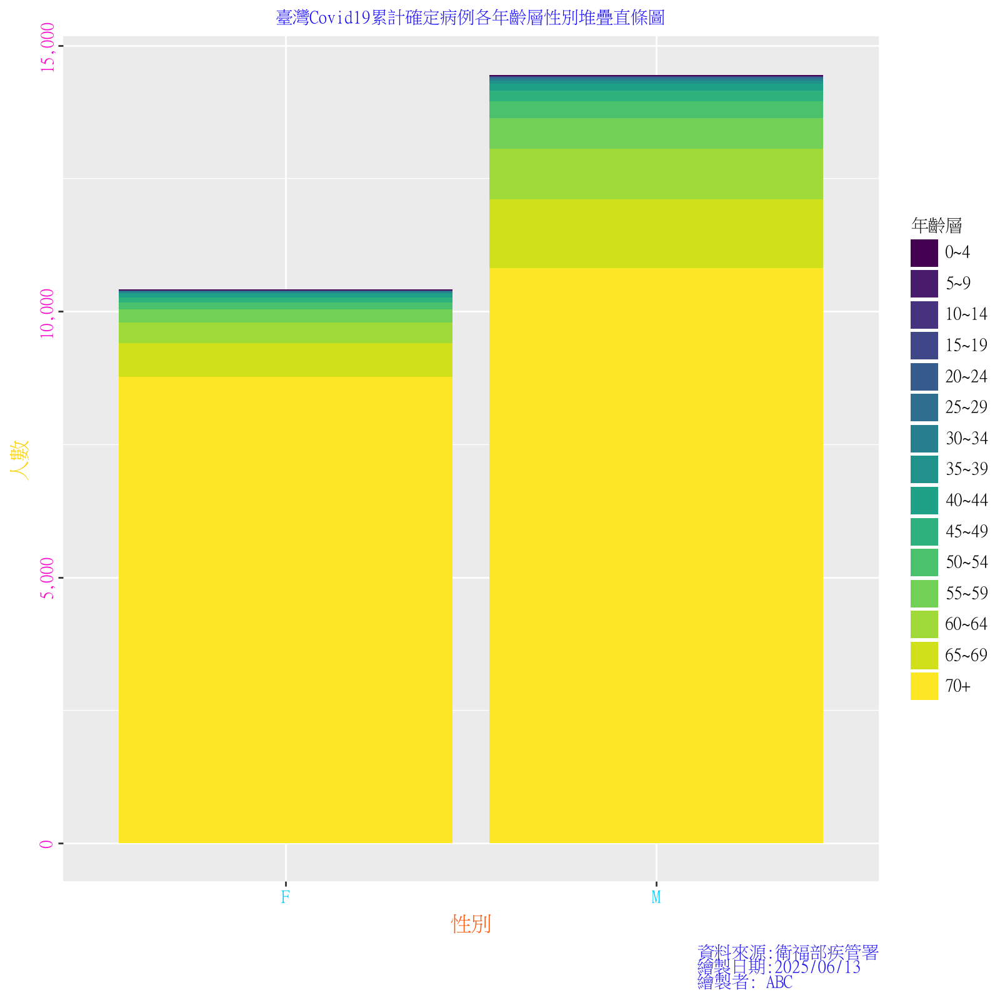

In [ ]:

ggplot(data=gender_age_df, mapping=aes(x='性別', y='死亡病例數', fill='年齡層')) +\
    geom_bar(stat='identity') +\
    scale_y_continuous(labels=comma_format()) +\
    labs(
        title='臺灣Covid19累計確定病例各年齡層性別堆疊直條圖',
        x='性別',
        y='人數',
        caption='資料來源:衛福部疾管署\n繪製日期:' + pd.Timestamp("today").strftime("%Y/%m/%d") + '\n繪製者: ABC'
    ) +\
    theme(text=element_text(fontproperties=aaa),
        plot_title=element_text(fontproperties=aaa, color='#1105fc', weight='bold', ha='center', size=14),
        axis_title_x=element_text(fontproperties=aaa, style='italic', color='#fc5305', ha='center', size=12),
        axis_title_y=element_text(fontproperties=aaa, color='#fcd305', size=12),
        axis_text_x=element_text(fontproperties=aaa, color='#05c7fc', size=10, ha='center'),
        axis_text_y=element_text(fontproperties=aaa, color='#fc05cf', rotation=90, size=10, va='center'),
        plot_caption=element_text(fontproperties=aaa, color='#2318f0', size=10),
        figure_size=(8,8))

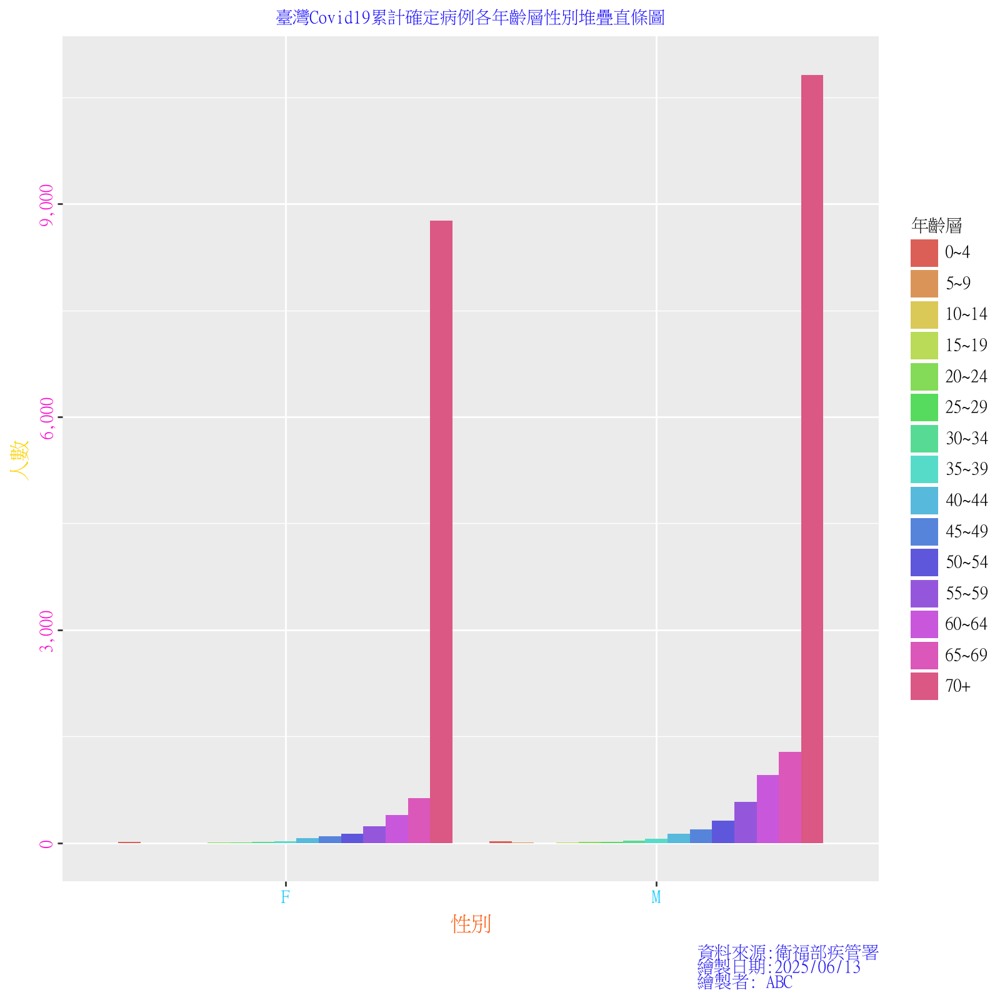

In [ ]:

ggplot(data=gender_age_df, mapping=aes(x='性別', y='死亡病例數', fill='年齡層')) +\
    geom_bar(stat='identity',position='dodge') +\
    scale_y_continuous(labels=comma_format()) +\
    scale_color_hue(aesthetics=['fill'])+\
    labs(
        title='臺灣Covid19累計確定病例各年齡層性別堆疊直條圖',
        x='性別',
        y='人數',
        caption='資料來源:衛福部疾管署\n繪製日期:' + pd.Timestamp("today").strftime("%Y/%m/%d") + '\n繪製者: ABC'
    ) +\
    theme(text=element_text(fontproperties=aaa),
        plot_title=element_text(fontproperties=aaa, color='#1105fc', weight='bold', ha='center', size=14),
        axis_title_x=element_text(fontproperties=aaa, style='italic', color='#fc5305', ha='center', size=12),
        axis_title_y=element_text(fontproperties=aaa, color='#fcd305', size=12),
        axis_text_x=element_text(fontproperties=aaa, color='#05c7fc', size=10, ha='center'),
        axis_text_y=element_text(fontproperties=aaa, color='#fc05cf', rotation=90, size=10, va='center'),
        plot_caption=element_text(fontproperties=aaa, color='#2318f0', size=10),
        figure_size=(8,8))

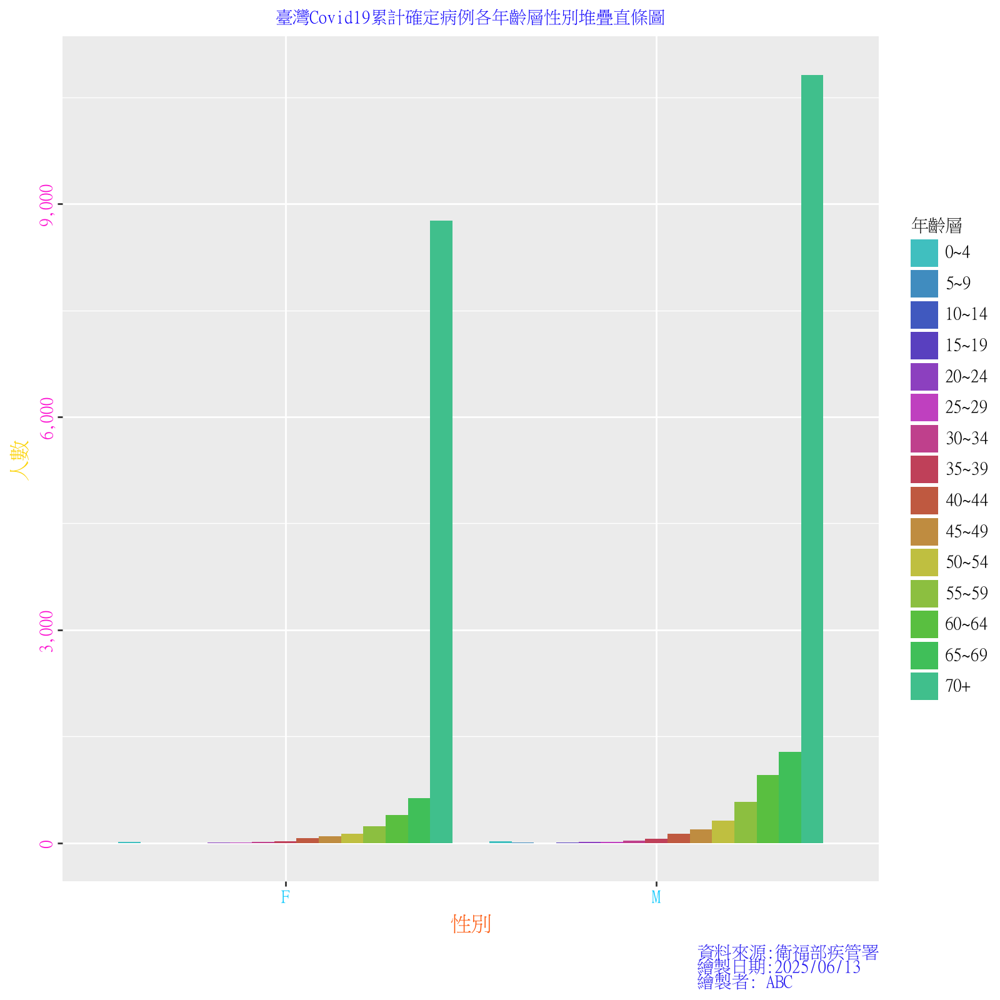

In [ ]:

ggplot(data=gender_age_df, mapping=aes(x='性別', y='死亡病例數', fill='年齡層')) +\
    geom_bar(stat='identity',position='dodge') +\
    scale_y_continuous(labels=comma_format()) +\
    scale_color_hue(h=0.5, l=0.5, s=0.5,aesthetics=['fill'])+\
    labs(
        title='臺灣Covid19累計確定病例各年齡層性別堆疊直條圖',
        x='性別', # Correct the x-axis label to match the mapped column
        y='人數',
        caption='資料來源:衛福部疾管署\n繪製日期:' + pd.Timestamp("today").strftime("%Y/%m/%d") + '\n繪製者: ABC'
    ) +\
    theme(text=element_text(fontproperties=aaa),
        plot_title=element_text(fontproperties=aaa, color='#1105fc', weight='bold', ha='center', size=14),
        axis_title_x=element_text(fontproperties=aaa, style='italic', color='#fc5305', ha='center', size=12),
        axis_title_y=element_text(fontproperties=aaa, color='#fcd305', size=12),
        axis_text_x=element_text(fontproperties=aaa, color='#05c7fc', size=10, ha='center'),
        axis_text_y=element_text(fontproperties=aaa, color='#fc05cf', rotation=90, size=10, va='center'),
        plot_caption=element_text(fontproperties=aaa, color='#2318f0', size=10),
        figure_size=(8,8))

/usr/local/lib/python3.11/dist-packages/plotnine/guides/guides.py:211: PlotnineWarning: Cannot generate legend for the 'color' aesthetic. Make sure you have mapped a variable to it


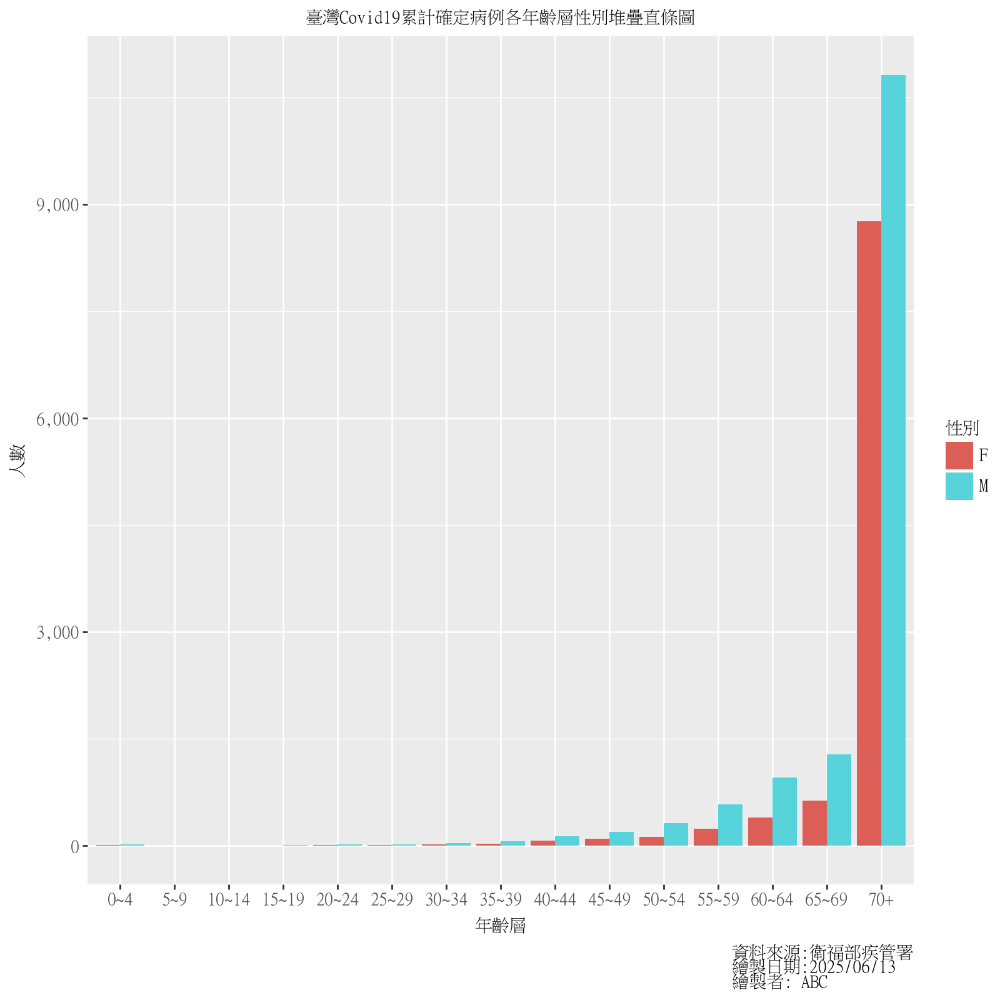

In [ ]:

ggplot(data=gender_age_df, mapping=aes(x='年齡層', y='死亡病例數', fill='性別')) +\
    geom_bar(stat='identity',position='dodge') +\
    scale_y_continuous(labels=comma_format()) +\
    scale_color_manual(values=['red','blue'])+\
    labs(
        title='臺灣Covid19累計確定病例各年齡層性別堆疊直條圖',
        x='年齡層', # Correct the x-axis label to match the mapped column
        y='人數',
        caption='資料來源:衛福部疾管署\n繪製日期:' + pd.Timestamp("today").strftime("%Y/%m/%d") + '\n繪製者: ABC'
    ) +\
    theme(text=element_text(fontproperties=aaa),
        figure_size=(8,8))

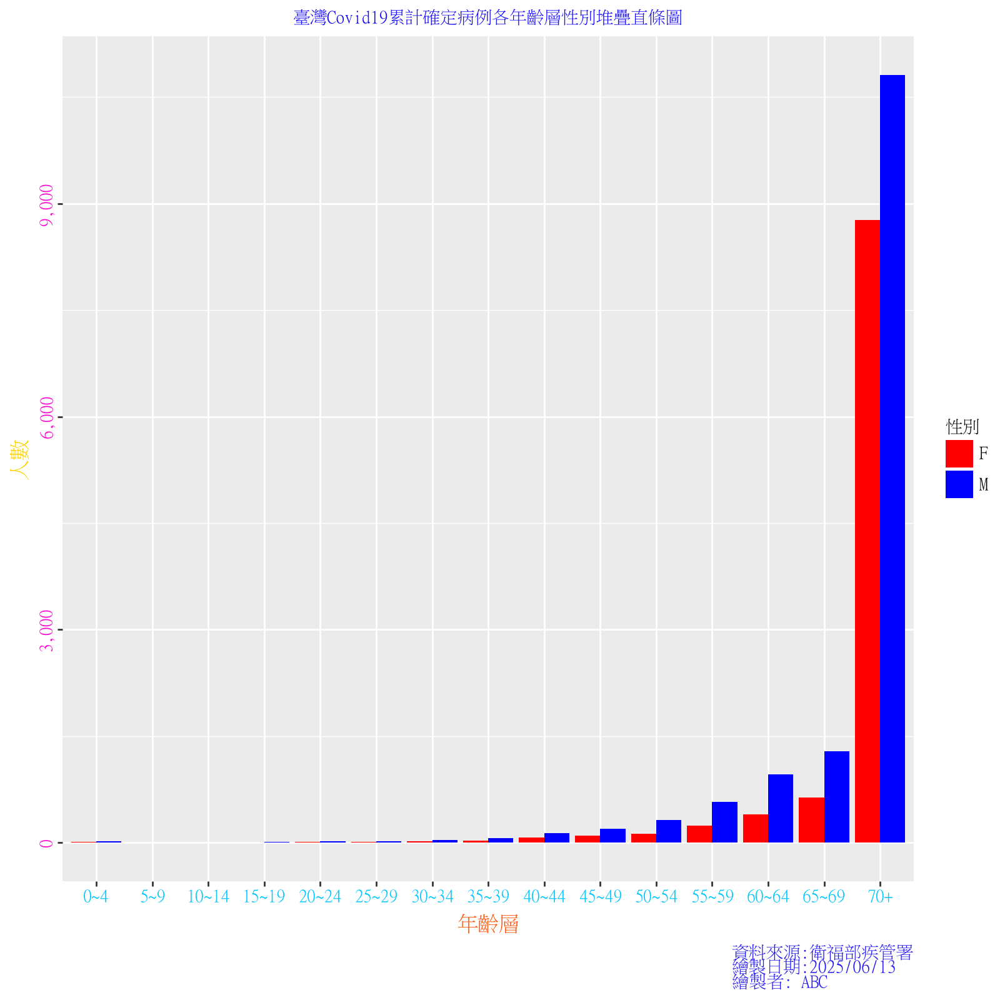

In [ ]:

ggplot(data=gender_age_df, mapping=aes(x='年齡層', y='死亡病例數', fill='性別')) +\
    geom_bar(stat='identity',position='dodge') +\
    scale_y_continuous(labels=comma_format()) +\
    scale_color_manual(values=['red','blue'],aesthetics=['fill'])+\
    labs(
        title='臺灣Covid19累計確定病例各年齡層性別堆疊直條圖',
        x='年齡層', # Correct the x-axis label to match the mapped column
        y='人數',
        caption='資料來源:衛福部疾管署\n繪製日期:' + pd.Timestamp("today").strftime("%Y/%m/%d") + '\n繪製者: ABC'
    ) +\
    theme(text=element_text(fontproperties=aaa),
        plot_title=element_text(fontproperties=aaa, color='#1105fc', weight='bold', ha='center', size=14),
        axis_title_x=element_text(fontproperties=aaa, style='italic', color='#fc5305', ha='center', size=12),
        axis_title_y=element_text(fontproperties=aaa, color='#fcd305', size=12),
        axis_text_x=element_text(fontproperties=aaa, color='#05c7fc', size=10, ha='center'),
        axis_text_y=element_text(fontproperties=aaa, color='#fc05cf', rotation=90, size=10, va='center'),
        plot_caption=element_text(fontproperties=aaa, color='#2318f0', size=10),
        figure_size=(8,8))

顯示各年齡層不同性別比例

In [ ]:
def prop_per_x(x, count):
      df = pd.DataFrame({
      'x': x,
      'count':count
      })
      prop = df ['count']/df.groupby('x', observed=False) ['count']. transform('sum')
      return prop

In [ ]:
gender_age_df [gender_age_df ['年齡層'] == '0~4']['死亡病例數']

,死亡病例數
0,14
15,23


In [ ]:
prop_per_x('0~4', gender_age_df [gender_age_df['年齡層'] == '0~4']['死亡病例數'])

,count
0,0.378378
15,0.621622


In [ ]:
from mizani.formatters import percent_format

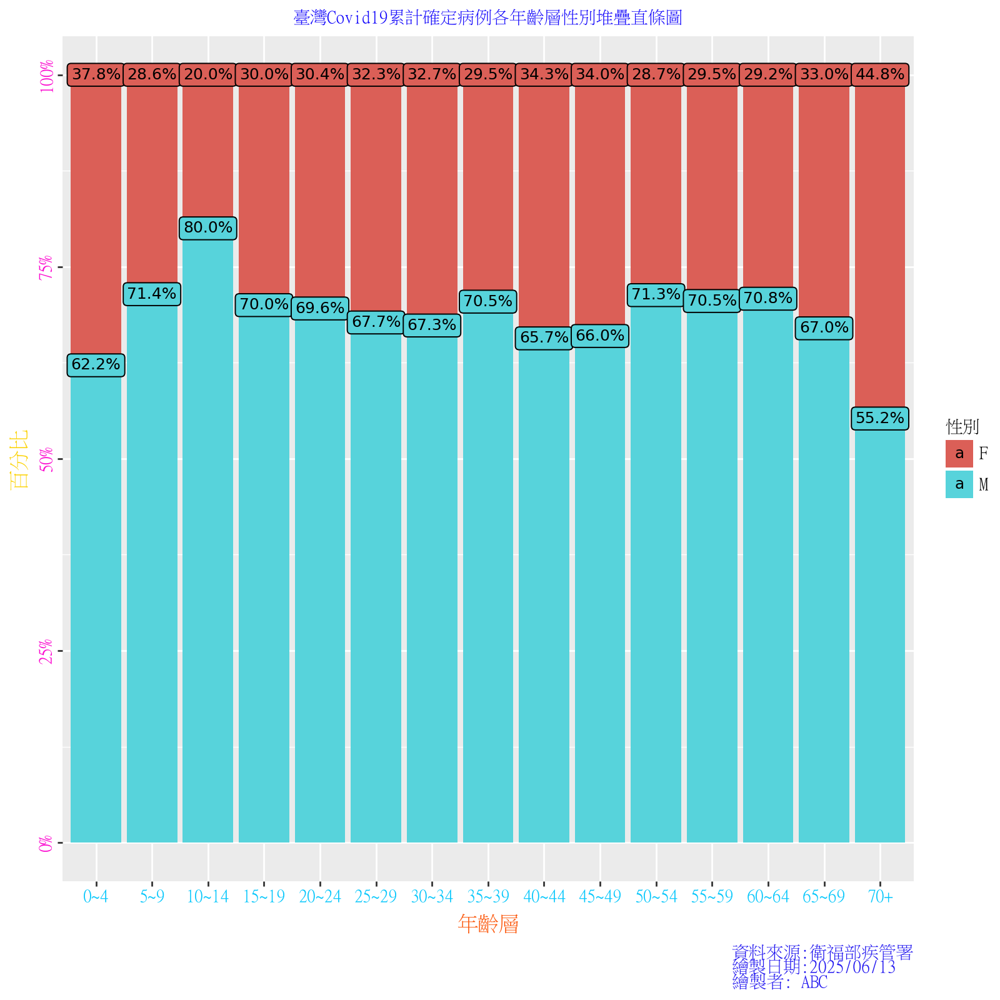

In [ ]:

ggplot(data=gender_age_df, mapping=aes(x='年齡層', y='死亡病例數', fill='性別')) +\
    geom_bar(stat='identity',position='fill') +\
    scale_y_continuous(labels=percent_format()) +\
    geom_label(
        aes(label='prop_per_x(年齡層,死亡病例數)*100'),
        position='fill',
        format_string='{:.1f}%',
        size=9) +\
    labs( title='臺灣Covid19累計確定病例各年齡層性別堆疊直條圖',
        x='年齡層',
        y='百分比',
        caption='資料來源:衛福部疾管署\n繪製日期:' + pd.Timestamp("today").strftime("%Y/%m/%d") + '\n繪製者: ABC'
    ) +\
    theme(text=element_text(fontproperties=aaa),
        plot_title=element_text(fontproperties=aaa, color='#1105fc', weight='bold', ha='center', size=14),
        axis_title_x=element_text(fontproperties=aaa, style='italic', color='#fc5305', ha='center', size=12),
        axis_title_y=element_text(fontproperties=aaa, color='#fcd305', size=12),
        axis_text_x=element_text(fontproperties=aaa, color='#05c7fc', size=10, ha='center'),
        axis_text_y=element_text(fontproperties=aaa, color='#fc05cf', rotation=90, size=10, va='center'),
        plot_caption=element_text(fontproperties=aaa, color='#2318f0', size=10),
        figure_size=(8,8))

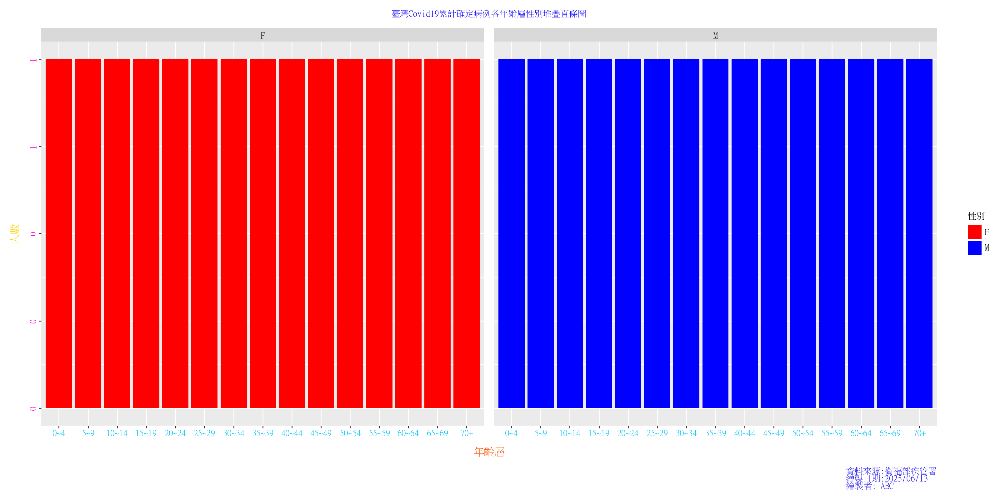

In [ ]:

ggplot(data=gender_age_df, mapping=aes(x='年齡層', y='死亡病例數', fill='性別')) +\
    geom_bar(stat='identity',position='fill') +\
    scale_y_continuous(labels=comma_format()) +\
    scale_color_manual(values=['red','blue'],aesthetics=['fill'])+\
    labs( title='臺灣Covid19累計確定病例各年齡層性別堆疊直條圖',
        x='年齡層',
        y='人數',
        caption='資料來源:衛福部疾管署\n繪製日期:' + pd.Timestamp("today").strftime("%Y/%m/%d") + '\n繪製者: ABC'
    ) +\
    theme(text=element_text(fontproperties=aaa),
        plot_title=element_text(fontproperties=aaa, color='#1105fc', weight='bold', ha='center', size=14),
        axis_title_x=element_text(fontproperties=aaa, style='italic', color='#fc5305', ha='center', size=12),
        axis_title_y=element_text(fontproperties=aaa, color='#fcd305', size=12),
        axis_text_x=element_text(fontproperties=aaa, color='#05c7fc', size=10, ha='center'),
        axis_text_y=element_text(fontproperties=aaa, color='#fc05cf', rotation=90, size=10, va='center'),
        plot_caption=element_text(fontproperties=aaa, color='#2318f0', size=10),
        figure_size=(16,8))+\
    facet_wrap('性別')

In [ ]:
covid_df_4 = (covid_df [['縣市','性別','年齡層','死亡病例數']]
            .groupby(['縣市','性別','年齡層'])
            .sum()
            .reset_index())
covid_df_4

<ipython-input-268-2879726972>:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.


,縣市,性別,年齡層,死亡病例數
0,南投縣,F,0~4,0
1,南投縣,F,5~9,1
2,南投縣,F,10~14,0
3,南投縣,F,15~19,0
4,南投縣,F,20~24,0
...,...,...,...,...
655,高雄市,M,50~54,45
656,高雄市,M,55~59,67
657,高雄市,M,60~64,116
658,高雄市,M,65~69,152


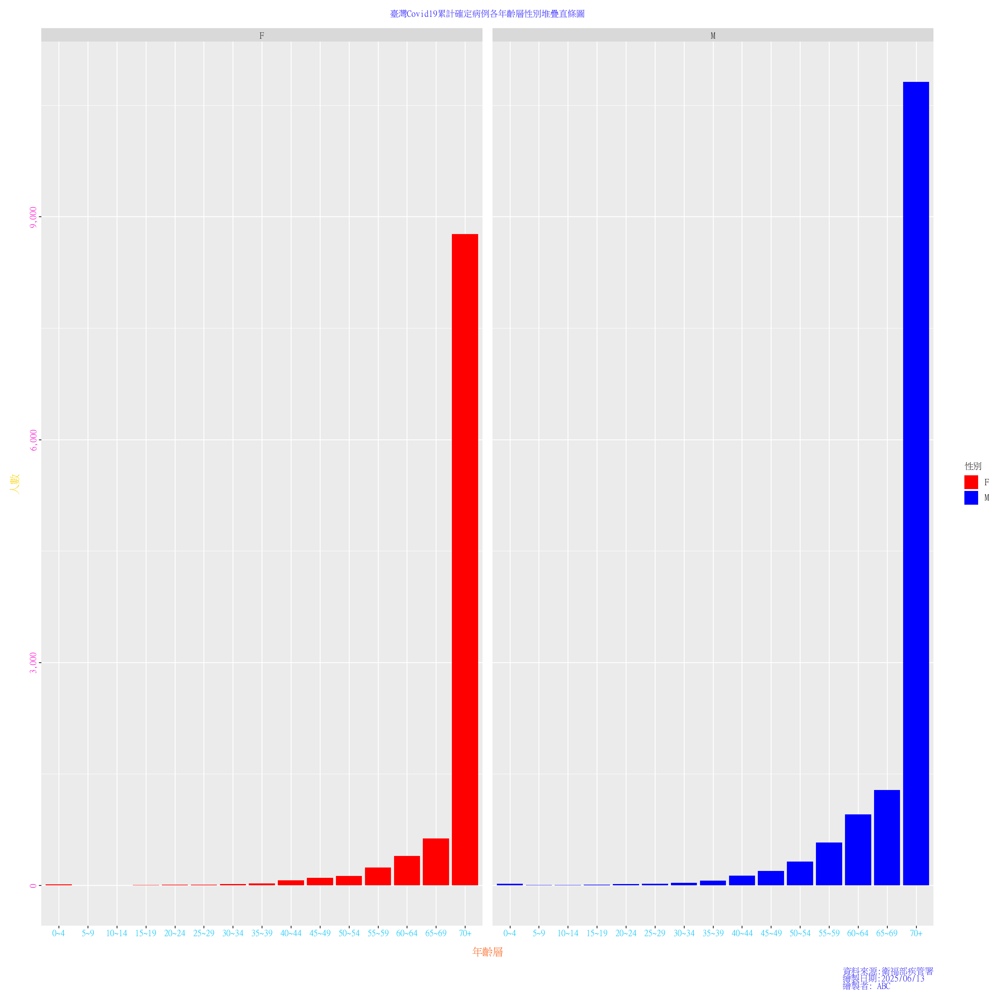

In [ ]:
# Use the correct dataframe gender_age_df which contains the '年齡層' column
ggplot(data=gender_age_df, mapping=aes(x='年齡層', y='死亡病例數', fill='性別')) +\
    geom_bar(stat='identity') +\
    scale_y_continuous(labels=comma_format()) +\
    scale_color_manual(values=['red','blue'],aesthetics=['fill'])+\
    labs( title='臺灣Covid19累計確定病例各年齡層性別堆疊直條圖',
        x='年齡層', # Correct the x-axis label to match the mapped column
        y='人數',
        caption='資料來源:衛福部疾管署\n繪製日期:' + pd.Timestamp("today").strftime("%Y/%m/%d") + '\n繪製者: ABC'
    ) +\
    theme(text=element_text(fontproperties=aaa),
        plot_title=element_text(fontproperties=aaa, color='#1105fc', weight='bold', ha='center', size=14),
        axis_title_x=element_text(fontproperties=aaa, style='italic', color='#fc5305', ha='center', size=12),
        axis_title_y=element_text(fontproperties=aaa, color='#fcd305', size=12),
        axis_text_x=element_text(fontproperties=aaa, color='#05c7fc', size=10, ha='center'),
        axis_text_y=element_text(fontproperties=aaa, color='#fc05cf', rotation=90, size=10, va='center'),
        plot_caption=element_text(fontproperties=aaa, color='#2318f0', size=10),
        figure_size=(16,16))+\
    facet_wrap('性別')

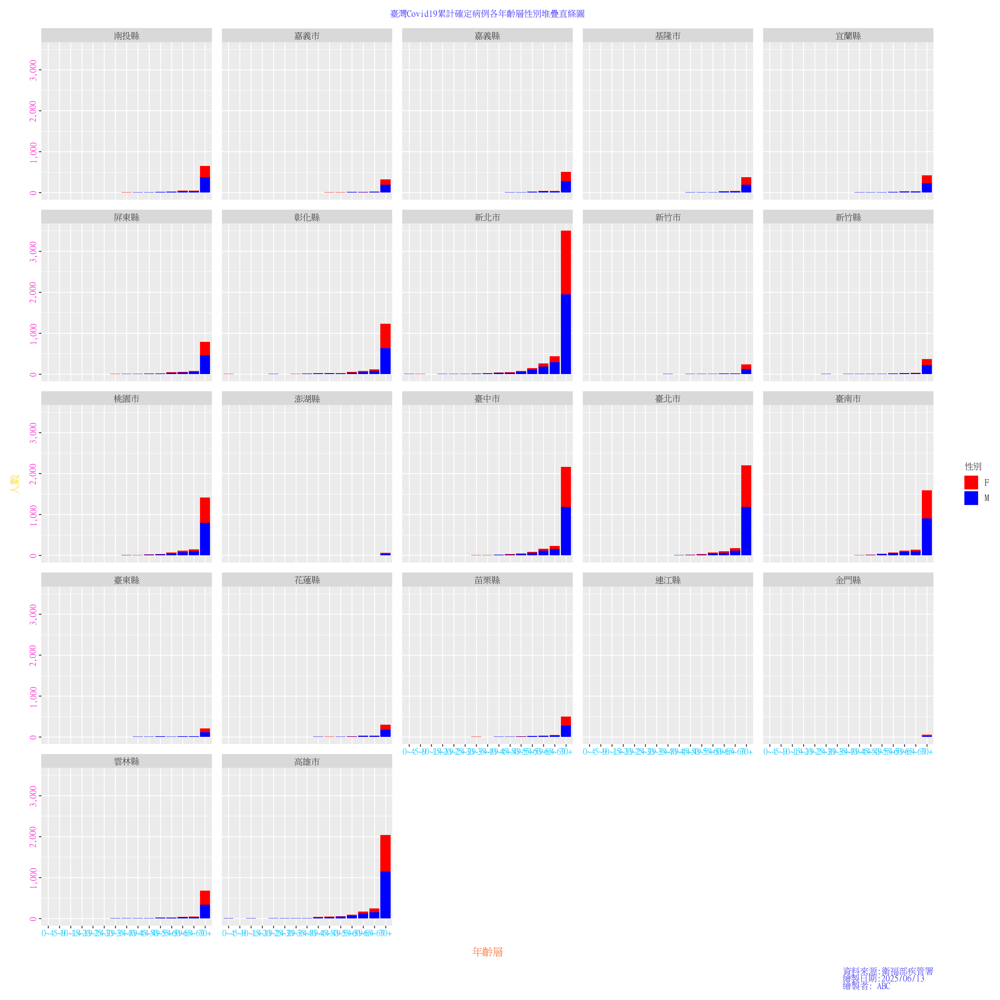

In [ ]:
# Use the correct dataframe covid_df_4 which contains the '縣市' column for facetting
ggplot(data=covid_df_4, mapping=aes(x='年齡層', y='死亡病例數', fill='性別')) +\
    geom_bar(stat='identity') +\
    scale_y_continuous(labels=comma_format()) +\
    scale_color_manual(values=['red','blue'],aesthetics=['fill'])+\
    labs( title='臺灣Covid19累計確定病例各年齡層性別堆疊直條圖',
        x='年齡層', # Correct the x-axis label to match the mapped column
        y='人數',
        caption='資料來源:衛福部疾管署\n繪製日期:' + pd.Timestamp("today").strftime("%Y/%m/%d") + '\n繪製者: ABC'
    ) +\
    theme(text=element_text(fontproperties=aaa),
        plot_title=element_text(fontproperties=aaa, color='#1105fc', weight='bold', ha='center', size=14),
        axis_title_x=element_text(fontproperties=aaa, style='italic', color='#fc5305', ha='center', size=12),
        axis_title_y=element_text(fontproperties=aaa, color='#fcd305', size=12),
        axis_text_x=element_text(fontproperties=aaa, color='#05c7fc', size=10, ha='center'),
        axis_text_y=element_text(fontproperties=aaa, color='#fc05cf', rotation=90, size=10, va='center'),
        plot_caption=element_text(fontproperties=aaa, color='#2318f0', size=10),
        figure_size=(16,16))+\
    facet_wrap('縣市')

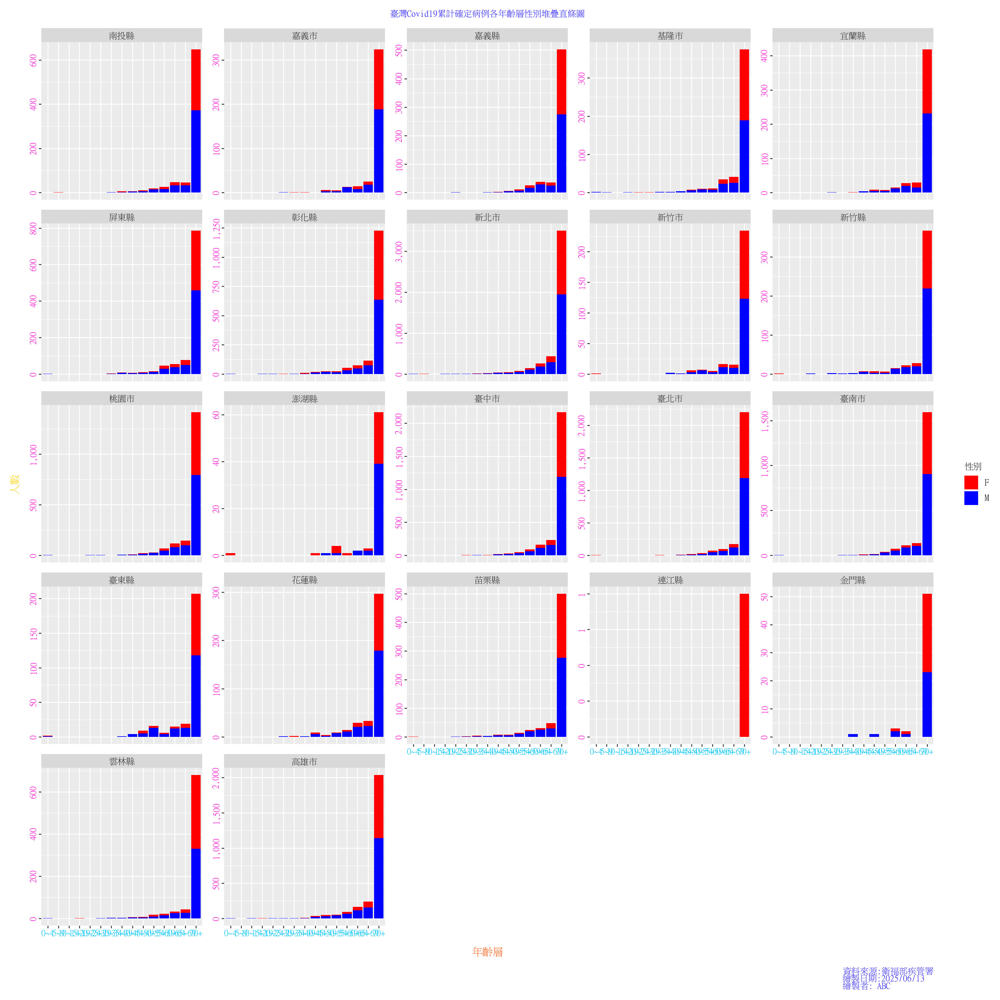

In [ ]:

ggplot(data=covid_df_4, mapping=aes(x='年齡層', y='死亡病例數', fill='性別')) +\
    geom_bar(stat='identity') +\
    scale_y_continuous(labels=comma_format()) +\
    scale_color_manual(values=['red','blue'],aesthetics=['fill'])+\
    labs( title='臺灣Covid19累計確定病例各年齡層性別堆疊直條圖',
        x='年齡層',
        y='人數',
        caption='資料來源:衛福部疾管署\n繪製日期:' + pd.Timestamp("today").strftime("%Y/%m/%d") + '\n繪製者: ABC'
    ) +\
    theme(text=element_text(fontproperties=aaa),
        plot_title=element_text(fontproperties=aaa, color='#1105fc', weight='bold', ha='center', size=14),
        axis_title_x=element_text(fontproperties=aaa, style='italic', color='#fc5305', ha='center', size=12),
        axis_title_y=element_text(fontproperties=aaa, color='#fcd305', size=12),
        axis_text_x=element_text(fontproperties=aaa, color='#05c7fc', size=10, ha='center'),
        axis_text_y=element_text(fontproperties=aaa, color='#fc05cf', rotation=90, size=10, va='center'),
        plot_caption=element_text(fontproperties=aaa, color='#2318f0', size=10),
        figure_size=(16,16))+\
    facet_wrap('縣市',scales='free_y')

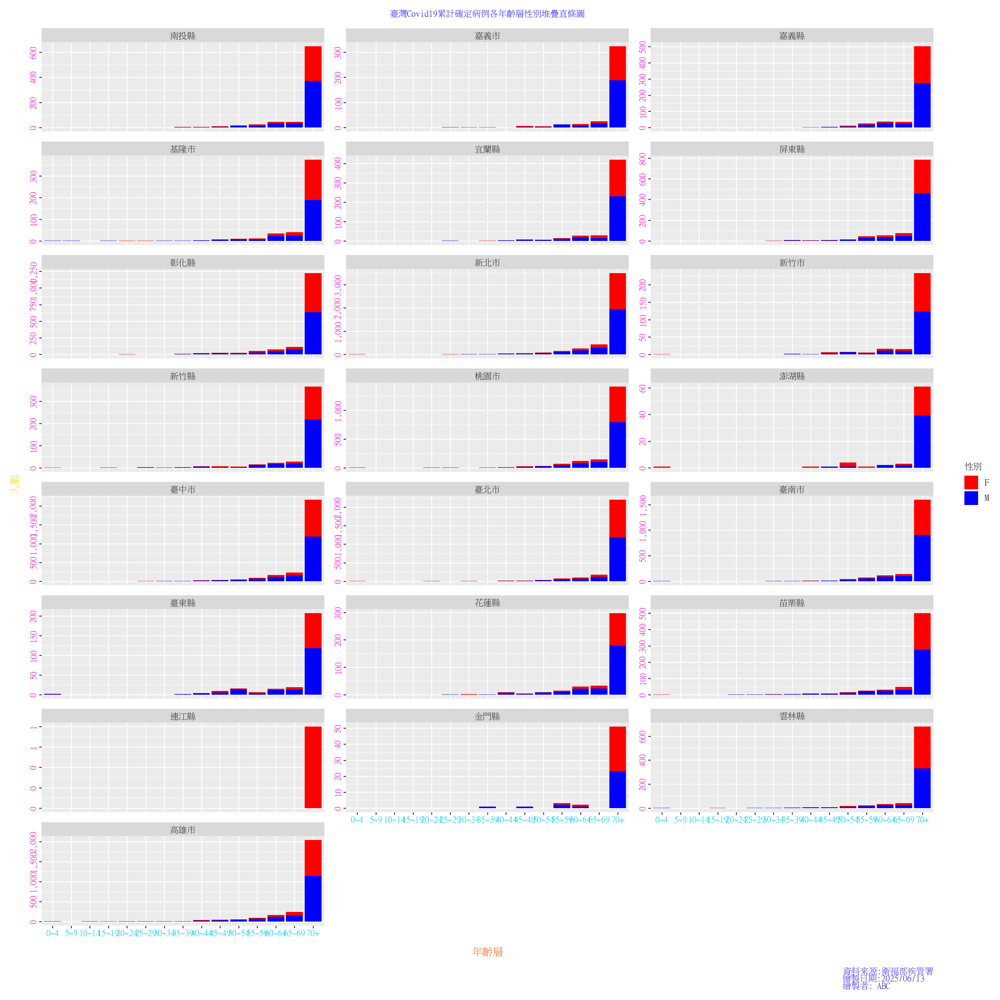

In [ ]:

ggplot(data=covid_df_4, mapping=aes(x='年齡層', y='死亡病例數', fill='性別')) +\
    geom_bar(stat='identity') +\
    scale_y_continuous(labels=comma_format()) +\
    scale_color_manual(values=['red','blue'],aesthetics=['fill'])+\
    labs( title='臺灣Covid19累計確定病例各年齡層性別堆疊直條圖',
        x='年齡層',
        y='人數',
        caption='資料來源:衛福部疾管署\n繪製日期:' + pd.Timestamp("today").strftime("%Y/%m/%d") + '\n繪製者: ABC'
    ) +\
    theme(text=element_text(fontproperties=aaa),
        plot_title=element_text(fontproperties=aaa, color='#1105fc', weight='bold', ha='center', size=14),
        axis_title_x=element_text(fontproperties=aaa, style='italic', color='#fc5305', ha='center', size=12),
        axis_title_y=element_text(fontproperties=aaa, color='#fcd305', size=12),
        axis_text_x=element_text(fontproperties=aaa, color='#05c7fc', size=10, ha='center'),
        axis_text_y=element_text(fontproperties=aaa, color='#fc05cf', rotation=90, size=10, va='center'),
        plot_caption=element_text(fontproperties=aaa, color='#2318f0', size=10),
        figure_size=(16,16))+\
    facet_wrap('縣市',scales='free_y',ncol=3)

# w17

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [ ]:
gender_age_df=(covid_df[['性別','年齡層','死亡病例數']]
            .groupby(['性別','年齡層'])
            .sum()
            .reset_index())
gender_age_df.head()

<ipython-input-274-3639991070>:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.


,性別,年齡層,死亡病例數
0,F,0~4,14
1,F,5~9,2
2,F,10~14,1
3,F,15~19,3
4,F,20~24,7


In [ ]:
age_df = (gender_age_df[['年齡層','死亡病例數']]
          .groupby('年齡層')
          .sum()
          .sort_values (by='死亡病例數', ascending=True)
          .reset_index())
age_df ['年齡層']

<ipython-input-277-1708744751>:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.


,年齡層
0,10~14
1,5~9
2,15~19
3,20~24
4,25~29
5,0~4
6,30~34
7,35~39
8,40~44
9,45~49


In [ ]:
age_order= age_df['年齡層'].astype(str)
age_order

,年齡層
0,10~14
1,5~9
2,15~19
3,20~24
4,25~29
5,0~4
6,30~34
7,35~39
8,40~44
9,45~49


In [ ]:
from pandas.api.types import CategoricalDtype
age_type = CategoricalDtype (categories=age_order, ordered=True)
age_type

CategoricalDtype(categories=['10~14', '5~9', '15~19', '20~24', '25~29', '0~4', '30~34',
                  '35~39', '40~44', '45~49', '50~54', '55~59', '60~64',
                  '65~69', '70+'],
, ordered=True, categories_dtype=object)

In [ ]:
gender_age_df.dtypes

,0
性別,object
年齡層,category
死亡病例數,int64


In [ ]:
gender_age_df ['年齡層'] = gender_age_df ['年齡層'].astype(age_type)
gender_age_df['年齡層'].dtype

CategoricalDtype(categories=['10~14', '5~9', '15~19', '20~24', '25~29', '0~4', '30~34',
                  '35~39', '40~44', '45~49', '50~54', '55~59', '60~64',
                  '65~69', '70+'],
, ordered=True, categories_dtype=object)

In [ ]:
gender_age_df. loc [gender_age_df['性別']=='男','確定病例数']=-gender_age_df.loc [gender_age_df['性別']=='男','死亡病例數']

In [ ]:
gender_age_df

,性別,年齡層,死亡病例數,確定病例数
0,F,0~4,14,NaN
1,F,5~9,2,NaN
2,F,10~14,1,NaN
3,F,15~19,3,NaN
4,F,20~24,7,NaN
5,F,25~29,10,NaN
6,F,30~34,16,NaN
7,F,35~39,26,NaN
8,F,40~44,69,NaN
9,F,45~49,99,NaN


In [ ]:
ticks= 50000

In [ ]:
(gender_age_df['死亡病例數']. min() // ticks) * ticks

0

In [ ]:
((gender_age_df['死亡病例數']. max() // ticks) +2) * ticks

100000

In [ ]:
np.arange((gender_age_df ['死亡病例數'].min() // ticks) * ticks,
((gender_age_df['死亡病例數']. max() // ticks) + 2) * ticks, ticks)


array([    0, 50000])

In [ ]:
(gender_age_df ['死亡病例數'].min() // ticks) * ticks


0

In [ ]:
((gender_age_df['死亡病例數'].max() // ticks) + 1) * ticks

50000

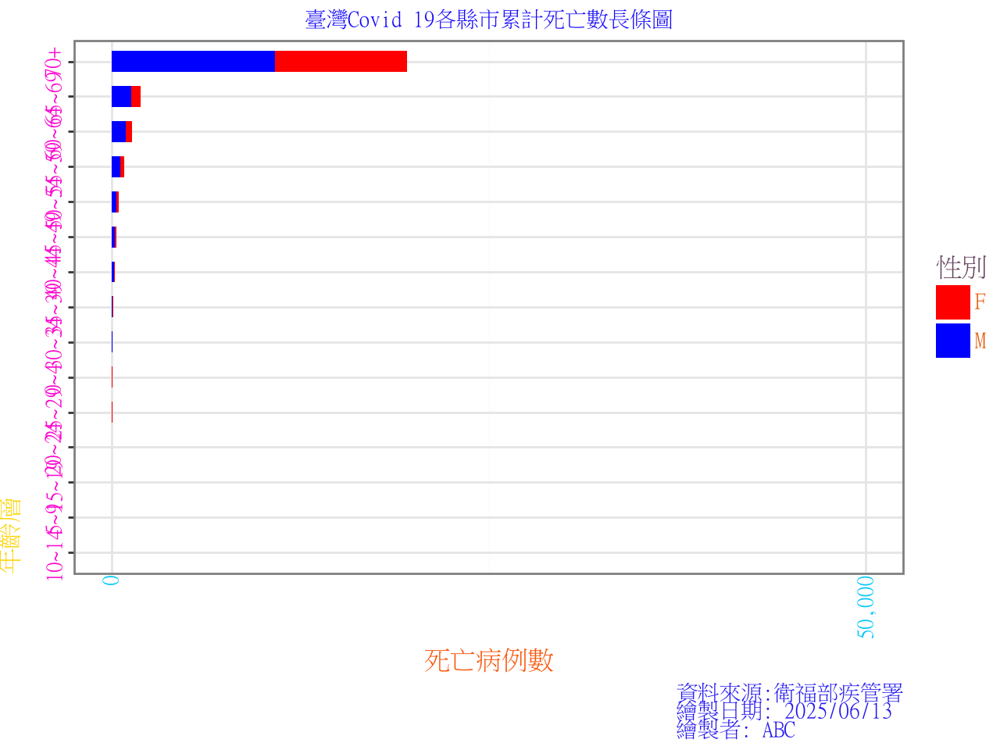

In [ ]:
ggplot(gender_age_df, aes(x='年齡層', y='死亡病例數', fill='性別')) + \
    geom_bar(stat='identity',width=0.6) + \
    scale_y_continuous(breaks=np.arange((gender_age_df['死亡病例數']. min() // ticks) * ticks,
             ((gender_age_df['死亡病例數']. max() // ticks) +2) * ticks, ticks),
              limits=[(gender_age_df['死亡病例數'].min() // ticks) * ticks,
                  ((gender_age_df['死亡病例數'].max() // ticks) + 1) * ticks],
              labels=comma_format()) + \
    labs(title='臺灣Covid 19各縣市累計死亡數長條圖',
        x='年齡層',
        y='死亡病例數',
        fill='性別',
        caption='資料來源:衛福部疾管署\n繪製日期: ' + pd.Timestamp("today").strftime("%Y/%m/%d") + '\n繪製者: ABC'
    ) + \
    scale_color_manual (values=['red', 'blue'], aesthetics=['fill']) +\
    coord_flip() + \
    theme_bw() + \
    theme(
        text=element_text(fontproperties=aaa),
        plot_title=element_text(fontproperties=aaa, color='#1105fc', weight='bold', ha='center', size=14),
        axis_title_x=element_text(fontproperties=aaa, style='italic', color='#fc5305', ha='center', size=12),
        axis_title_y=element_text(fontproperties=aaa, color='#fcd305', va='bottom', ha='center', size=12),
        axis_text_x=element_text(fontproperties=aaa, color='#05c7fc', rotation=90, size=10, ha='center'),
        axis_text_y=element_text(fontproperties=aaa, color='#fc05cf', rotation=90, size=10, va='center'),
        axis_ticks_major_x=element_blank(),
        plot_caption=element_text(fontproperties=aaa, color='#2318f0', size=10),
        legend_title=element_text(fontproperties=aaa, color='#664460', size=12),
        legend_text=element_text(fontproperties=aaa, color='#e65b0b', size=10)
    )